In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch
from torchvision.transforms import ToTensor
import timm
from torchvision import datasets, transforms
from torch.utils.data import Dataset, DataLoader, random_split
import torch.nn as nn
from sklearn.metrics import roc_auc_score, roc_curve, auc, precision_score, recall_score

In [ ]:
torch.cuda.is_available()

True

В рамках DL экспериментов мы разморозили веса Efficientnet V2_l, который использовали ранее, и дообучили на нашем датасете.

В ходе экспериментов мы меняли следующие параметры:

- Количество блоков слоев, участвующих в обучении: от 1 до 7

- Scheduler для параметра learning rate: ReduceLROnPlateau или CosineAnnealingLR

- Классификатор модели: один линейный слой или несколько линейных слоев с ReLu и Dropout

# N_freeze = 0

### N_freeze = 0, ReduceLROnPlateau scheduler, no additional layers

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


Epoch 1/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.26it/s, loss=0.5867]


Epoch 1/15 completed - Train Loss: 0.6844, Val Loss: 0.3384, Val Accuracy: 88.22%, Val Precision: 0.8268, Val Recall: 0.8876

Best model saved at epoch 1 with val loss: 0.3384


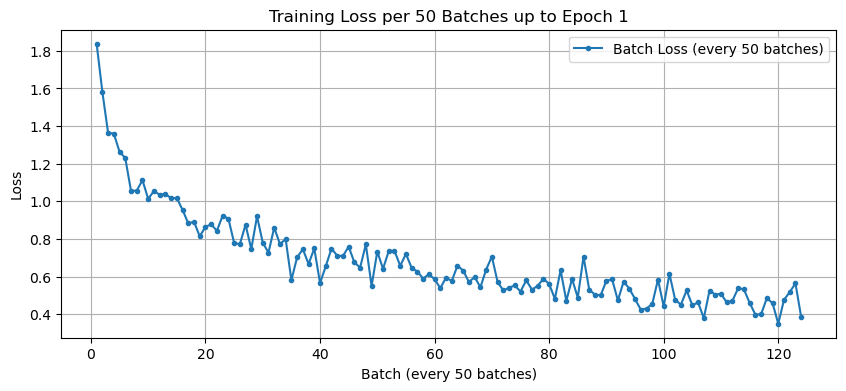

Epoch 2/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.23it/s, loss=0.1399]


Epoch 2/15 completed - Train Loss: 0.2788, Val Loss: 0.2035, Val Accuracy: 92.79%, Val Precision: 0.8885, Val Recall: 0.9346

Best model saved at epoch 2 with val loss: 0.2035


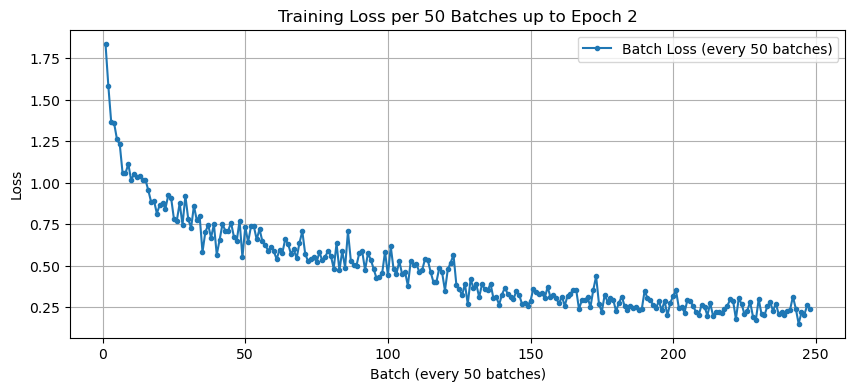

Epoch 3/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.13it/s, loss=0.5742]


Epoch 3/15 completed - Train Loss: 0.1202, Val Loss: 0.1215, Val Accuracy: 95.82%, Val Precision: 0.9364, Val Recall: 0.9635

Best model saved at epoch 3 with val loss: 0.1215


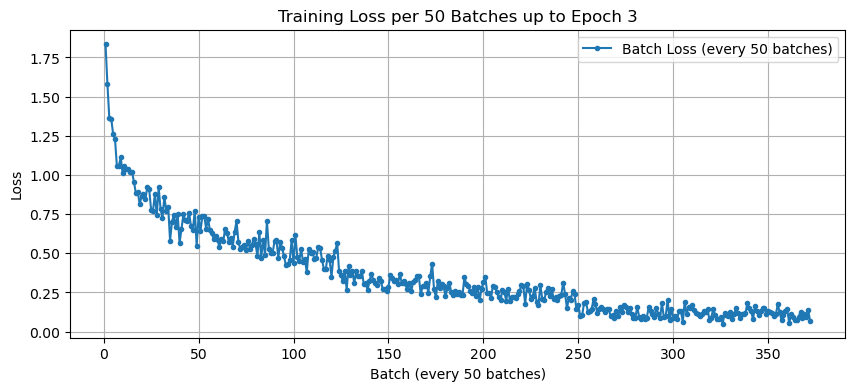

Epoch 4/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.11it/s, loss=0.0103]

Epoch 4/15 completed - Train Loss: 0.0617, Val Loss: 0.1393, Val Accuracy: 95.16%, Val Precision: 0.9085, Val Recall: 0.9573



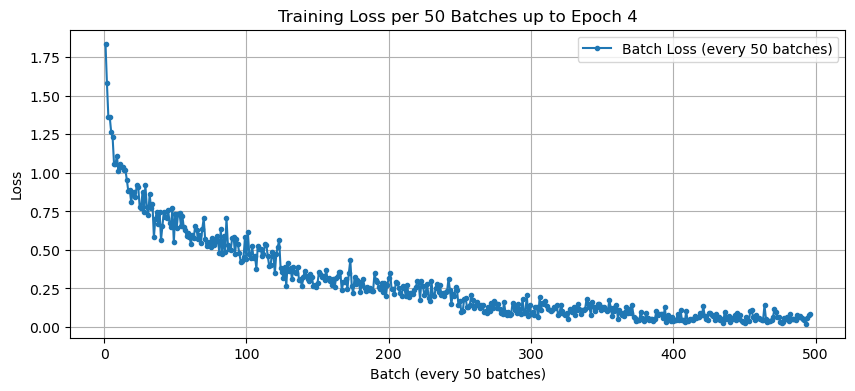

Epoch 5/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 28.03it/s, loss=0.3050]


Epoch 5/15 completed - Train Loss: 0.0430, Val Loss: 0.1180, Val Accuracy: 96.12%, Val Precision: 0.9382, Val Recall: 0.9685

Best model saved at epoch 5 with val loss: 0.1180


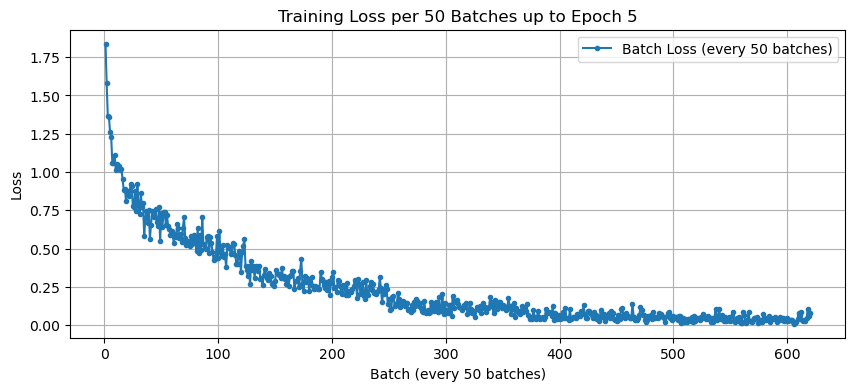

Epoch 6/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 28.04it/s, loss=0.3009]


Epoch 6/15 completed - Train Loss: 0.0316, Val Loss: 0.1176, Val Accuracy: 96.30%, Val Precision: 0.9440, Val Recall: 0.9702

Best model saved at epoch 6 with val loss: 0.1176


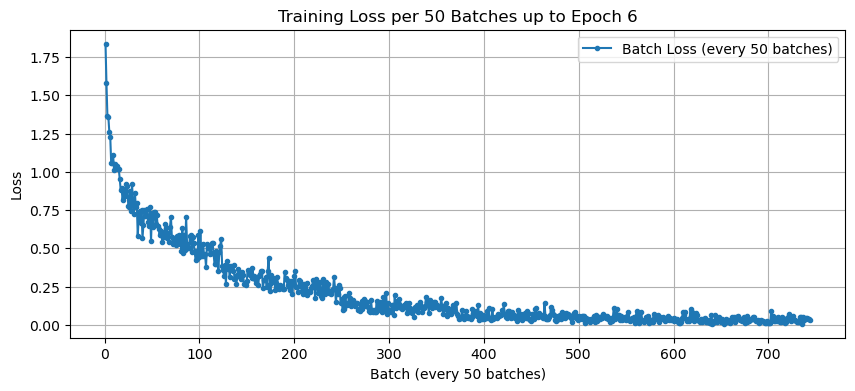

Epoch 7/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.27it/s, loss=0.1170]


Epoch 7/15 completed - Train Loss: 0.0250, Val Loss: 0.0729, Val Accuracy: 97.57%, Val Precision: 0.9729, Val Recall: 0.9802

Best model saved at epoch 7 with val loss: 0.0729


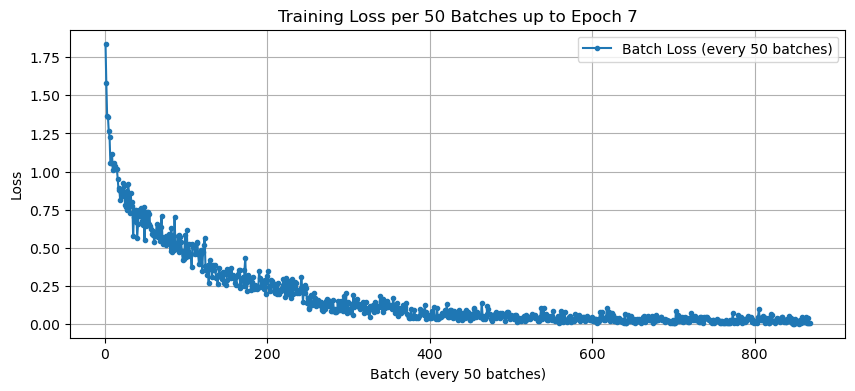

Epoch 8/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.94it/s, loss=0.1230]

Epoch 8/15 completed - Train Loss: 0.0227, Val Loss: 0.0903, Val Accuracy: 96.93%, Val Precision: 0.9530, Val Recall: 0.9736



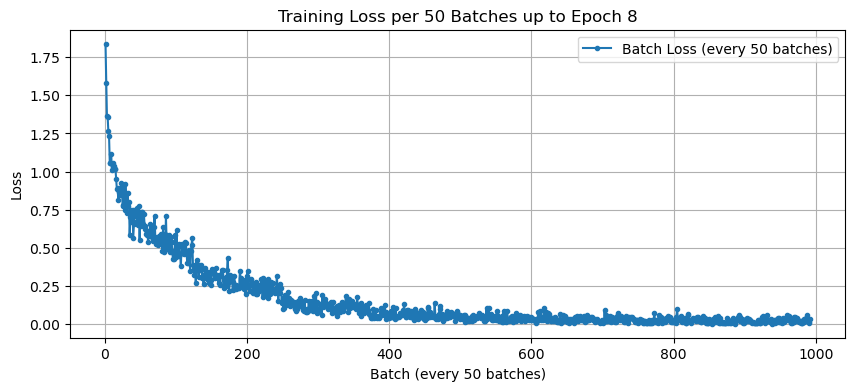

Epoch 9/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.97it/s, loss=0.0844]

Epoch 9/15 completed - Train Loss: 0.0193, Val Loss: 0.0892, Val Accuracy: 97.39%, Val Precision: 0.9694, Val Recall: 0.9690

Early stopping triggered after 9 epochs.


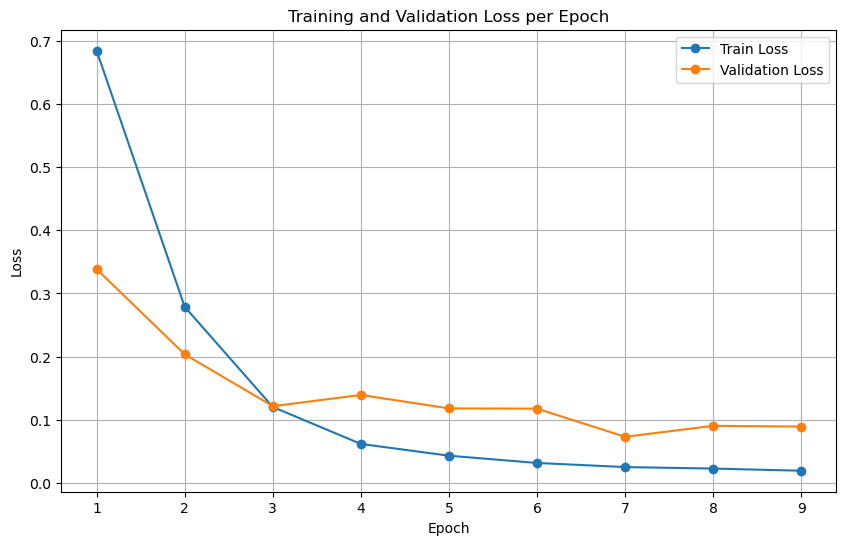

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 0 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_0_plwateau.pt'

data_dir = "480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding new head:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=1, factor=0.5)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

### N_freeze = 0, CosineAnnealingLR scheduler, no additional layers

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


Epoch 1/15 [Val]: 100%|██████████| 2077/2077 [01:12<00:00, 28.48it/s, loss=0.5731]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 1/15 completed - Train Loss: 0.6945, Val Loss: 0.3065, Val Accuracy: 90.27%, Val Precision: 0.8564, Val Recall: 0.9023

Best model saved at epoch 1 with val loss: 0.3065


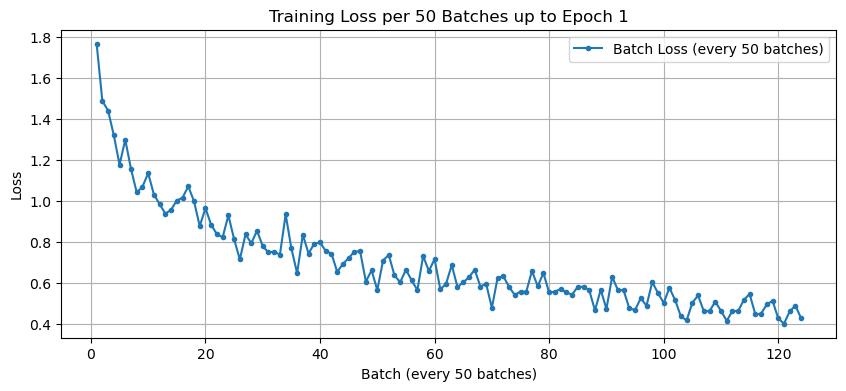

Epoch 2/15 [Val]: 100%|██████████| 2077/2077 [01:12<00:00, 28.51it/s, loss=0.3296]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 2/15 completed - Train Loss: 0.2821, Val Loss: 0.1734, Val Accuracy: 94.42%, Val Precision: 0.9342, Val Recall: 0.9532

Best model saved at epoch 2 with val loss: 0.1734


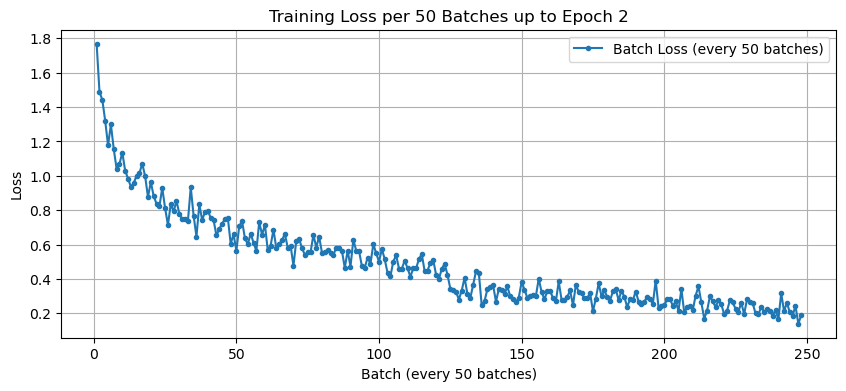

Epoch 3/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.15it/s, loss=0.5730]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 3/15 completed - Train Loss: 0.1211, Val Loss: 0.1583, Val Accuracy: 94.27%, Val Precision: 0.9336, Val Recall: 0.9527

Best model saved at epoch 3 with val loss: 0.1583


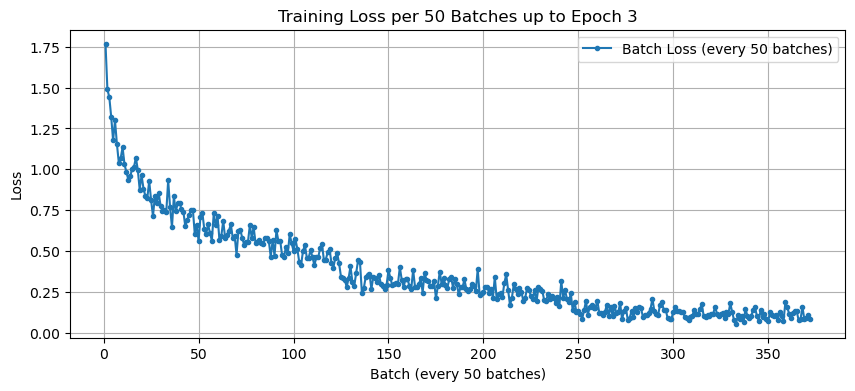

Epoch 4/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.13it/s, loss=0.0102]

Epoch 4/15 completed - Train Loss: 0.0638, Val Loss: 0.1620, Val Accuracy: 94.82%, Val Precision: 0.9260, Val Recall: 0.9552




C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


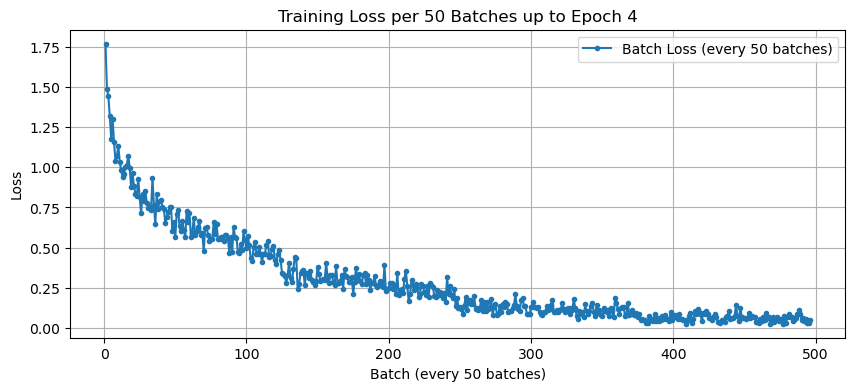

Epoch 5/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.20it/s, loss=0.0108]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 5/15 completed - Train Loss: 0.0416, Val Loss: 0.1029, Val Accuracy: 96.52%, Val Precision: 0.9576, Val Recall: 0.9682

Best model saved at epoch 5 with val loss: 0.1029


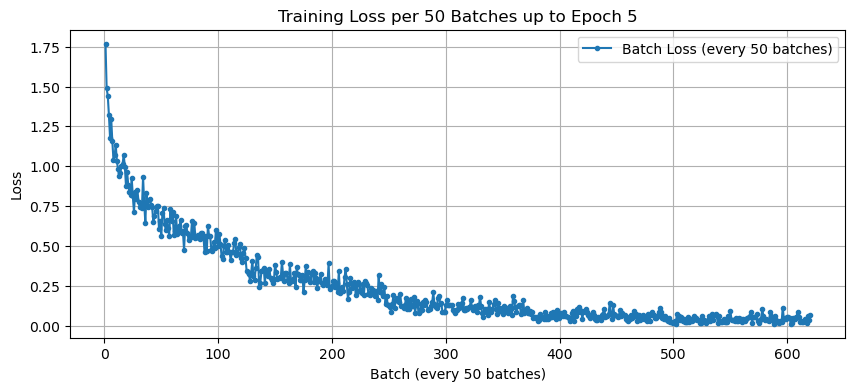

Epoch 6/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.20it/s, loss=0.0055]

Epoch 6/15 completed - Train Loss: 0.0309, Val Loss: 0.1219, Val Accuracy: 96.10%, Val Precision: 0.9569, Val Recall: 0.9580




C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


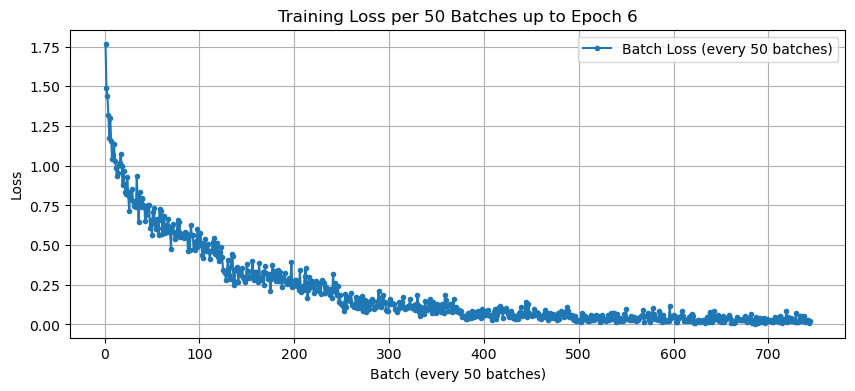

Epoch 7/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.14it/s, loss=0.0031]

Epoch 7/15 completed - Train Loss: 0.0297, Val Loss: 0.1294, Val Accuracy: 95.71%, Val Precision: 0.9271, Val Recall: 0.9637

Early stopping triggered after 7 epochs.



C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


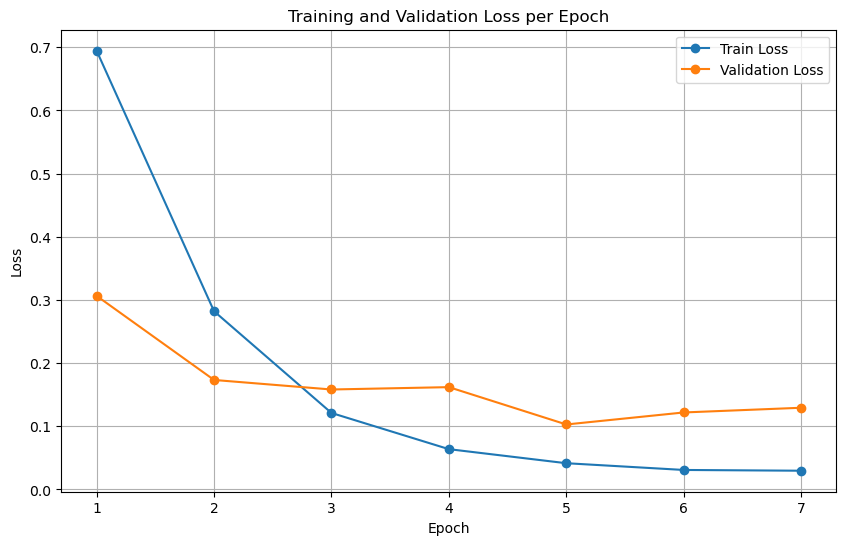

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 0 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_0_cosine.pt'

data_dir = "480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding new head:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

### N_freeze = 0, ReduceLROnPlateau scheduler, custom head

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


Epoch 1/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.16it/s, loss=1.1598]


Epoch 1/15 completed - Train Loss: 0.9679, Val Loss: 0.4657, Val Accuracy: 84.95%, Val Precision: 0.6864, Val Recall: 0.7158

Best model saved at epoch 1 with val loss: 0.4657


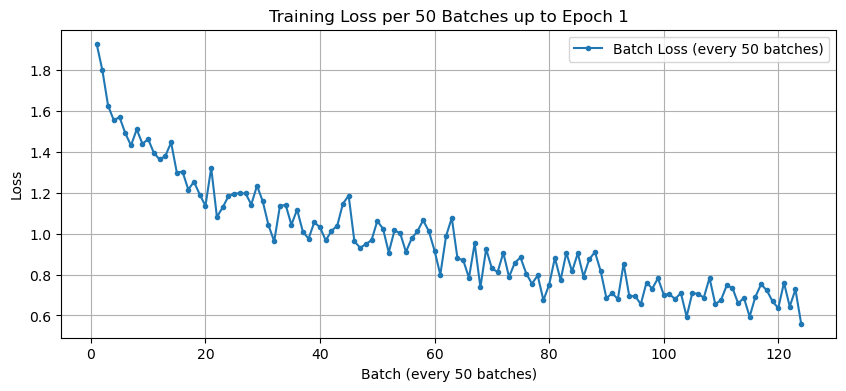

Epoch 2/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.08it/s, loss=0.3576]


Epoch 2/15 completed - Train Loss: 0.4374, Val Loss: 0.2515, Val Accuracy: 91.65%, Val Precision: 0.8844, Val Recall: 0.8753

Best model saved at epoch 2 with val loss: 0.2515


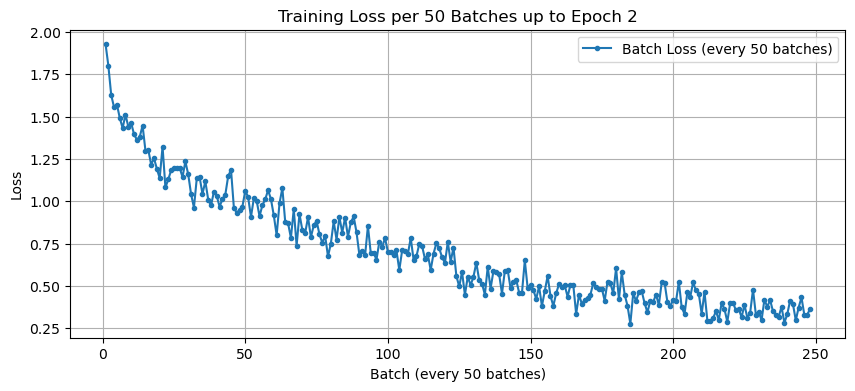

Epoch 3/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.08it/s, loss=0.1465]


Epoch 3/15 completed - Train Loss: 0.1947, Val Loss: 0.1939, Val Accuracy: 93.37%, Val Precision: 0.9402, Val Recall: 0.9276

Best model saved at epoch 3 with val loss: 0.1939


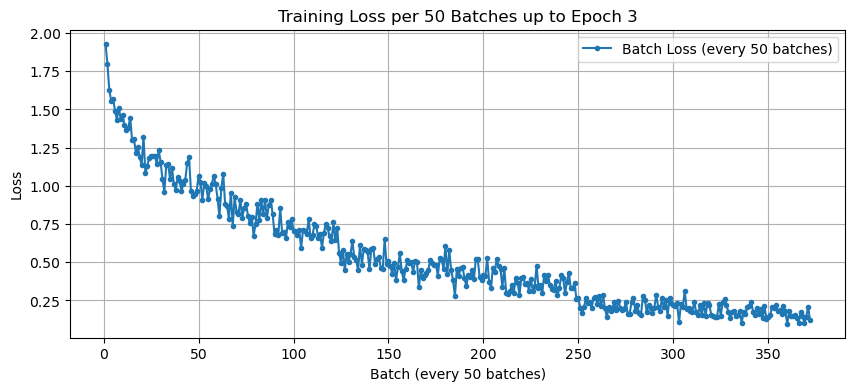

Epoch 4/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 28.06it/s, loss=0.0587]


Epoch 4/15 completed - Train Loss: 0.1019, Val Loss: 0.1839, Val Accuracy: 94.43%, Val Precision: 0.9291, Val Recall: 0.9500

Best model saved at epoch 4 with val loss: 0.1839


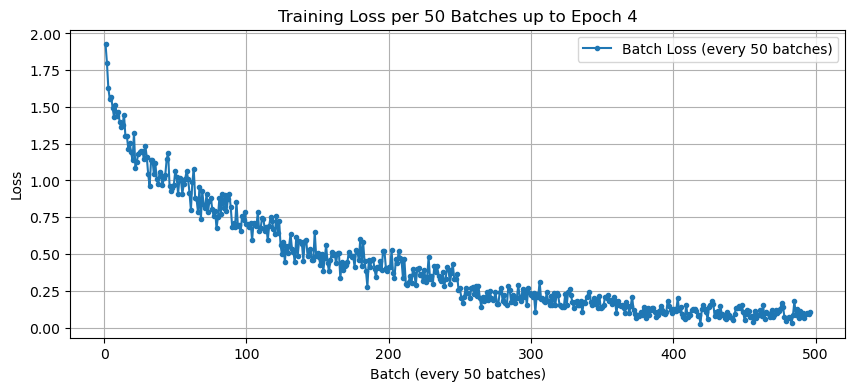

Epoch 5/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.10it/s, loss=0.4895]


Epoch 5/15 completed - Train Loss: 0.0650, Val Loss: 0.1240, Val Accuracy: 96.09%, Val Precision: 0.9539, Val Recall: 0.9599

Best model saved at epoch 5 with val loss: 0.1240


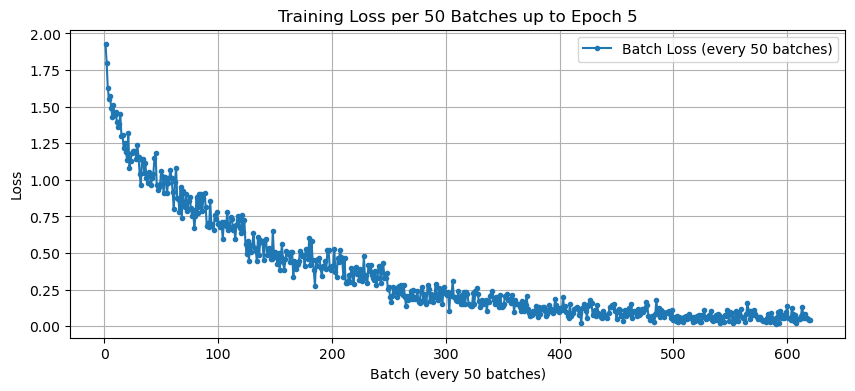

Epoch 6/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.08it/s, loss=0.0193]

Epoch 6/15 completed - Train Loss: 0.0506, Val Loss: 0.1433, Val Accuracy: 95.93%, Val Precision: 0.9381, Val Recall: 0.9654



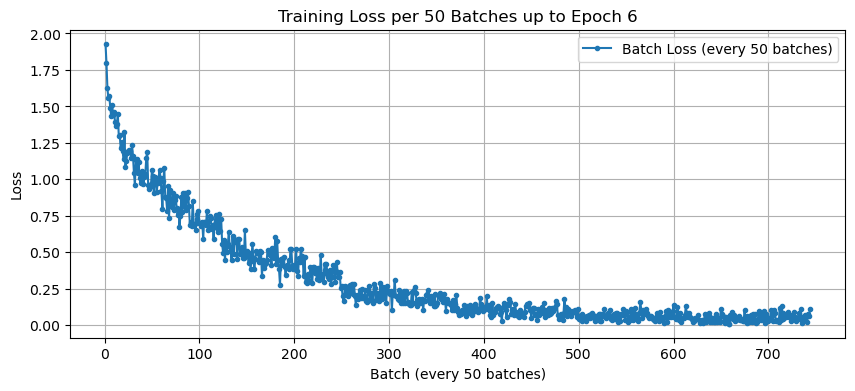

Epoch 7/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.13it/s, loss=0.0252]


Epoch 7/15 completed - Train Loss: 0.0401, Val Loss: 0.1091, Val Accuracy: 96.62%, Val Precision: 0.9530, Val Recall: 0.9669

Best model saved at epoch 7 with val loss: 0.1091


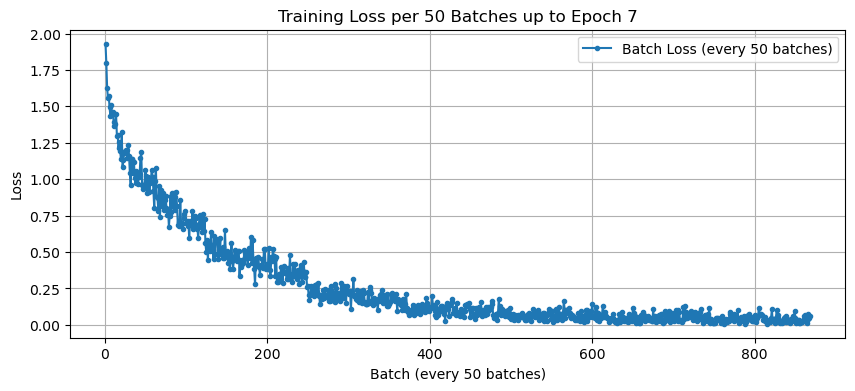

Epoch 8/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.34it/s, loss=0.1174]

Epoch 8/15 completed - Train Loss: 0.0352, Val Loss: 0.1184, Val Accuracy: 96.55%, Val Precision: 0.9573, Val Recall: 0.9676



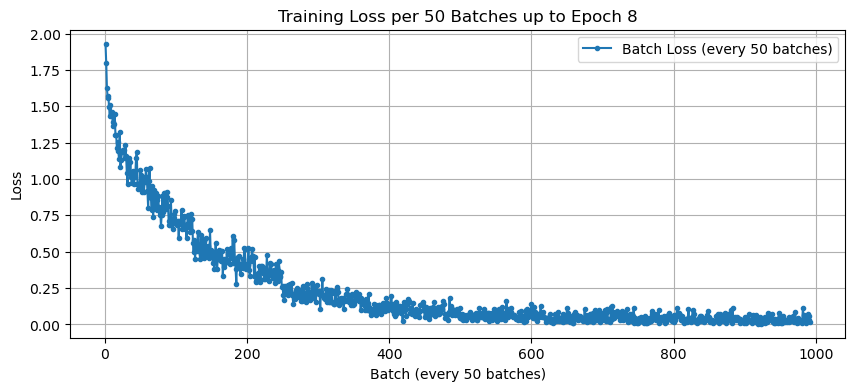

Epoch 9/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.17it/s, loss=0.0832]

Epoch 9/15 completed - Train Loss: 0.0292, Val Loss: 0.1299, Val Accuracy: 96.43%, Val Precision: 0.9479, Val Recall: 0.9697

Early stopping triggered after 9 epochs.


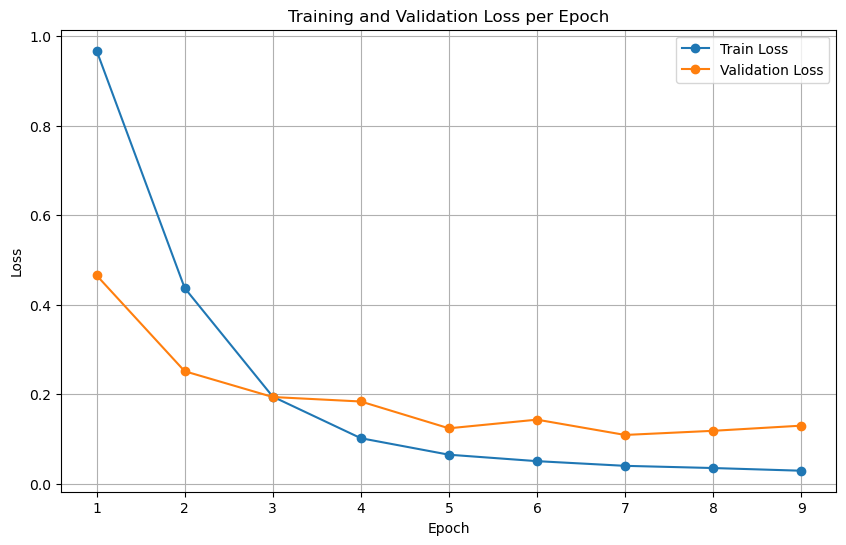

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 0 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_0_plateau_custom_head.pt'

data_dir = "480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding custom layers with dropout:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, 512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(256, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=1, factor=0.5)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

### N_freeze = 0, CosineAnnealingLR scheduler, custom head

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


Epoch 1/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 28.07it/s, loss=0.8445]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 1/15 completed - Train Loss: 0.9296, Val Loss: 0.4979, Val Accuracy: 83.96%, Val Precision: 0.6701, Val Recall: 0.7092

Best model saved at epoch 1 with val loss: 0.4979


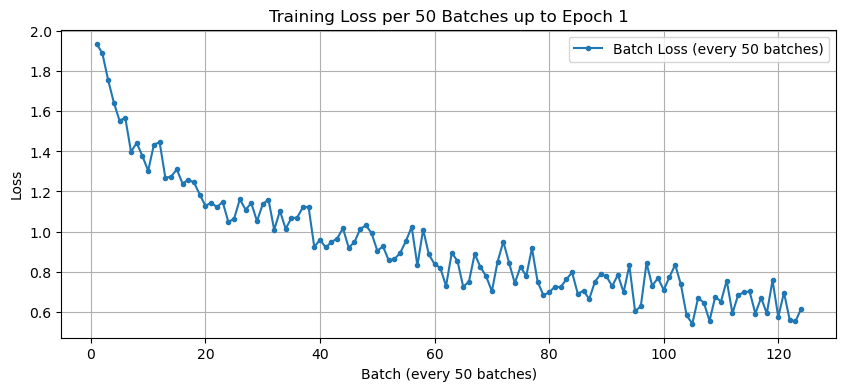

Epoch 2/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.14it/s, loss=0.4811]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 2/15 completed - Train Loss: 0.4174, Val Loss: 0.2896, Val Accuracy: 90.91%, Val Precision: 0.8483, Val Recall: 0.8697

Best model saved at epoch 2 with val loss: 0.2896


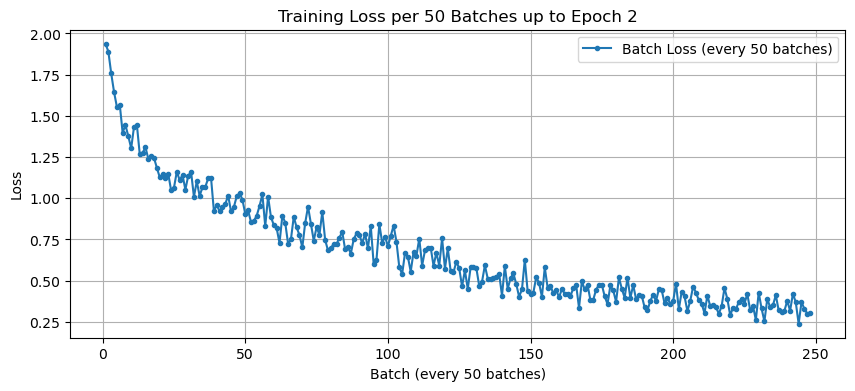

Epoch 3/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.17it/s, loss=0.0816]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 3/15 completed - Train Loss: 0.2008, Val Loss: 0.1897, Val Accuracy: 94.21%, Val Precision: 0.8933, Val Recall: 0.9487

Best model saved at epoch 3 with val loss: 0.1897


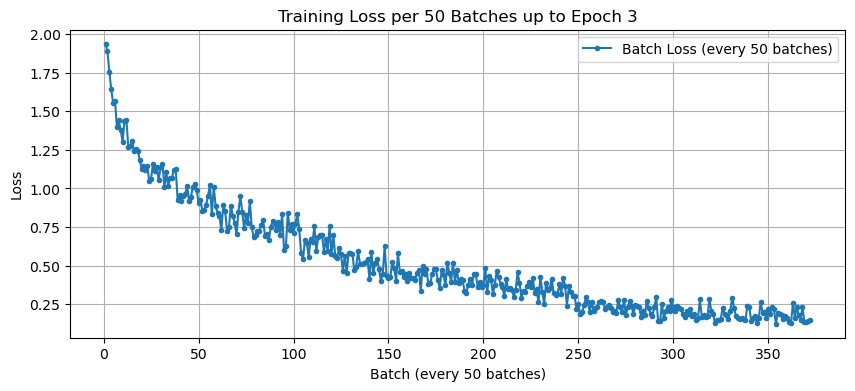

Epoch 4/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.14it/s, loss=0.0153]

Epoch 4/15 completed - Train Loss: 0.1000, Val Loss: 0.2013, Val Accuracy: 93.78%, Val Precision: 0.9097, Val Recall: 0.9422




C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


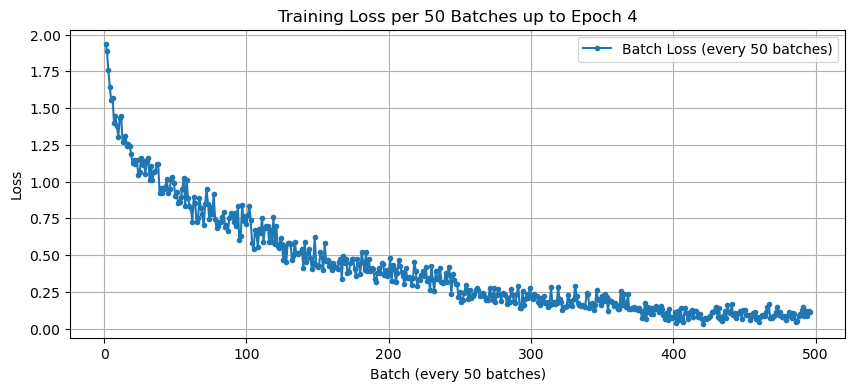

Epoch 5/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.96it/s, loss=0.0054]

Epoch 5/15 completed - Train Loss: 0.0677, Val Loss: 0.2736, Val Accuracy: 93.21%, Val Precision: 0.9379, Val Recall: 0.9405

Early stopping triggered after 5 epochs.



C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


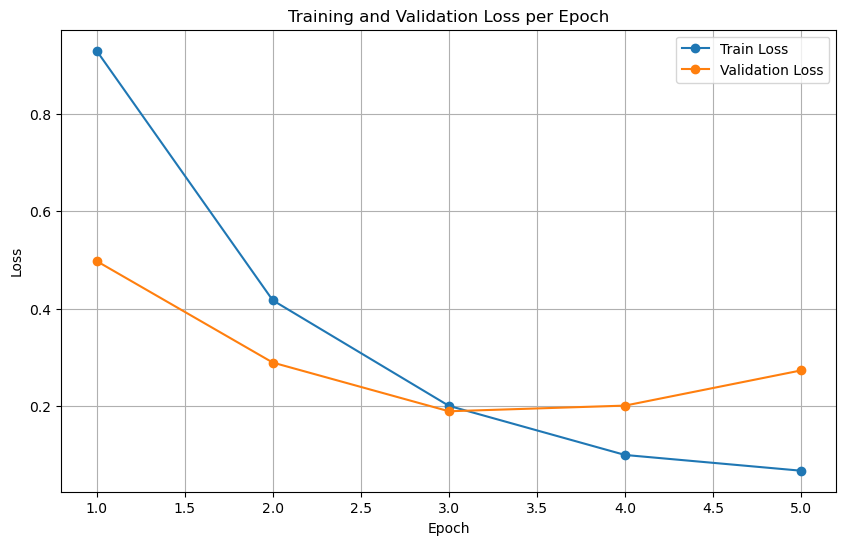

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 0 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_0_cosine_custom_head.pt'

data_dir = "480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding custom layers with dropout:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, 512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(256, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

# N_freeze = 1

### N_freeze = 1, ReduceLROnPlateau scheduler, no additional layers

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
Epoch 1/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.05it/s, loss=0.3381]


Epoch 1/15 completed - Train Loss: 0.6979, Val Loss: 0.3101, Val Accuracy: 89.61%, Val Precision: 0.8662, Val Recall: 0.8910

Best model saved at epoch 1 with val loss: 0.3101


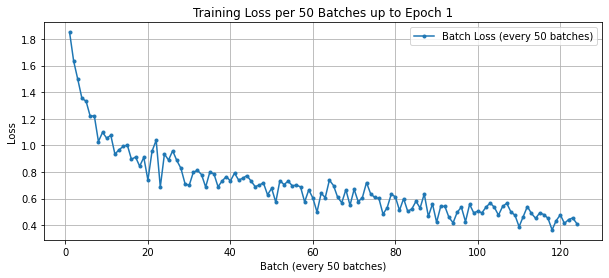

Epoch 2/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.07it/s, loss=0.1645]


Epoch 2/15 completed - Train Loss: 0.2855, Val Loss: 0.1859, Val Accuracy: 93.89%, Val Precision: 0.9023, Val Recall: 0.9524

Best model saved at epoch 2 with val loss: 0.1859


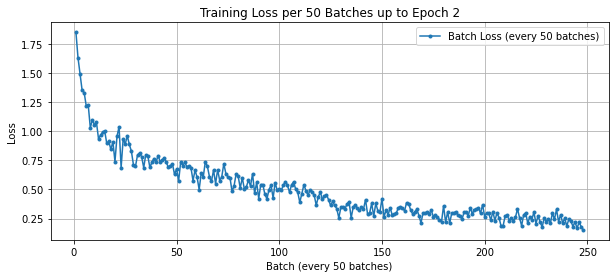

Epoch 3/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.06it/s, loss=0.2787]


Epoch 3/15 completed - Train Loss: 0.1232, Val Loss: 0.1162, Val Accuracy: 95.88%, Val Precision: 0.9538, Val Recall: 0.9668

Best model saved at epoch 3 with val loss: 0.1162


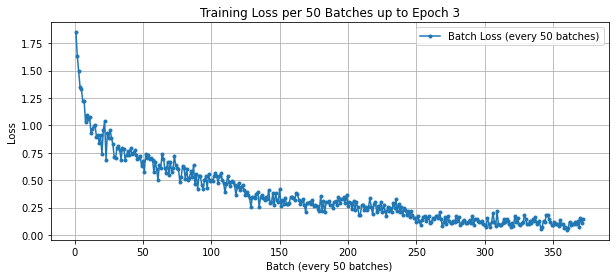

Epoch 4/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.07it/s, loss=0.3462]

Epoch 4/15 completed - Train Loss: 0.0644, Val Loss: 0.1215, Val Accuracy: 95.93%, Val Precision: 0.9288, Val Recall: 0.9660



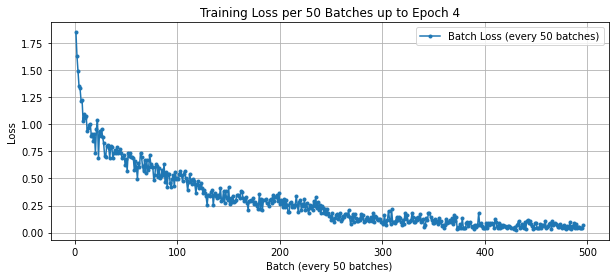

Epoch 5/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.08it/s, loss=0.1245]

Epoch 5/15 completed - Train Loss: 0.0427, Val Loss: 0.1529, Val Accuracy: 95.09%, Val Precision: 0.9165, Val Recall: 0.9630

Early stopping triggered after 5 epochs.


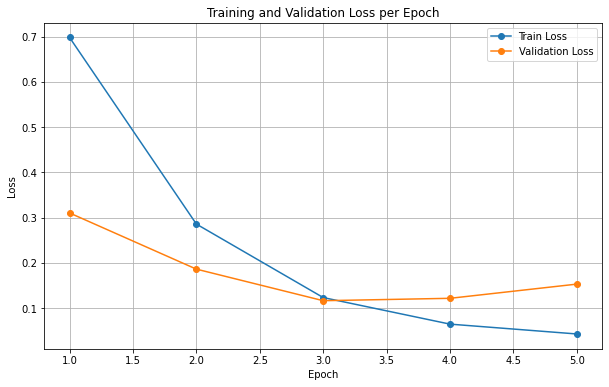

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 1 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_1_plateau.pt'

data_dir = r"C:/Users/User/images/480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding new head:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=1, factor=0.5, verbose=True)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

### N_freeze = 1, CosineAnnealingLR scheduler, no additional layers

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


Epoch 1/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.05it/s, loss=0.5041]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 1/15 completed - Train Loss: 0.6890, Val Loss: 0.3473, Val Accuracy: 87.99%, Val Precision: 0.8305, Val Recall: 0.8908

Best model saved at epoch 1 with val loss: 0.3473


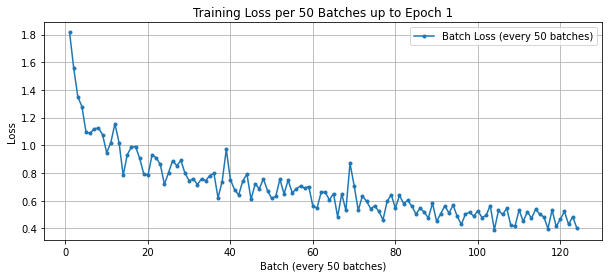

Epoch 2/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.07it/s, loss=0.2015]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 2/15 completed - Train Loss: 0.2851, Val Loss: 0.1681, Val Accuracy: 94.27%, Val Precision: 0.9136, Val Recall: 0.9557

Best model saved at epoch 2 with val loss: 0.1681


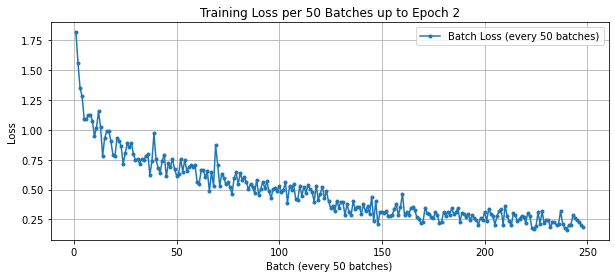

Epoch 3/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.05it/s, loss=0.0129]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 3/15 completed - Train Loss: 0.1248, Val Loss: 0.1164, Val Accuracy: 95.99%, Val Precision: 0.9368, Val Recall: 0.9678

Best model saved at epoch 3 with val loss: 0.1164


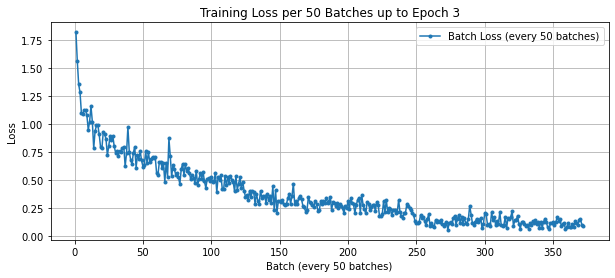

Epoch 4/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.08it/s, loss=0.6105]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 4/15 completed - Train Loss: 0.0643, Val Loss: 0.1139, Val Accuracy: 96.05%, Val Precision: 0.9433, Val Recall: 0.9643

Best model saved at epoch 4 with val loss: 0.1139


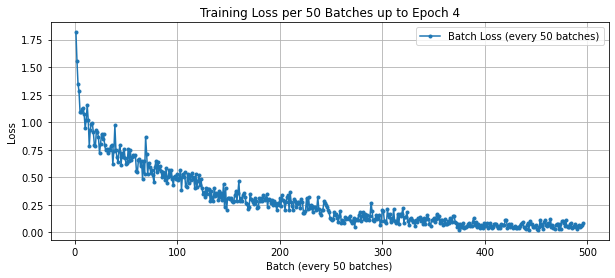

Epoch 5/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.07it/s, loss=0.0077]

Epoch 5/15 completed - Train Loss: 0.0452, Val Loss: 0.1315, Val Accuracy: 95.51%, Val Precision: 0.9363, Val Recall: 0.9637




C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


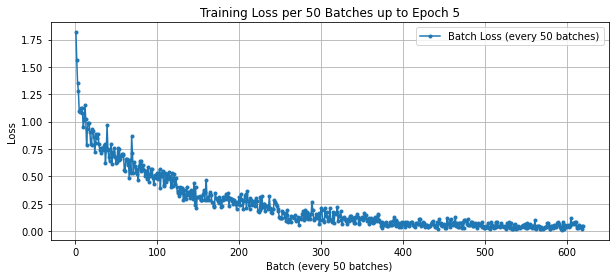

Epoch 6/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.06it/s, loss=0.0438]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 6/15 completed - Train Loss: 0.0335, Val Loss: 0.0817, Val Accuracy: 97.27%, Val Precision: 0.9581, Val Recall: 0.9751

Best model saved at epoch 6 with val loss: 0.0817


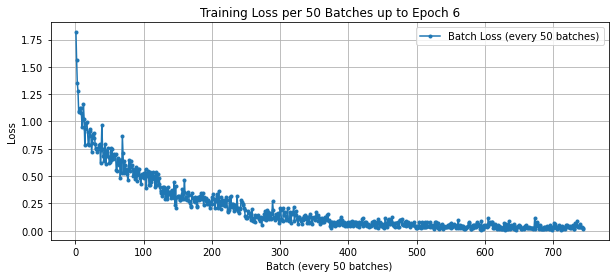

Epoch 7/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.04it/s, loss=0.1772]

Epoch 7/15 completed - Train Loss: 0.0267, Val Loss: 0.1021, Val Accuracy: 96.62%, Val Precision: 0.9480, Val Recall: 0.9728




C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


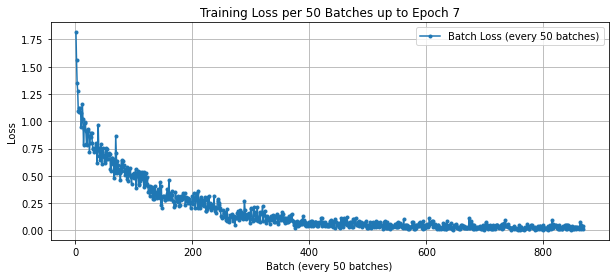

Epoch 8/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.06it/s, loss=0.0622]

Epoch 8/15 completed - Train Loss: 0.0243, Val Loss: 0.1140, Val Accuracy: 96.24%, Val Precision: 0.9269, Val Recall: 0.9703

Early stopping triggered after 8 epochs.



C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


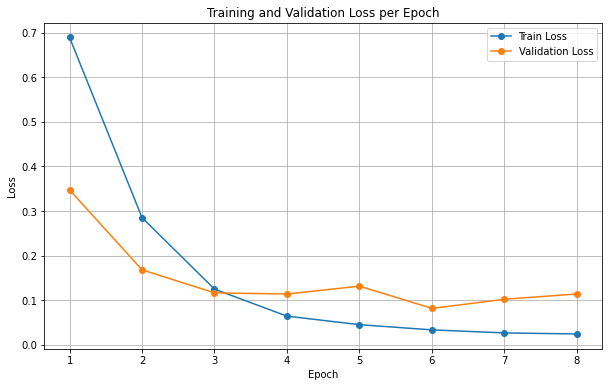

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 1 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_1_cosine.pt'

data_dir = r"C:/Users/User/images/480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding new head:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

### N_freeze = 1, ReduceLROnPlateau scheduler, custom head

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
Epoch 1/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.03it/s, loss=0.6356]


Epoch 1/15 completed - Train Loss: 0.9539, Val Loss: 0.4717, Val Accuracy: 84.97%, Val Precision: 0.6779, Val Recall: 0.7266

Best model saved at epoch 1 with val loss: 0.4717


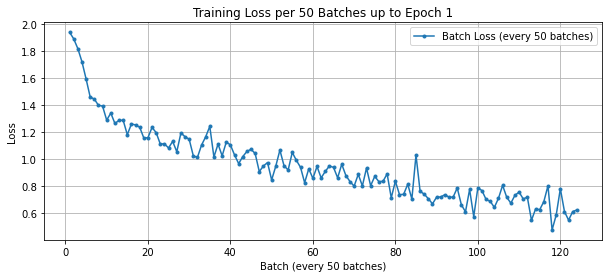

Epoch 2/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.03it/s, loss=0.0582]


Epoch 2/15 completed - Train Loss: 0.4318, Val Loss: 0.2908, Val Accuracy: 90.47%, Val Precision: 0.8462, Val Recall: 0.8575

Best model saved at epoch 2 with val loss: 0.2908


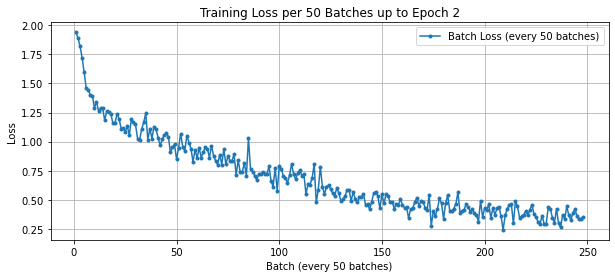

Epoch 3/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.03it/s, loss=0.1921]


Epoch 3/15 completed - Train Loss: 0.2046, Val Loss: 0.1703, Val Accuracy: 94.40%, Val Precision: 0.9244, Val Recall: 0.9349

Best model saved at epoch 3 with val loss: 0.1703


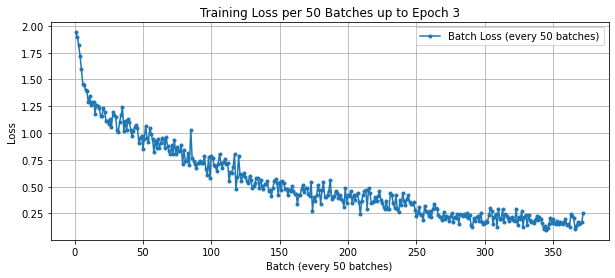

Epoch 4/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.97it/s, loss=0.0340]


Epoch 4/15 completed - Train Loss: 0.1026, Val Loss: 0.1563, Val Accuracy: 94.94%, Val Precision: 0.9019, Val Recall: 0.9503

Best model saved at epoch 4 with val loss: 0.1563


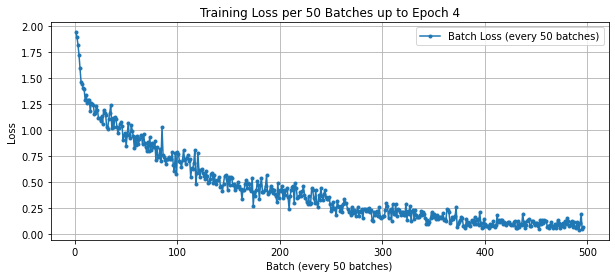

Epoch 5/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.04it/s, loss=0.0060]

Epoch 5/15 completed - Train Loss: 0.0608, Val Loss: 0.1828, Val Accuracy: 95.13%, Val Precision: 0.9432, Val Recall: 0.9598



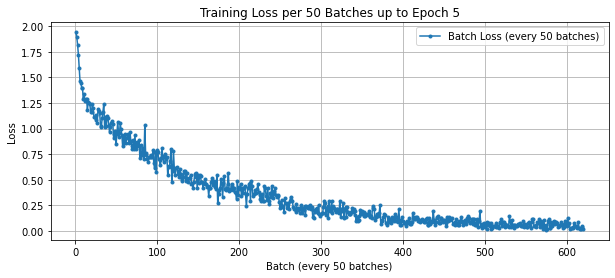

Epoch 6/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.04it/s, loss=0.0010]


Epoch 6/15 completed - Train Loss: 0.0518, Val Loss: 0.1330, Val Accuracy: 95.90%, Val Precision: 0.9480, Val Recall: 0.9552

Best model saved at epoch 6 with val loss: 0.1330


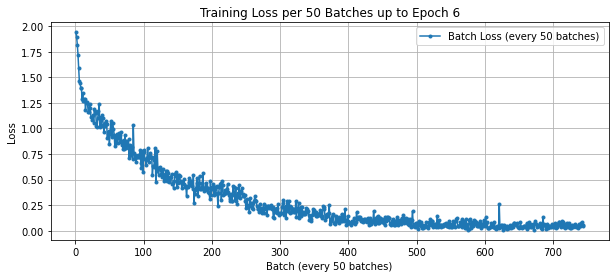

Epoch 7/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.03it/s, loss=0.0028]

Epoch 7/15 completed - Train Loss: 0.0380, Val Loss: 0.2249, Val Accuracy: 94.44%, Val Precision: 0.9012, Val Recall: 0.9522



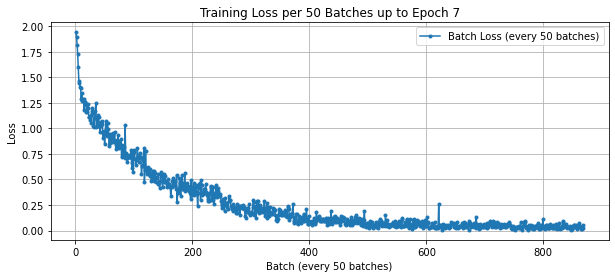

Epoch 8/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.98it/s, loss=0.0006]

Epoch 8/15 completed - Train Loss: 0.0355, Val Loss: 0.1407, Val Accuracy: 96.20%, Val Precision: 0.9368, Val Recall: 0.9700

Early stopping triggered after 8 epochs.


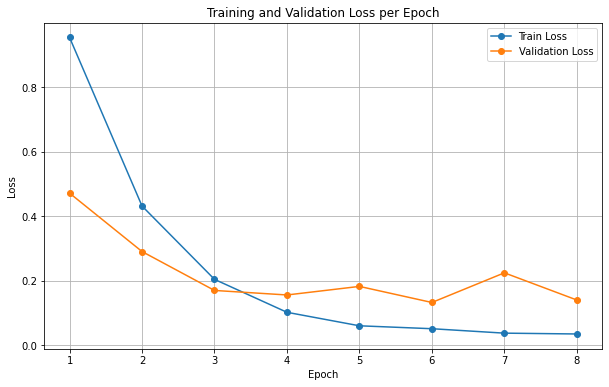

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 1 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_1_plateau_custom_head.pt'

data_dir = r"C:/Users/User/images/480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding custom layers with dropout:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, 512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(256, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=1, factor=0.5, verbose=True)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

### N_freeze = 1, CosineAnnealingLR scheduler, custom head

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


Epoch 1/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 17.02it/s, loss=0.6791]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 1/15 completed - Train Loss: 0.9513, Val Loss: 0.4664, Val Accuracy: 84.53%, Val Precision: 0.7124, Val Recall: 0.7122

Best model saved at epoch 1 with val loss: 0.4664


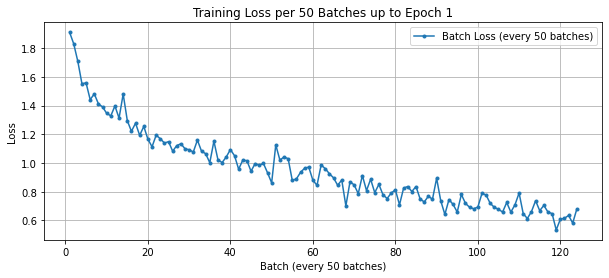

Epoch 2/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.98it/s, loss=0.3834]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 2/15 completed - Train Loss: 0.4270, Val Loss: 0.2840, Val Accuracy: 90.89%, Val Precision: 0.8755, Val Recall: 0.8815

Best model saved at epoch 2 with val loss: 0.2840


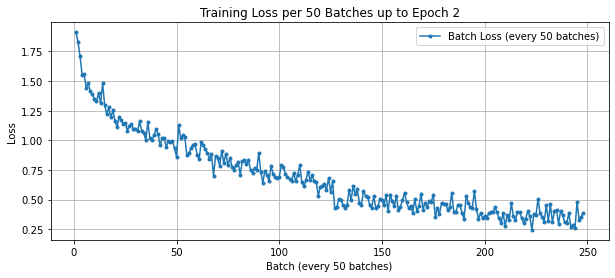

Epoch 3/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:00<00:00, 17.19it/s, loss=0.0541]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 3/15 completed - Train Loss: 0.2011, Val Loss: 0.2243, Val Accuracy: 92.86%, Val Precision: 0.8994, Val Recall: 0.9342

Best model saved at epoch 3 with val loss: 0.2243


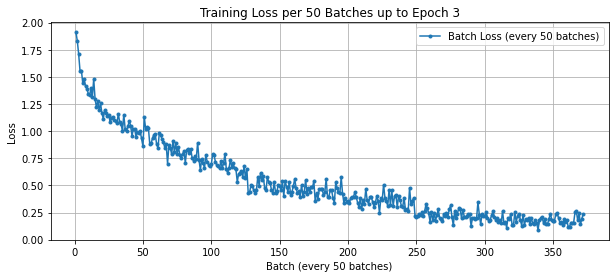

Epoch 4/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:18<00:00, 15.02it/s, loss=0.0011]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 4/15 completed - Train Loss: 0.1040, Val Loss: 0.1491, Val Accuracy: 95.49%, Val Precision: 0.9197, Val Recall: 0.9622

Best model saved at epoch 4 with val loss: 0.1491


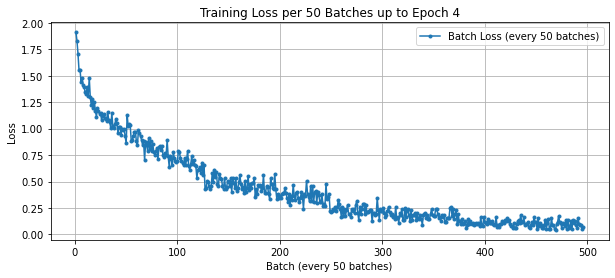

Epoch 5/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:03<00:00, 16.78it/s, loss=0.0098]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 5/15 completed - Train Loss: 0.0706, Val Loss: 0.1327, Val Accuracy: 96.02%, Val Precision: 0.9441, Val Recall: 0.9625

Best model saved at epoch 5 with val loss: 0.1327


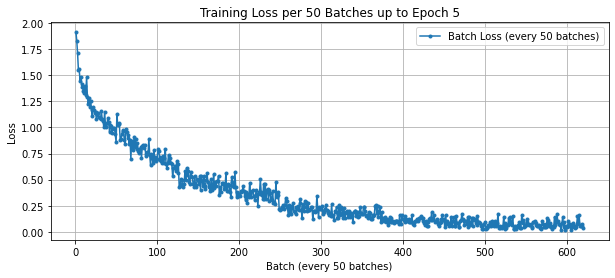

Epoch 6/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.11it/s, loss=0.0765]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 6/15 completed - Train Loss: 0.0527, Val Loss: 0.1129, Val Accuracy: 96.47%, Val Precision: 0.9474, Val Recall: 0.9650

Best model saved at epoch 6 with val loss: 0.1129


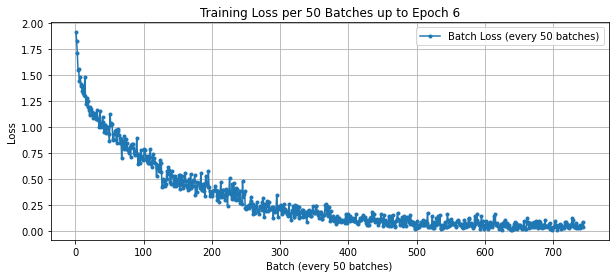

Epoch 7/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:25<00:00, 14.25it/s, loss=0.0165]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 7/15 completed - Train Loss: 0.0394, Val Loss: 0.1127, Val Accuracy: 96.75%, Val Precision: 0.9538, Val Recall: 0.9700

Best model saved at epoch 7 with val loss: 0.1127


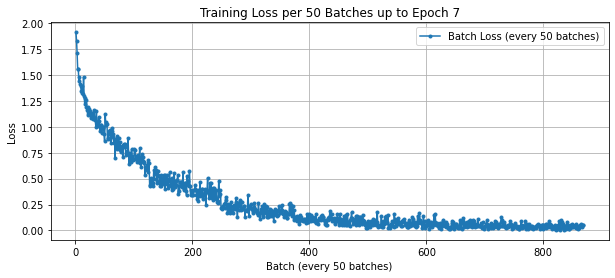

Epoch 8/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:00<00:00, 17.25it/s, loss=0.0071]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 8/15 completed - Train Loss: 0.0372, Val Loss: 0.1124, Val Accuracy: 96.83%, Val Precision: 0.9624, Val Recall: 0.9689

Best model saved at epoch 8 with val loss: 0.1124


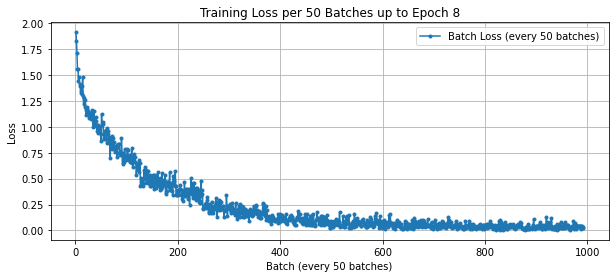

Epoch 9/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.03it/s, loss=0.0024]

Epoch 9/15 completed - Train Loss: 0.0282, Val Loss: 0.1238, Val Accuracy: 96.68%, Val Precision: 0.9684, Val Recall: 0.9660




C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


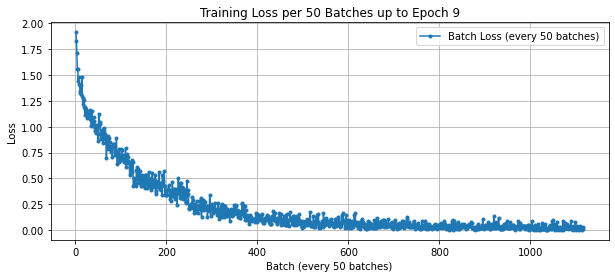

Epoch 10/15 [Val]: 100%|██████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.93it/s, loss=0.0003]

Epoch 10/15 completed - Train Loss: 0.0283, Val Loss: 0.1183, Val Accuracy: 96.95%, Val Precision: 0.9588, Val Recall: 0.9747

Early stopping triggered after 10 epochs.



C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


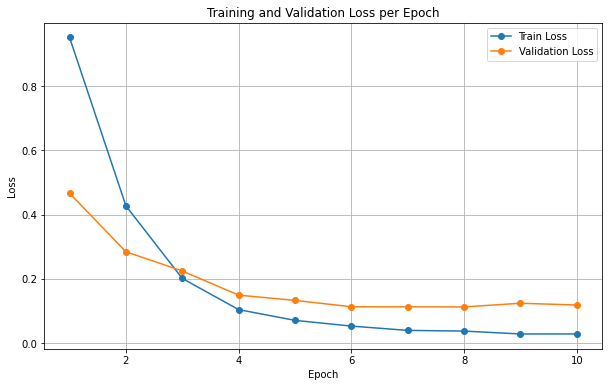

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 1 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_1_cosine_custom_head.pt'

data_dir = r"C:/Users/User/images/480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding custom layers with dropout:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, 512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(256, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

# N_freeze = 2

### N_freeze = 2, ReduceLROnPlateau scheduler, no additional layers

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


Epoch 1/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.21it/s, loss=0.5509]


Epoch 1/15 completed - Train Loss: 0.6988, Val Loss: 0.3345, Val Accuracy: 88.95%, Val Precision: 0.8392, Val Recall: 0.8878

Best model saved at epoch 1 with val loss: 0.3345


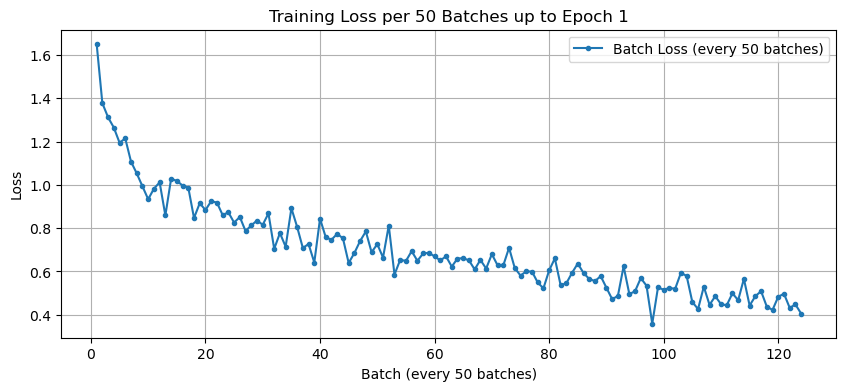

Epoch 2/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 28.04it/s, loss=0.0698]


Epoch 2/15 completed - Train Loss: 0.2920, Val Loss: 0.1730, Val Accuracy: 94.21%, Val Precision: 0.9291, Val Recall: 0.9460

Best model saved at epoch 2 with val loss: 0.1730


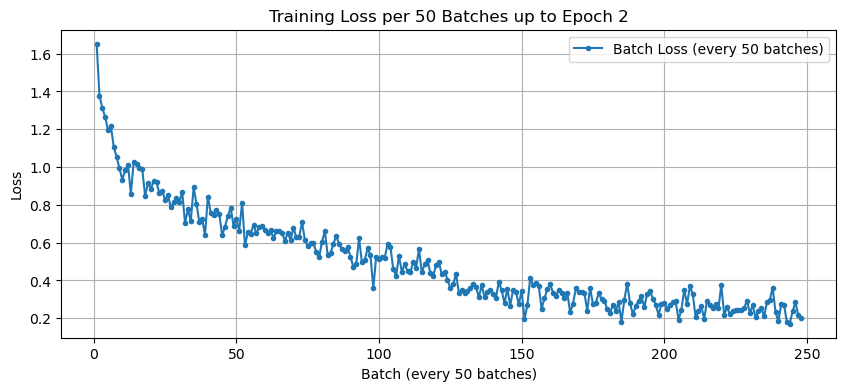

Epoch 3/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.07it/s, loss=0.0704]

Epoch 3/15 completed - Train Loss: 0.1357, Val Loss: 0.1787, Val Accuracy: 93.68%, Val Precision: 0.8979, Val Recall: 0.9593



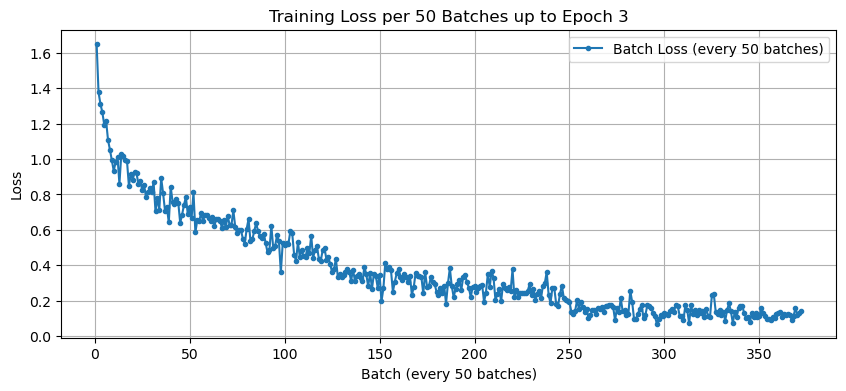

Epoch 4/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 28.06it/s, loss=0.1489]


Epoch 4/15 completed - Train Loss: 0.0676, Val Loss: 0.1137, Val Accuracy: 95.98%, Val Precision: 0.9435, Val Recall: 0.9598

Best model saved at epoch 4 with val loss: 0.1137


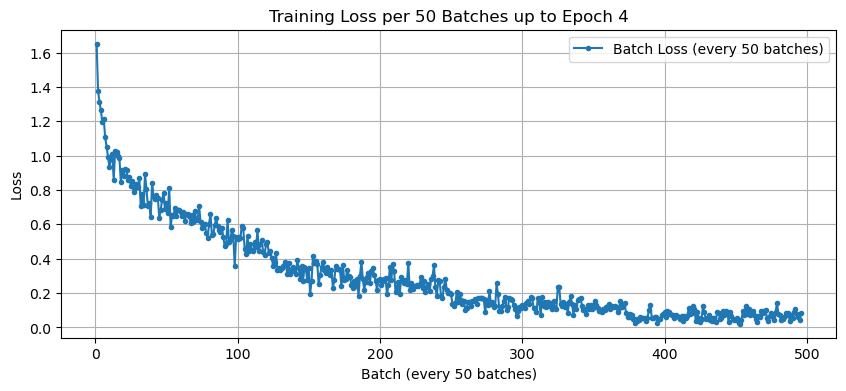

Epoch 5/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 28.02it/s, loss=0.0722]

Epoch 5/15 completed - Train Loss: 0.0462, Val Loss: 0.1562, Val Accuracy: 94.82%, Val Precision: 0.9493, Val Recall: 0.9599



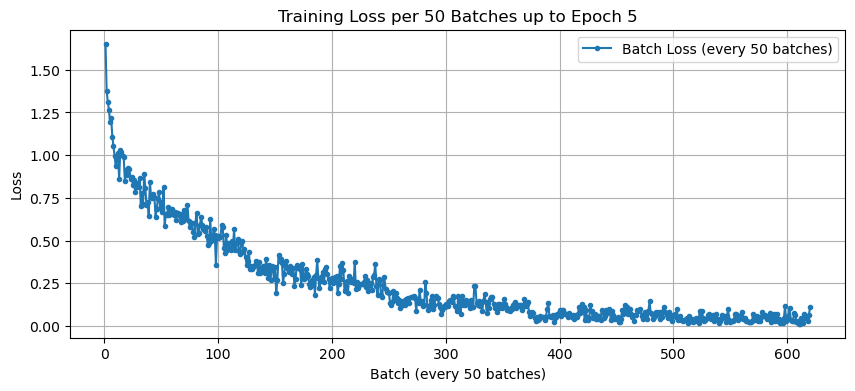

Epoch 6/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.09it/s, loss=0.0602]


Epoch 6/15 completed - Train Loss: 0.0363, Val Loss: 0.1091, Val Accuracy: 96.52%, Val Precision: 0.9355, Val Recall: 0.9682

Best model saved at epoch 6 with val loss: 0.1091


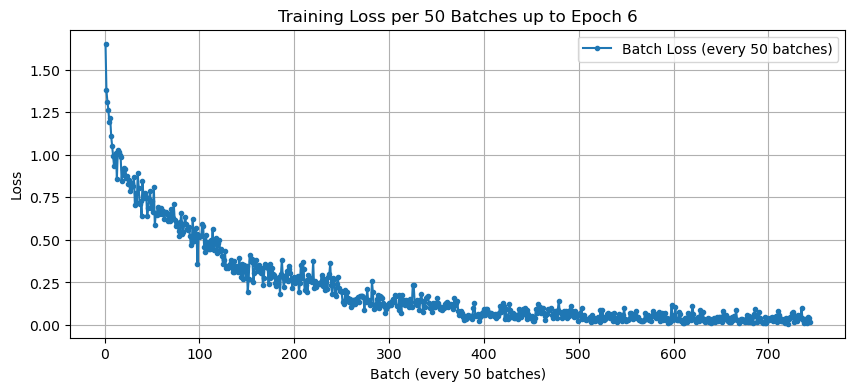

Epoch 7/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 28.06it/s, loss=0.0456]

Epoch 7/15 completed - Train Loss: 0.0290, Val Loss: 0.1152, Val Accuracy: 96.32%, Val Precision: 0.9425, Val Recall: 0.9700



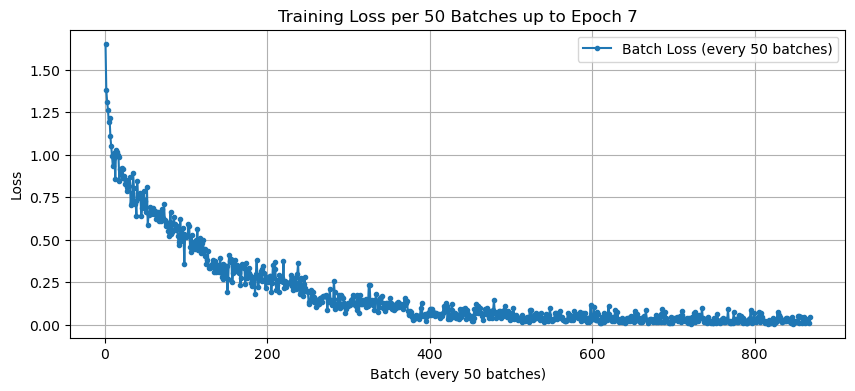

Epoch 8/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.08it/s, loss=0.0894]

Epoch 8/15 completed - Train Loss: 0.0224, Val Loss: 0.1135, Val Accuracy: 96.46%, Val Precision: 0.9508, Val Recall: 0.9658

Early stopping triggered after 8 epochs.


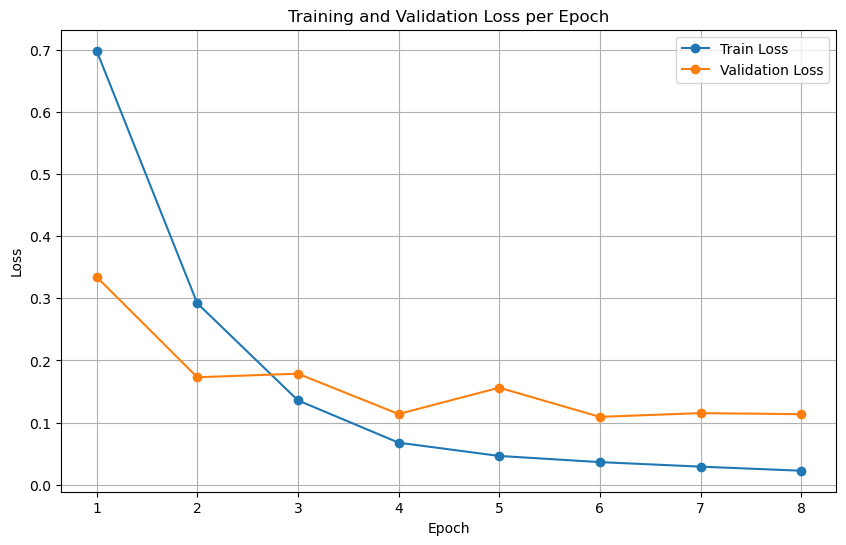

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 2 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_2_plwateau.pt'

data_dir = "480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding new head:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=1, factor=0.5)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

### N_freeze = 2, CosineAnnealingLR scheduler, no additional layers

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


Epoch 1/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 28.02it/s, loss=0.3094]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 1/15 completed - Train Loss: 0.7028, Val Loss: 0.3553, Val Accuracy: 87.66%, Val Precision: 0.8417, Val Recall: 0.8853

Best model saved at epoch 1 with val loss: 0.3553


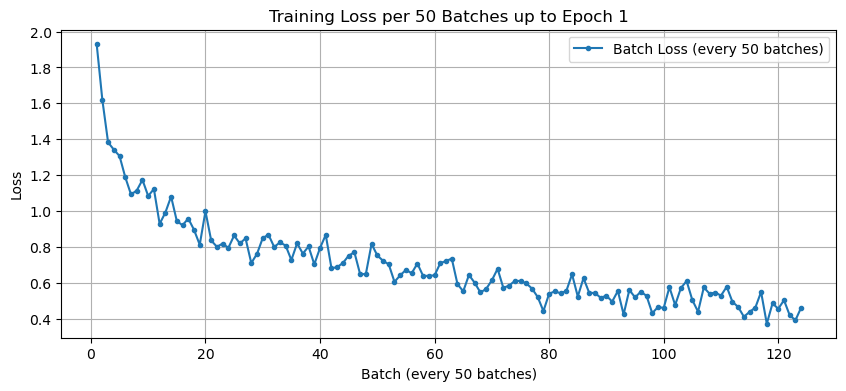

Epoch 2/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.97it/s, loss=0.2890]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 2/15 completed - Train Loss: 0.2939, Val Loss: 0.2169, Val Accuracy: 92.66%, Val Precision: 0.8823, Val Recall: 0.9400

Best model saved at epoch 2 with val loss: 0.2169


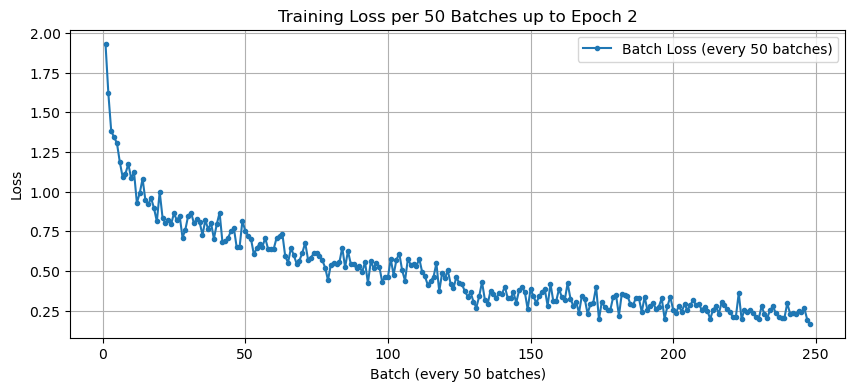

Epoch 3/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.98it/s, loss=0.6033]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 3/15 completed - Train Loss: 0.1277, Val Loss: 0.1523, Val Accuracy: 94.52%, Val Precision: 0.9149, Val Recall: 0.9515

Best model saved at epoch 3 with val loss: 0.1523


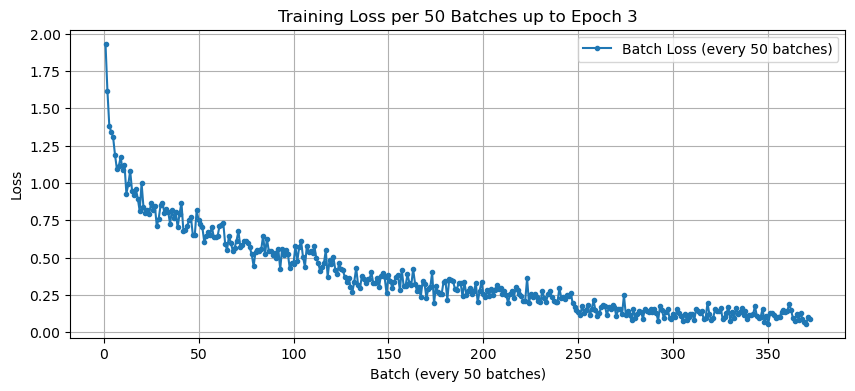

Epoch 4/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 28.01it/s, loss=0.0849]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 4/15 completed - Train Loss: 0.0694, Val Loss: 0.1350, Val Accuracy: 95.68%, Val Precision: 0.9178, Val Recall: 0.9670

Best model saved at epoch 4 with val loss: 0.1350


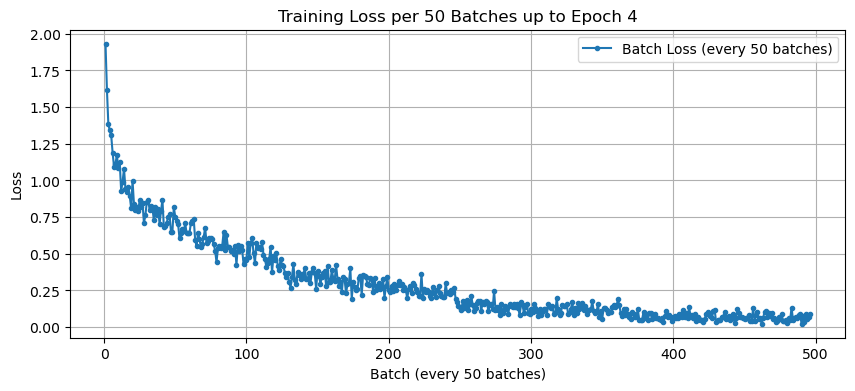

Epoch 5/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.13it/s, loss=0.1173]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 5/15 completed - Train Loss: 0.0473, Val Loss: 0.1118, Val Accuracy: 96.43%, Val Precision: 0.9504, Val Recall: 0.9698

Best model saved at epoch 5 with val loss: 0.1118


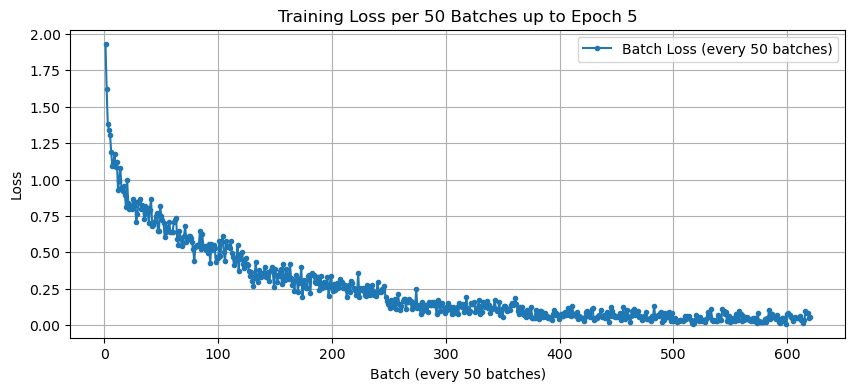

Epoch 6/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.15it/s, loss=0.0015]

Epoch 6/15 completed - Train Loss: 0.0354, Val Loss: 0.1160, Val Accuracy: 96.56%, Val Precision: 0.9574, Val Recall: 0.9704




C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


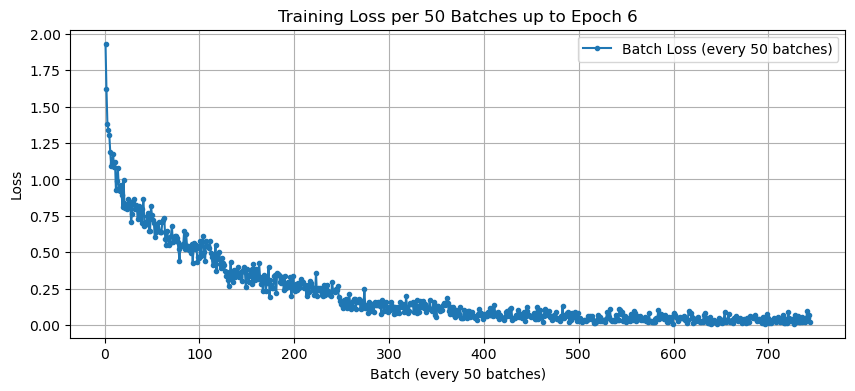

Epoch 7/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.96it/s, loss=0.0089]

Epoch 7/15 completed - Train Loss: 0.0270, Val Loss: 0.1268, Val Accuracy: 95.78%, Val Precision: 0.9370, Val Recall: 0.9658

Early stopping triggered after 7 epochs.



C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


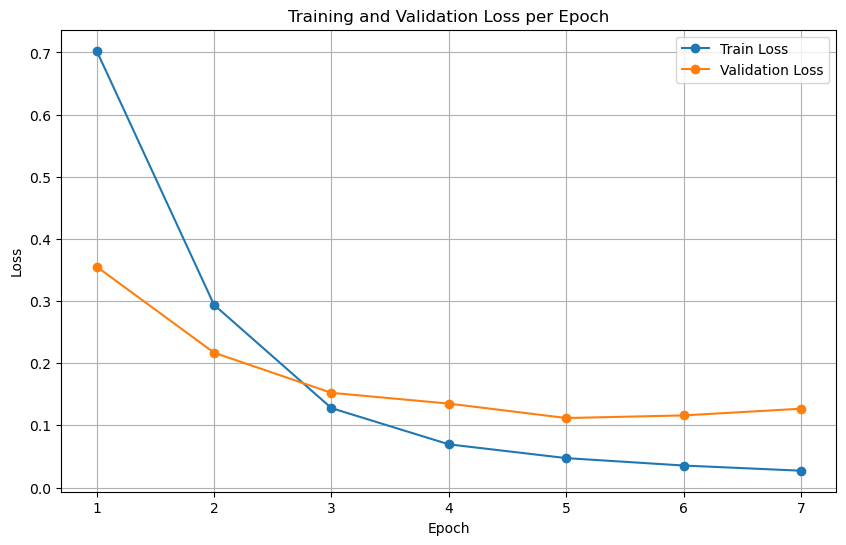

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 2 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_2_cosine.pt'

data_dir = "480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding new head:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Los s', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

### N_freeze = 2, ReduceLROnPlateau scheduler, custom head

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


Epoch 1/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.96it/s, loss=0.7099]


Epoch 1/15 completed - Train Loss: 0.9392, Val Loss: 0.4600, Val Accuracy: 84.75%, Val Precision: 0.6616, Val Recall: 0.7471

Best model saved at epoch 1 with val loss: 0.4600


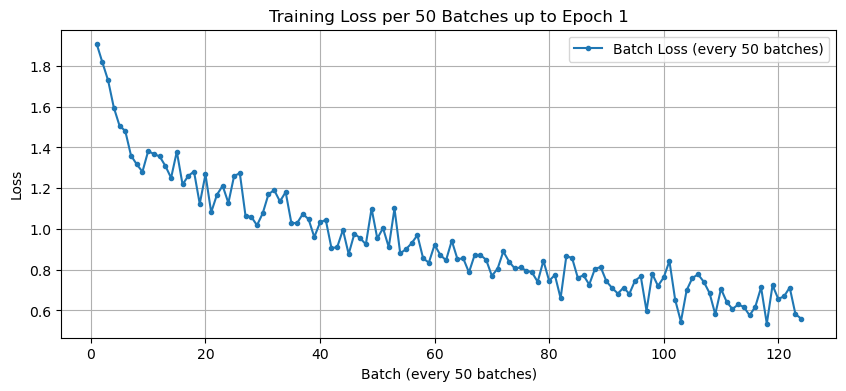

Epoch 2/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.18it/s, loss=0.6031]


Epoch 2/15 completed - Train Loss: 0.4251, Val Loss: 0.2735, Val Accuracy: 91.37%, Val Precision: 0.8780, Val Recall: 0.8833

Best model saved at epoch 2 with val loss: 0.2735


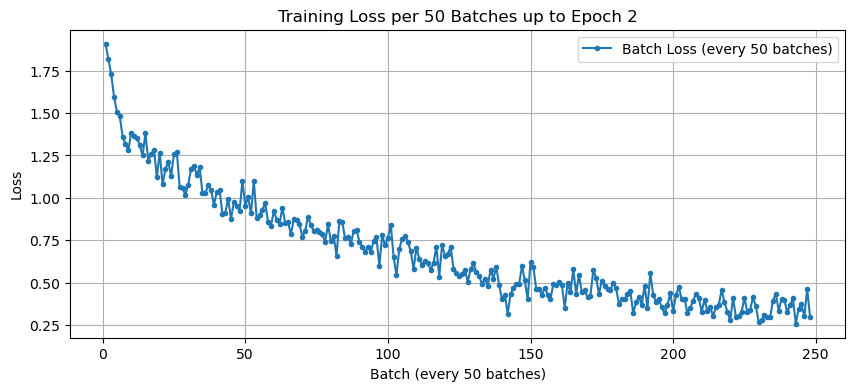

Epoch 3/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.30it/s, loss=0.3013]


Epoch 3/15 completed - Train Loss: 0.2012, Val Loss: 0.2020, Val Accuracy: 93.77%, Val Precision: 0.8961, Val Recall: 0.9426

Best model saved at epoch 3 with val loss: 0.2020


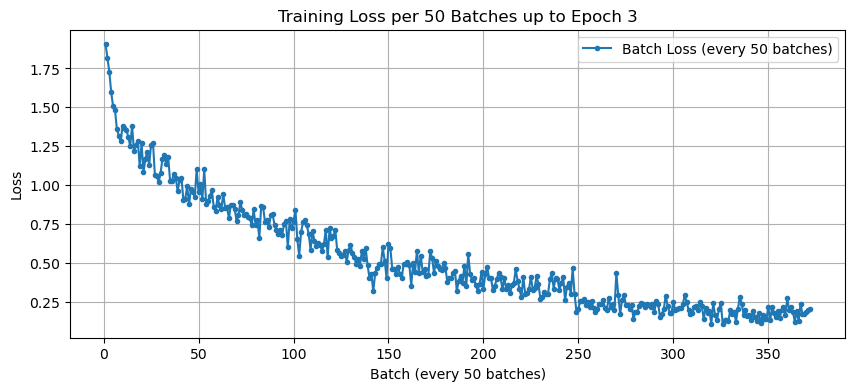

Epoch 4/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.90it/s, loss=0.2827]

Epoch 4/15 completed - Train Loss: 0.1069, Val Loss: 0.2204, Val Accuracy: 93.08%, Val Precision: 0.8633, Val Recall: 0.9429



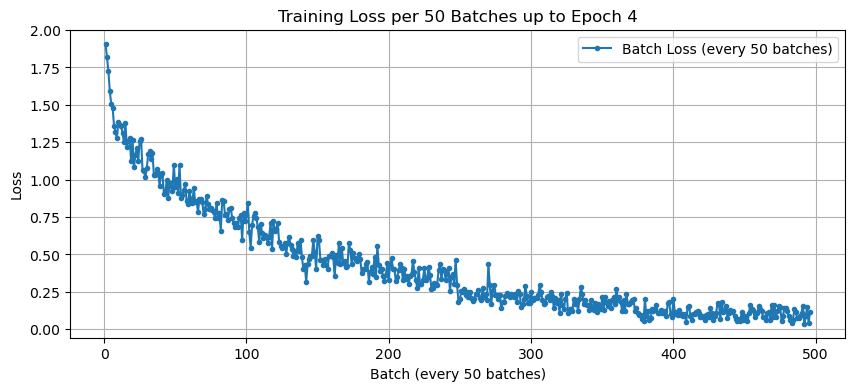

Epoch 5/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.88it/s, loss=0.0551]


Epoch 5/15 completed - Train Loss: 0.0668, Val Loss: 0.1869, Val Accuracy: 94.51%, Val Precision: 0.8932, Val Recall: 0.9628

Best model saved at epoch 5 with val loss: 0.1869


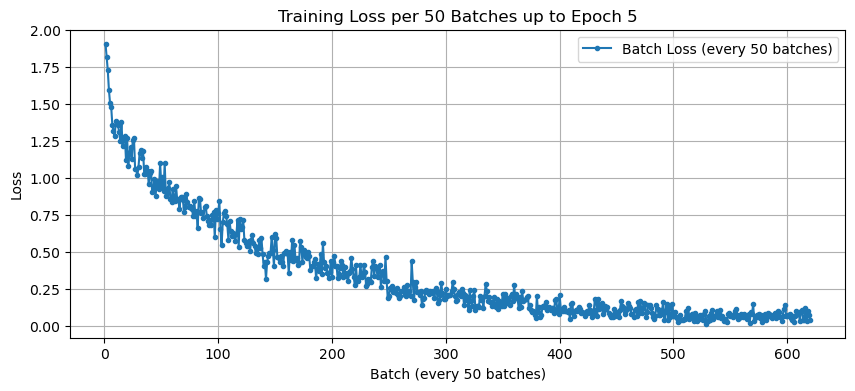

Epoch 6/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.99it/s, loss=0.0116]


Epoch 6/15 completed - Train Loss: 0.0517, Val Loss: 0.1771, Val Accuracy: 95.15%, Val Precision: 0.9142, Val Recall: 0.9562

Best model saved at epoch 6 with val loss: 0.1771


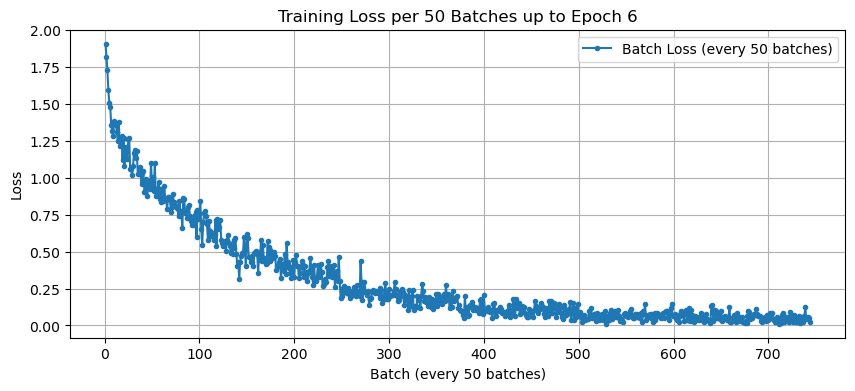

Epoch 7/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 28.06it/s, loss=0.0055]


Epoch 7/15 completed - Train Loss: 0.0410, Val Loss: 0.1346, Val Accuracy: 96.41%, Val Precision: 0.9443, Val Recall: 0.9701

Best model saved at epoch 7 with val loss: 0.1346


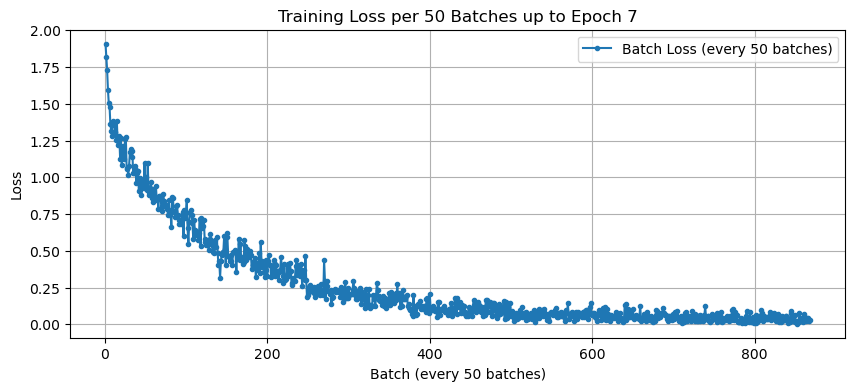

Epoch 8/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.10it/s, loss=0.0145]

Epoch 8/15 completed - Train Loss: 0.0380, Val Loss: 0.1459, Val Accuracy: 96.02%, Val Precision: 0.9381, Val Recall: 0.9687



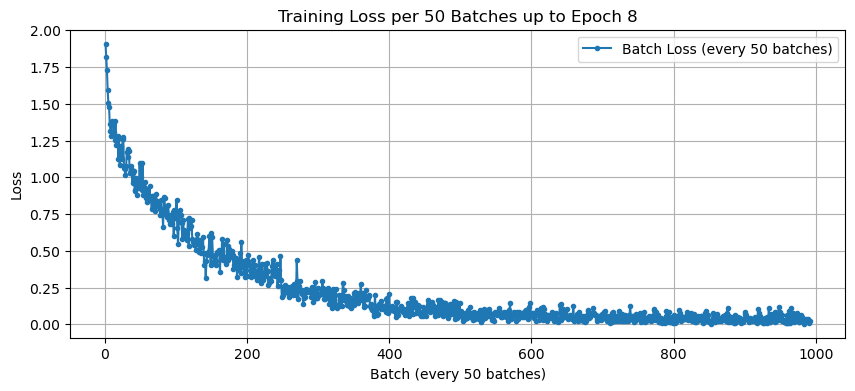

Epoch 9/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.17it/s, loss=1.2852]

Epoch 9/15 completed - Train Loss: 0.0342, Val Loss: 0.1472, Val Accuracy: 95.78%, Val Precision: 0.9456, Val Recall: 0.9675

Early stopping triggered after 9 epochs.


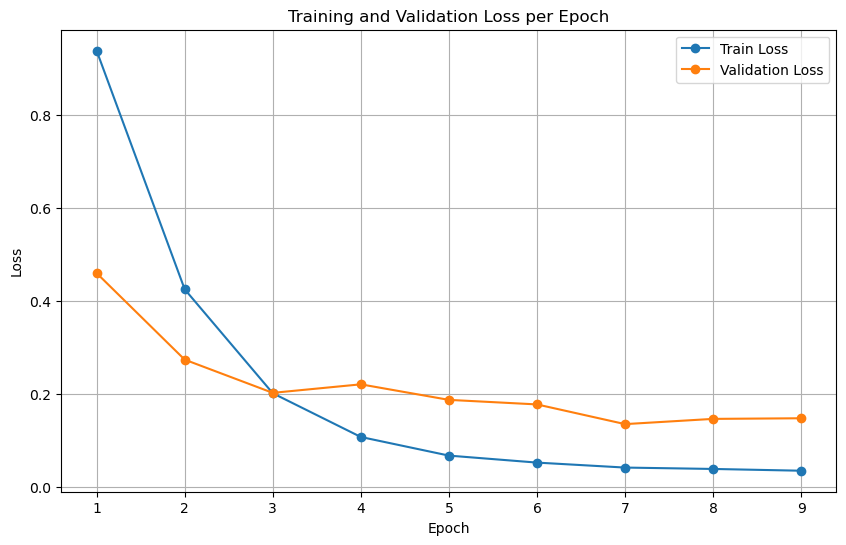

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 2 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_2_plateau_custom_head.pt'

data_dir = "480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding custom layers with dropout:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, 512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(256, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=1, factor=0.5)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

### N_freeze = 2, CosineAnnealingLR scheduler, custom head

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


Epoch 1/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.23it/s, loss=0.8558]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 1/15 completed - Train Loss: 0.9556, Val Loss: 0.4551, Val Accuracy: 86.22%, Val Precision: 0.6925, Val Recall: 0.7420

Best model saved at epoch 1 with val loss: 0.4551


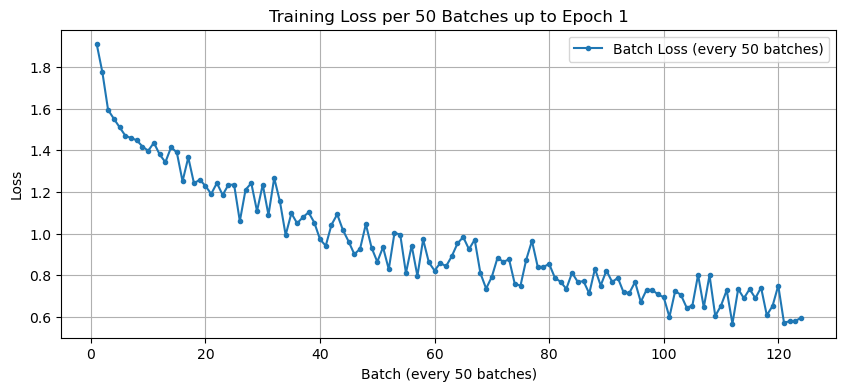

Epoch 2/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.22it/s, loss=0.5728]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 2/15 completed - Train Loss: 0.4372, Val Loss: 0.3247, Val Accuracy: 88.75%, Val Precision: 0.8394, Val Recall: 0.8543

Best model saved at epoch 2 with val loss: 0.3247


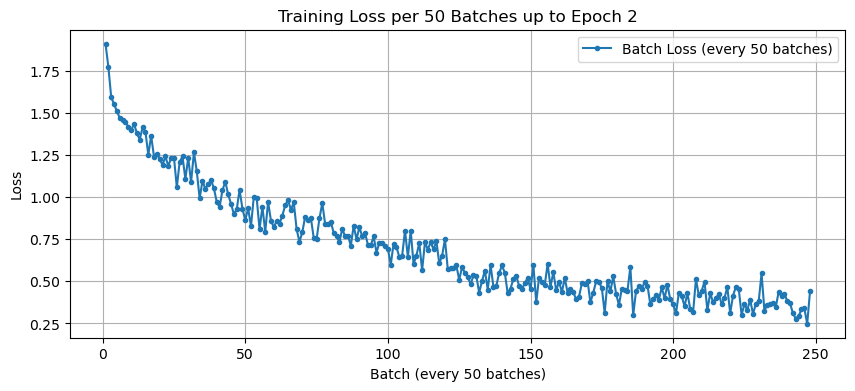

Epoch 3/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.21it/s, loss=0.0975]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 3/15 completed - Train Loss: 0.2104, Val Loss: 0.2021, Val Accuracy: 93.42%, Val Precision: 0.8861, Val Recall: 0.9392

Best model saved at epoch 3 with val loss: 0.2021


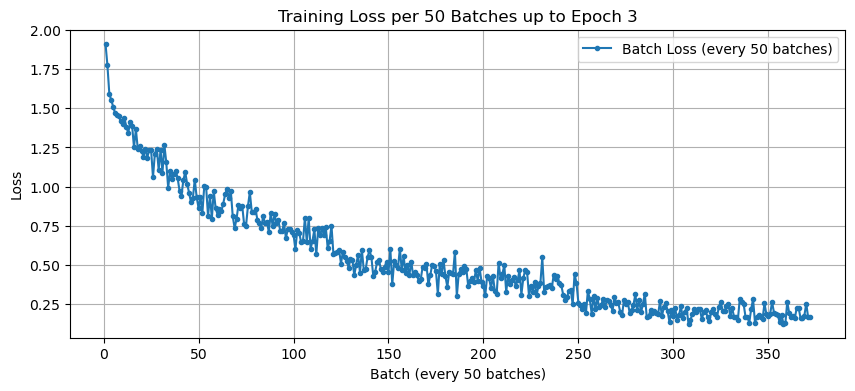

Epoch 4/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.98it/s, loss=1.3913]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 4/15 completed - Train Loss: 0.1048, Val Loss: 0.1753, Val Accuracy: 94.35%, Val Precision: 0.9178, Val Recall: 0.9446

Best model saved at epoch 4 with val loss: 0.1753


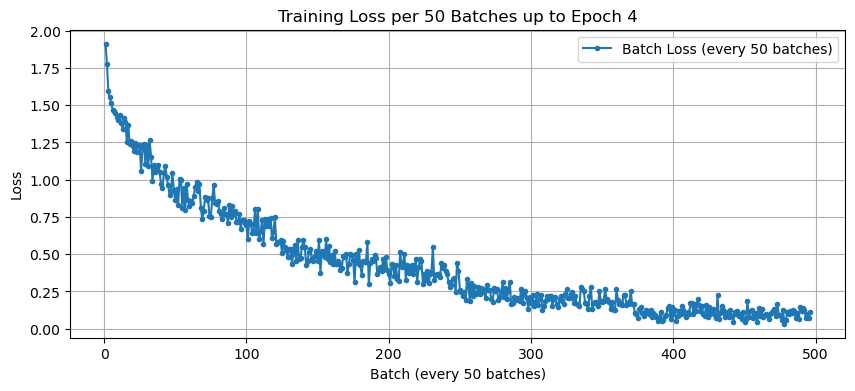

Epoch 5/15 [Val]: 100%|██████████| 2077/2077 [01:13<00:00, 28.07it/s, loss=1.5764]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 5/15 completed - Train Loss: 0.0712, Val Loss: 0.1518, Val Accuracy: 95.09%, Val Precision: 0.9255, Val Recall: 0.9544

Best model saved at epoch 5 with val loss: 0.1518


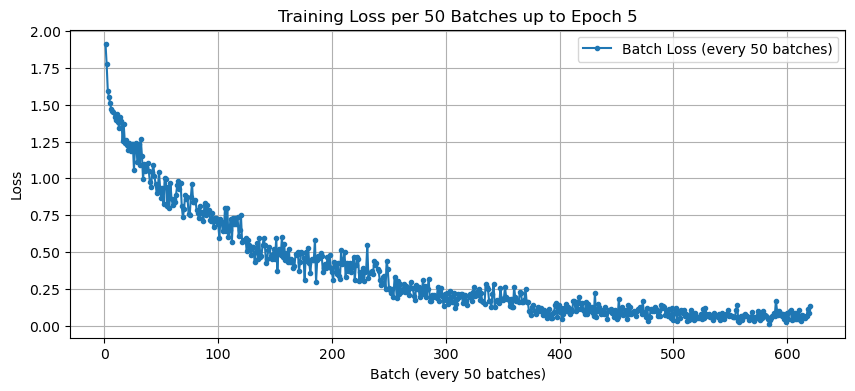

Epoch 6/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.86it/s, loss=1.8414]

Epoch 6/15 completed - Train Loss: 0.0524, Val Loss: 0.1570, Val Accuracy: 95.68%, Val Precision: 0.9351, Val Recall: 0.9603




C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


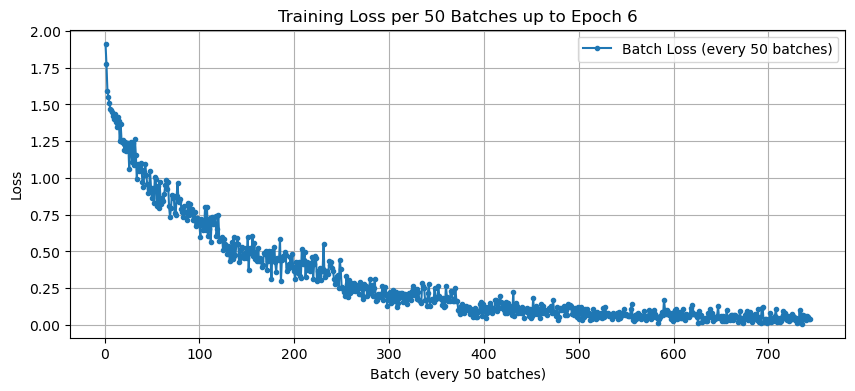

Epoch 7/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.77it/s, loss=0.3515]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 7/15 completed - Train Loss: 0.0451, Val Loss: 0.1292, Val Accuracy: 95.96%, Val Precision: 0.9364, Val Recall: 0.9618

Best model saved at epoch 7 with val loss: 0.1292


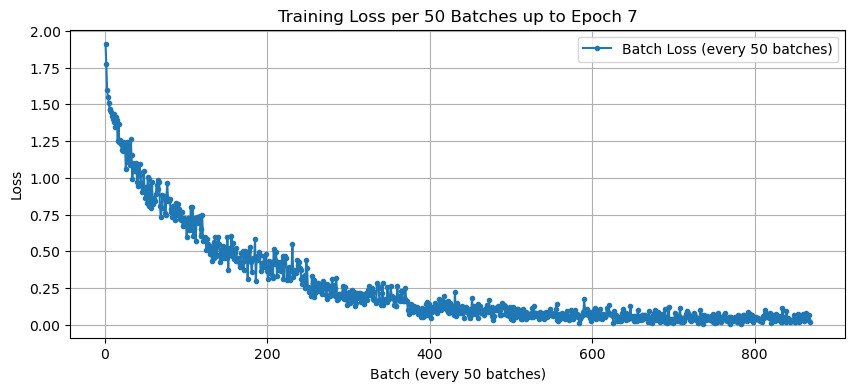

Epoch 8/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.87it/s, loss=1.2983]

Epoch 8/15 completed - Train Loss: 0.0343, Val Loss: 0.1618, Val Accuracy: 95.50%, Val Precision: 0.9320, Val Recall: 0.9641




C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


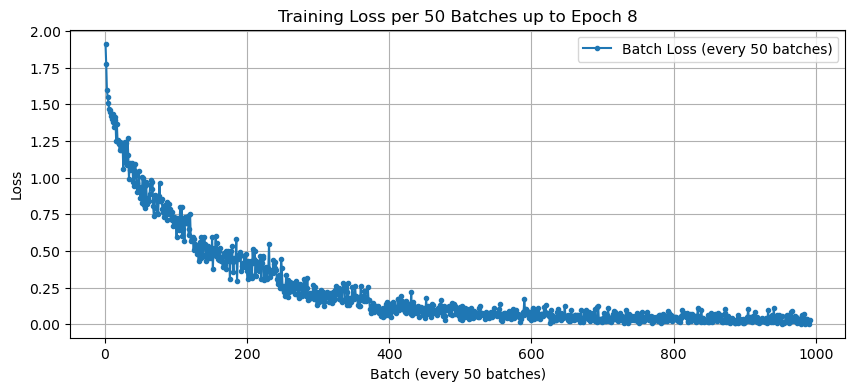

Epoch 9/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.96it/s, loss=0.8210]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 9/15 completed - Train Loss: 0.0317, Val Loss: 0.1275, Val Accuracy: 96.51%, Val Precision: 0.9614, Val Recall: 0.9698

Best model saved at epoch 9 with val loss: 0.1275


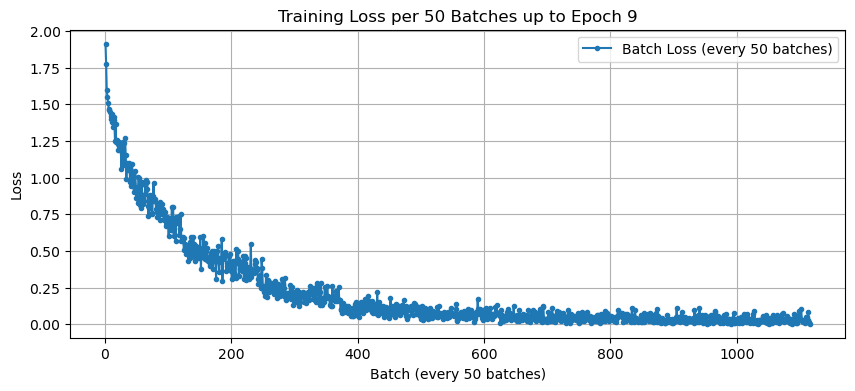

Epoch 10/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.99it/s, loss=0.2860]

Epoch 10/15 completed - Train Loss: 0.0301, Val Loss: 0.1615, Val Accuracy: 95.51%, Val Precision: 0.9163, Val Recall: 0.9550




C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


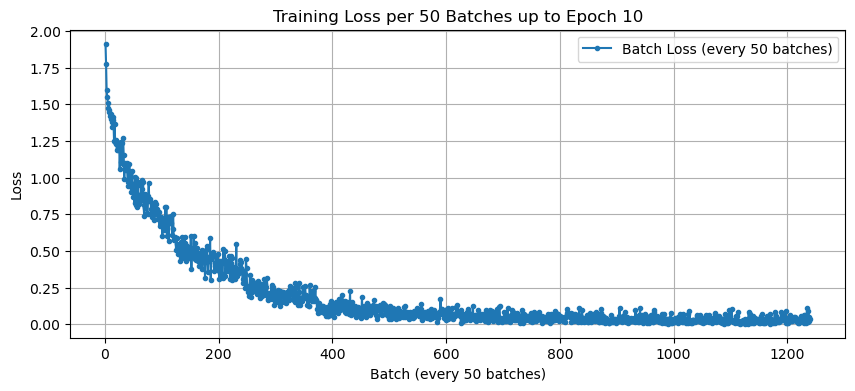

Epoch 11/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 28.03it/s, loss=0.5360]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 11/15 completed - Train Loss: 0.0246, Val Loss: 0.1263, Val Accuracy: 96.53%, Val Precision: 0.9502, Val Recall: 0.9692

Best model saved at epoch 11 with val loss: 0.1263


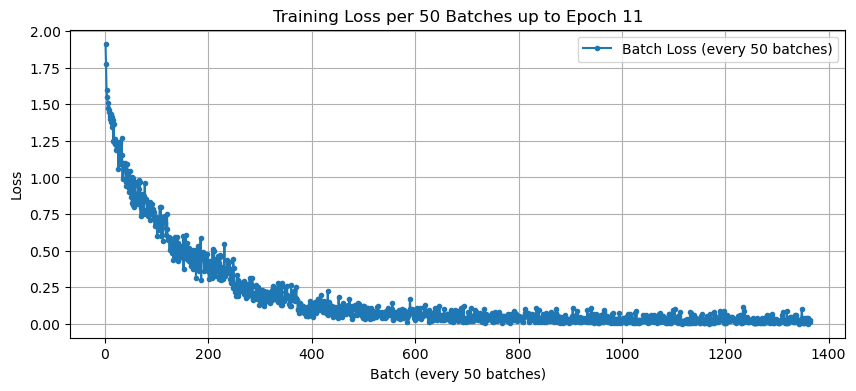

Epoch 12/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.80it/s, loss=1.0551]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 12/15 completed - Train Loss: 0.0268, Val Loss: 0.1216, Val Accuracy: 96.81%, Val Precision: 0.9511, Val Recall: 0.9735

Best model saved at epoch 12 with val loss: 0.1216


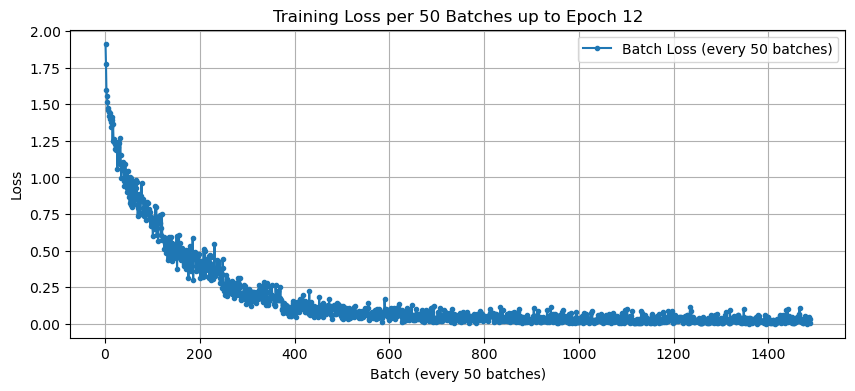

Epoch 13/15 [Val]: 100%|██████████| 2077/2077 [01:15<00:00, 27.62it/s, loss=1.3744]

Epoch 13/15 completed - Train Loss: 0.0226, Val Loss: 0.1280, Val Accuracy: 96.58%, Val Precision: 0.9560, Val Recall: 0.9732




C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


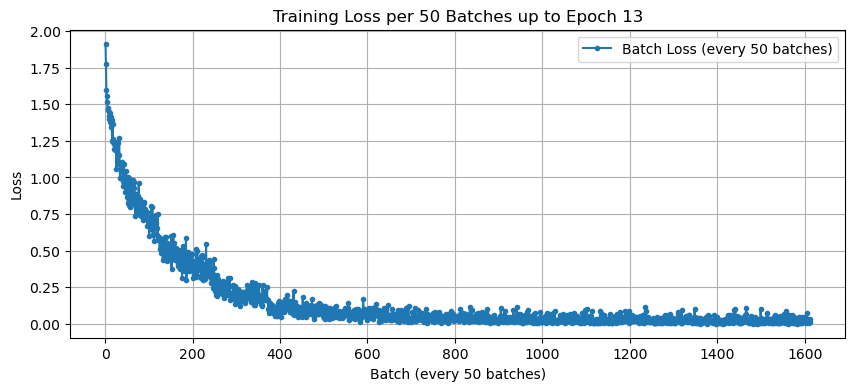

Epoch 14/15 [Val]: 100%|██████████| 2077/2077 [01:15<00:00, 27.63it/s, loss=0.6457]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 14/15 completed - Train Loss: 0.0200, Val Loss: 0.1155, Val Accuracy: 97.01%, Val Precision: 0.9507, Val Recall: 0.9756

Best model saved at epoch 14 with val loss: 0.1155


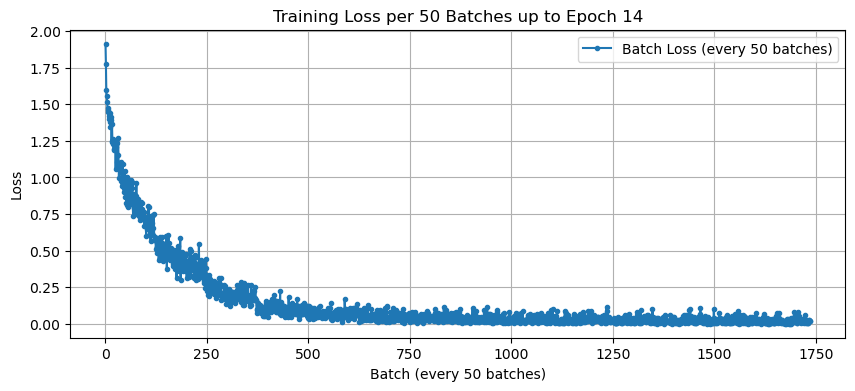

Epoch 15/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.86it/s, loss=0.0703]

Epoch 15/15 completed - Train Loss: 0.0189, Val Loss: 0.1409, Val Accuracy: 96.00%, Val Precision: 0.9552, Val Recall: 0.9684




C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


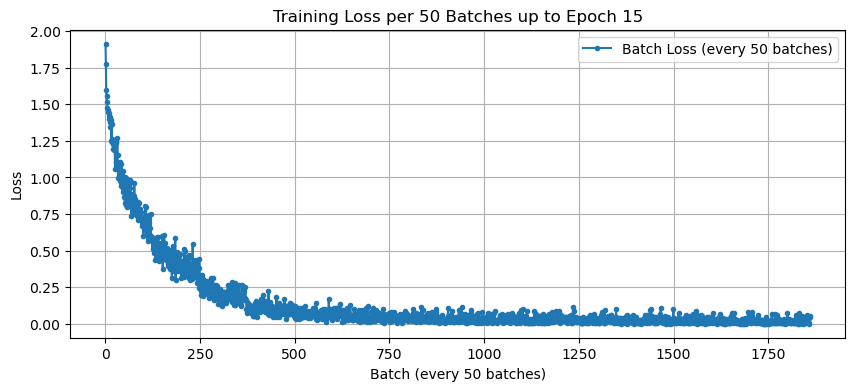

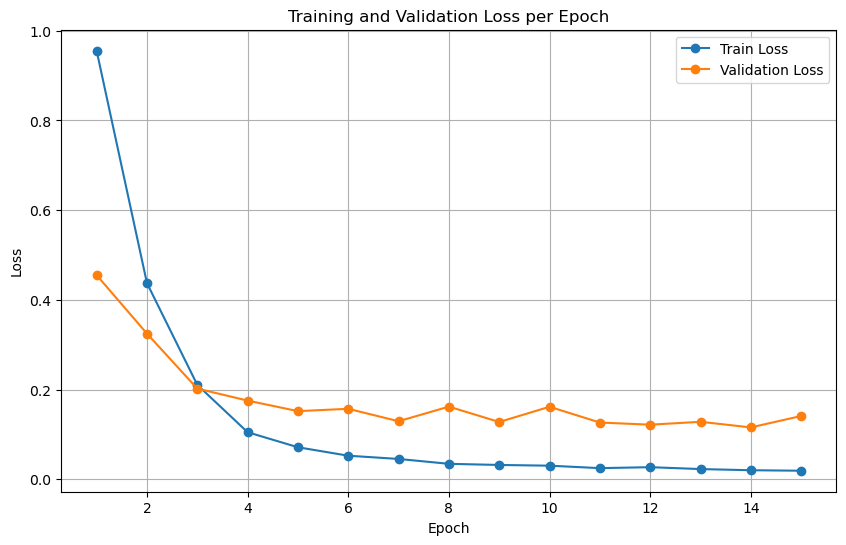

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 2 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_2_cosine_custom_head.pt'

data_dir = "480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding custom layers with dropout:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, 512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(256, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

# N_freeze = 3

### N_freeze = 3, ReduceLROnPlateau scheduler, no additional layers

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
Epoch 1/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.08it/s, loss=0.3272]


Epoch 1/15 completed - Train Loss: 0.7078, Val Loss: 0.3196, Val Accuracy: 88.78%, Val Precision: 0.8400, Val Recall: 0.8865

Best model saved at epoch 1 with val loss: 0.3196


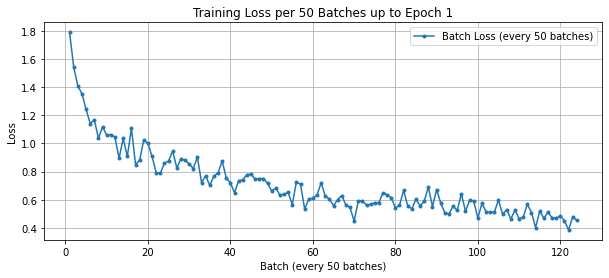

Epoch 2/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.05it/s, loss=0.1254]


Epoch 2/15 completed - Train Loss: 0.3010, Val Loss: 0.2018, Val Accuracy: 93.58%, Val Precision: 0.9177, Val Recall: 0.9376

Best model saved at epoch 2 with val loss: 0.2018


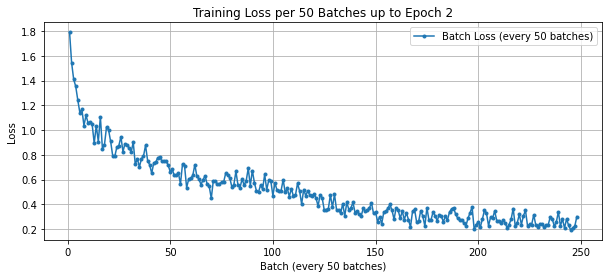

Epoch 3/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 17.00it/s, loss=0.0294]


Epoch 3/15 completed - Train Loss: 0.1381, Val Loss: 0.1356, Val Accuracy: 95.41%, Val Precision: 0.9358, Val Recall: 0.9634

Best model saved at epoch 3 with val loss: 0.1356


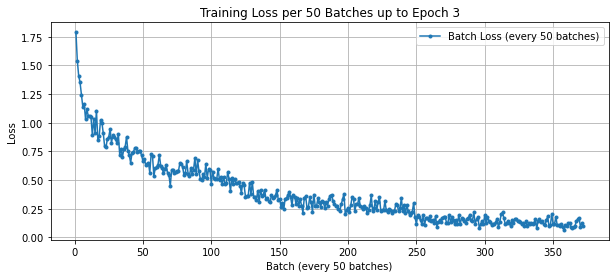

Epoch 4/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 17.02it/s, loss=0.2399]

Epoch 4/15 completed - Train Loss: 0.0760, Val Loss: 0.1446, Val Accuracy: 95.25%, Val Precision: 0.9427, Val Recall: 0.9583



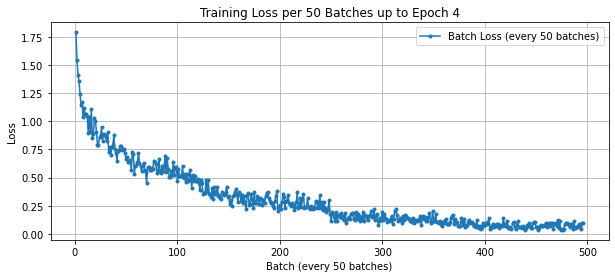

Epoch 5/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 17.01it/s, loss=0.0185]


Epoch 5/15 completed - Train Loss: 0.0502, Val Loss: 0.1258, Val Accuracy: 96.04%, Val Precision: 0.9373, Val Recall: 0.9642

Best model saved at epoch 5 with val loss: 0.1258


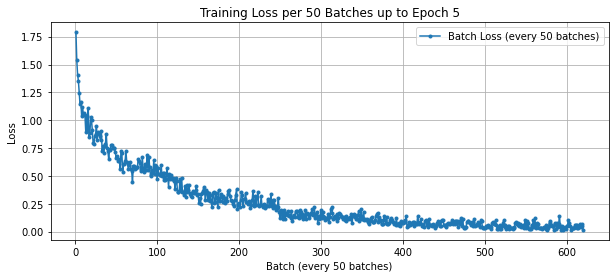

Epoch 6/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.06it/s, loss=0.0030]

Epoch 6/15 completed - Train Loss: 0.0365, Val Loss: 0.1325, Val Accuracy: 95.96%, Val Precision: 0.9397, Val Recall: 0.9729



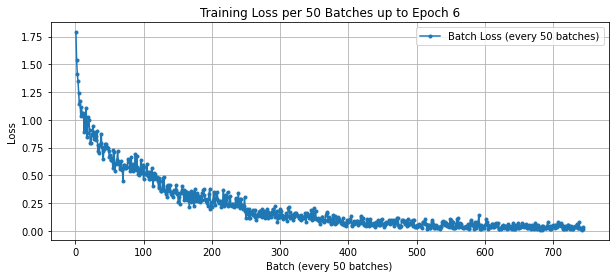

Epoch 7/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.05it/s, loss=0.0069]

Epoch 7/15 completed - Train Loss: 0.0300, Val Loss: 0.1301, Val Accuracy: 96.02%, Val Precision: 0.9494, Val Recall: 0.9685

Early stopping triggered after 7 epochs.


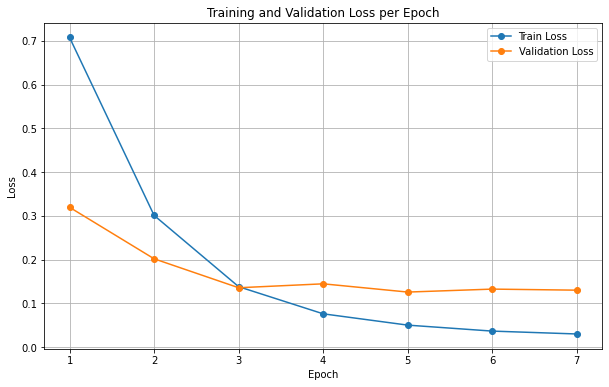

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 3 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_3_plateau.pt'

data_dir = r"C:/Users/User/images/480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding new head:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=1, factor=0.5, verbose=True)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

### N_freeze = 3, CosineAnnealingLR scheduler, no additional layers

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


Epoch 1/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.04it/s, loss=0.5462]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 1/15 completed - Train Loss: 0.7003, Val Loss: 0.4046, Val Accuracy: 85.07%, Val Precision: 0.7920, Val Recall: 0.8540

Best model saved at epoch 1 with val loss: 0.4046


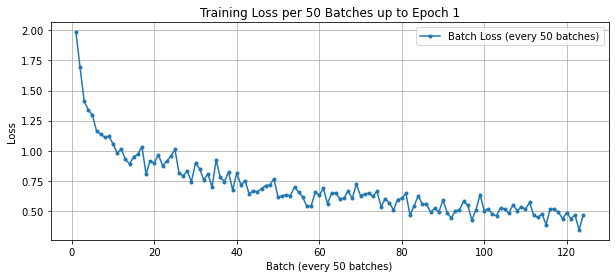

Epoch 2/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.05it/s, loss=0.0859]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 2/15 completed - Train Loss: 0.3018, Val Loss: 0.1961, Val Accuracy: 93.34%, Val Precision: 0.9273, Val Recall: 0.9370

Best model saved at epoch 2 with val loss: 0.1961


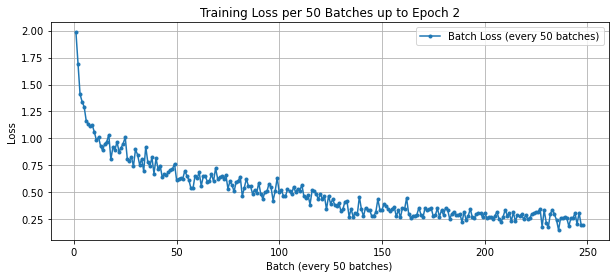

Epoch 3/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.05it/s, loss=0.0468]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 3/15 completed - Train Loss: 0.1414, Val Loss: 0.1686, Val Accuracy: 94.25%, Val Precision: 0.9176, Val Recall: 0.9536

Best model saved at epoch 3 with val loss: 0.1686


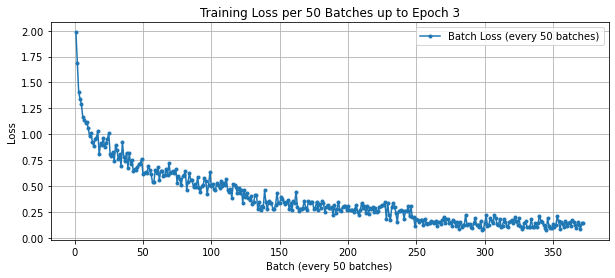

Epoch 4/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.06it/s, loss=0.5416]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 4/15 completed - Train Loss: 0.0779, Val Loss: 0.1616, Val Accuracy: 94.63%, Val Precision: 0.9152, Val Recall: 0.9577

Best model saved at epoch 4 with val loss: 0.1616


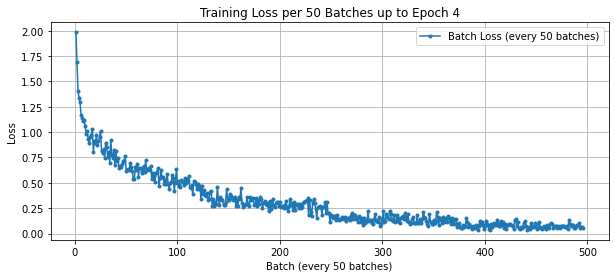

Epoch 5/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.06it/s, loss=0.2131]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 5/15 completed - Train Loss: 0.0490, Val Loss: 0.1317, Val Accuracy: 95.93%, Val Precision: 0.9547, Val Recall: 0.9647

Best model saved at epoch 5 with val loss: 0.1317


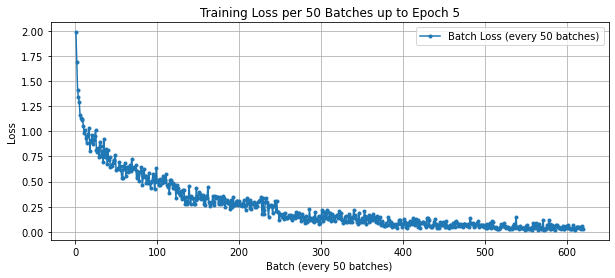

Epoch 6/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.07it/s, loss=0.0464]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 6/15 completed - Train Loss: 0.0391, Val Loss: 0.1090, Val Accuracy: 96.44%, Val Precision: 0.9486, Val Recall: 0.9724

Best model saved at epoch 6 with val loss: 0.1090


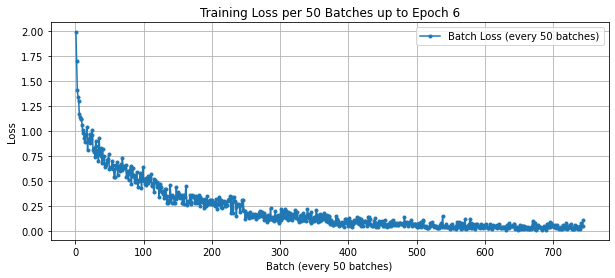

Epoch 7/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.06it/s, loss=0.0374]

Epoch 7/15 completed - Train Loss: 0.0277, Val Loss: 0.1169, Val Accuracy: 96.41%, Val Precision: 0.9614, Val Recall: 0.9646




C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


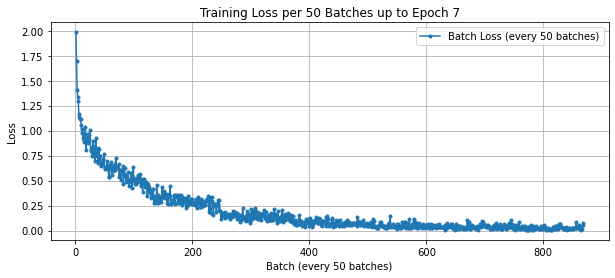

Epoch 8/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.07it/s, loss=0.4446]

Epoch 8/15 completed - Train Loss: 0.0245, Val Loss: 0.1854, Val Accuracy: 94.66%, Val Precision: 0.9524, Val Recall: 0.9543

Early stopping triggered after 8 epochs.



C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


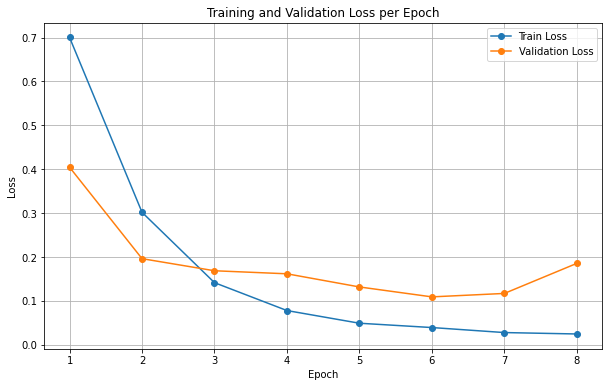

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 3 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_3_cosine.pt'

data_dir = r"C:/Users/User/images/480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding new head:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

### N_freeze = 3, ReduceLROnPlateau scheduler, custom head

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
Epoch 1/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.08it/s, loss=0.7325]


Epoch 1/15 completed - Train Loss: 0.9722, Val Loss: 0.4985, Val Accuracy: 84.15%, Val Precision: 0.6995, Val Recall: 0.6977

Best model saved at epoch 1 with val loss: 0.4985


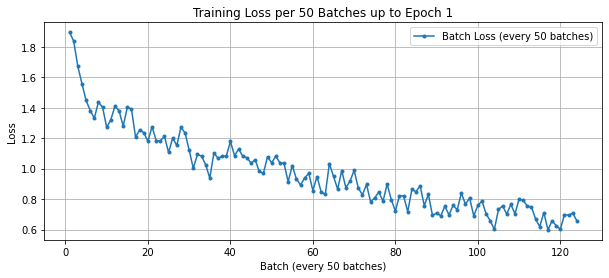

Epoch 2/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.09it/s, loss=0.7893]


Epoch 2/15 completed - Train Loss: 0.4642, Val Loss: 0.3347, Val Accuracy: 88.36%, Val Precision: 0.8500, Val Recall: 0.8006

Best model saved at epoch 2 with val loss: 0.3347


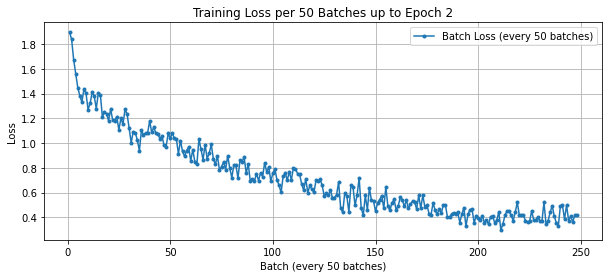

Epoch 3/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.08it/s, loss=0.2652]


Epoch 3/15 completed - Train Loss: 0.2314, Val Loss: 0.2120, Val Accuracy: 93.10%, Val Precision: 0.8807, Val Recall: 0.9288

Best model saved at epoch 3 with val loss: 0.2120


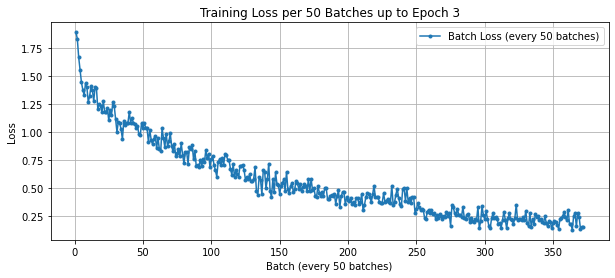

Epoch 4/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.10it/s, loss=0.3347]


Epoch 4/15 completed - Train Loss: 0.1220, Val Loss: 0.1808, Val Accuracy: 94.55%, Val Precision: 0.8969, Val Recall: 0.9571

Best model saved at epoch 4 with val loss: 0.1808


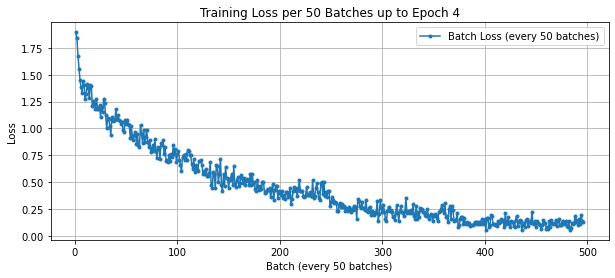

Epoch 5/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.08it/s, loss=0.1095]


Epoch 5/15 completed - Train Loss: 0.0732, Val Loss: 0.1559, Val Accuracy: 95.26%, Val Precision: 0.9410, Val Recall: 0.9597

Best model saved at epoch 5 with val loss: 0.1559


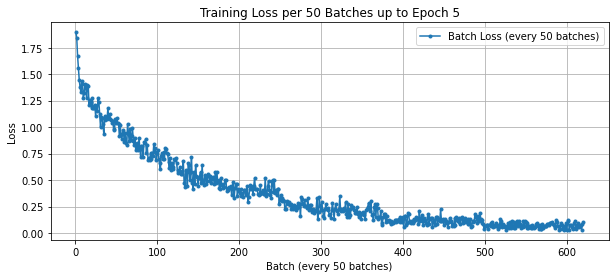

Epoch 6/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.06it/s, loss=0.0358]

Epoch 6/15 completed - Train Loss: 0.0607, Val Loss: 0.1657, Val Accuracy: 95.20%, Val Precision: 0.9240, Val Recall: 0.9568



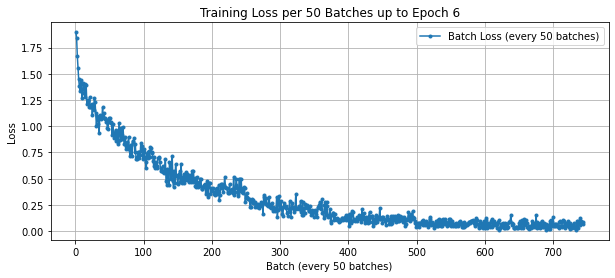

Epoch 7/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.07it/s, loss=0.0015]


Epoch 7/15 completed - Train Loss: 0.0446, Val Loss: 0.1439, Val Accuracy: 96.02%, Val Precision: 0.9378, Val Recall: 0.9684

Best model saved at epoch 7 with val loss: 0.1439


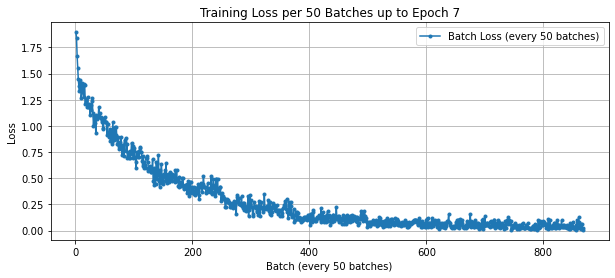

Epoch 8/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.07it/s, loss=0.0308]


Epoch 8/15 completed - Train Loss: 0.0397, Val Loss: 0.1373, Val Accuracy: 96.04%, Val Precision: 0.9447, Val Recall: 0.9645

Best model saved at epoch 8 with val loss: 0.1373


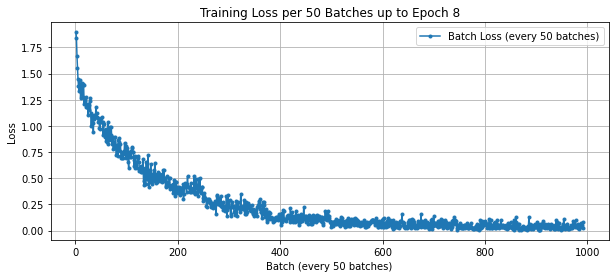

Epoch 9/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.07it/s, loss=0.0032]

Epoch 9/15 completed - Train Loss: 0.0339, Val Loss: 0.1867, Val Accuracy: 95.32%, Val Precision: 0.9226, Val Recall: 0.9652



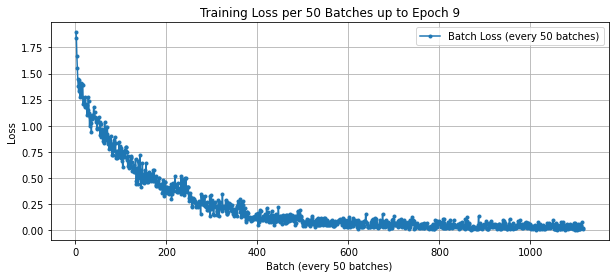

Epoch 10/15 [Val]: 100%|██████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.07it/s, loss=0.4589]

Epoch 10/15 completed - Train Loss: 0.0296, Val Loss: 0.1458, Val Accuracy: 96.04%, Val Precision: 0.9654, Val Recall: 0.9617

Early stopping triggered after 10 epochs.


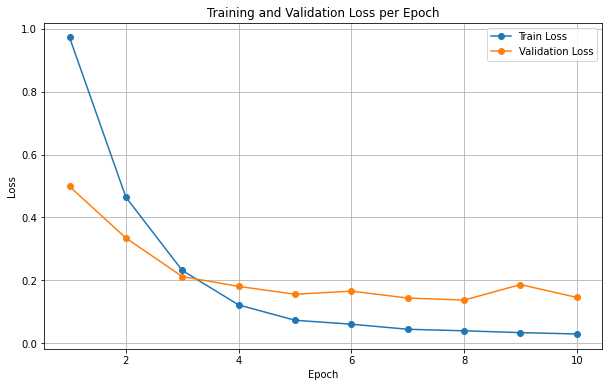

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 3 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_3_plateau_custom_head.pt'

data_dir = r"C:/Users/User/images/480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding custom layers with dropout:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, 512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(256, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=1, factor=0.5, verbose=True)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

### N_freeze = 3, CosineAnnealingLR scheduler, custom head

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


Epoch 1/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.08it/s, loss=0.7534]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 1/15 completed - Train Loss: 0.9772, Val Loss: 0.4904, Val Accuracy: 83.71%, Val Precision: 0.6847, Val Recall: 0.7009

Best model saved at epoch 1 with val loss: 0.4904


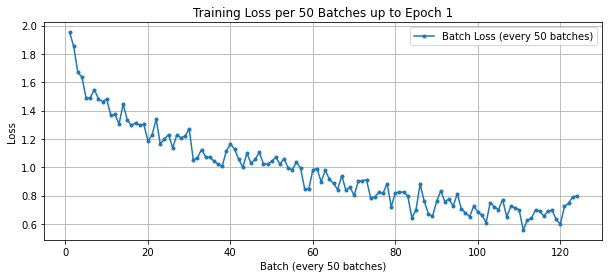

Epoch 2/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.07it/s, loss=0.2420]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 2/15 completed - Train Loss: 0.4604, Val Loss: 0.3099, Val Accuracy: 89.08%, Val Precision: 0.7873, Val Recall: 0.8099

Best model saved at epoch 2 with val loss: 0.3099


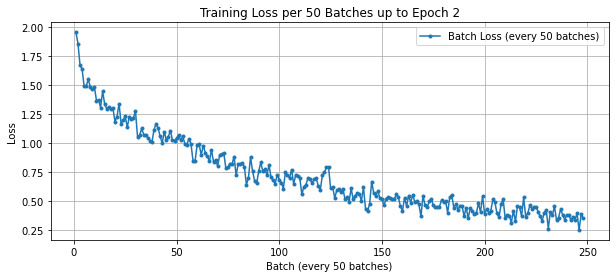

Epoch 3/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.03it/s, loss=0.0508]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 3/15 completed - Train Loss: 0.2300, Val Loss: 0.1918, Val Accuracy: 93.87%, Val Precision: 0.9034, Val Recall: 0.9397

Best model saved at epoch 3 with val loss: 0.1918


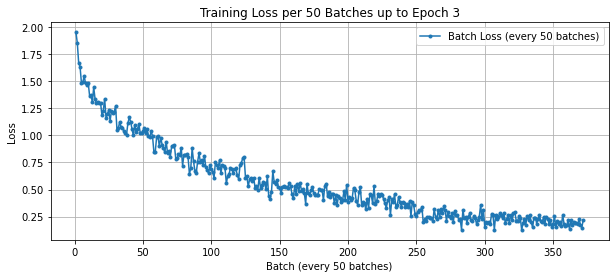

Epoch 4/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.08it/s, loss=0.1084]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 4/15 completed - Train Loss: 0.1205, Val Loss: 0.1863, Val Accuracy: 93.79%, Val Precision: 0.8990, Val Recall: 0.9535

Best model saved at epoch 4 with val loss: 0.1863


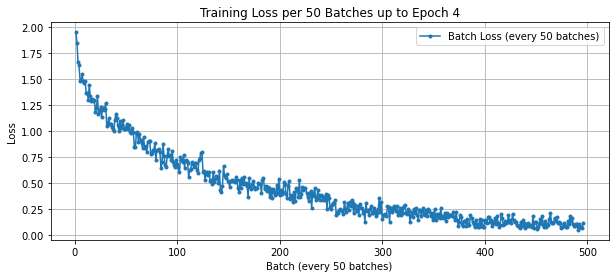

Epoch 5/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.05it/s, loss=0.0055]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 5/15 completed - Train Loss: 0.0768, Val Loss: 0.1301, Val Accuracy: 95.98%, Val Precision: 0.9399, Val Recall: 0.9654

Best model saved at epoch 5 with val loss: 0.1301


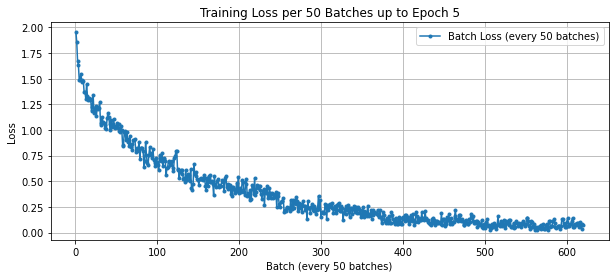

Epoch 6/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.06it/s, loss=0.0352]

Epoch 6/15 completed - Train Loss: 0.0571, Val Loss: 0.1312, Val Accuracy: 96.05%, Val Precision: 0.9368, Val Recall: 0.9649




C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


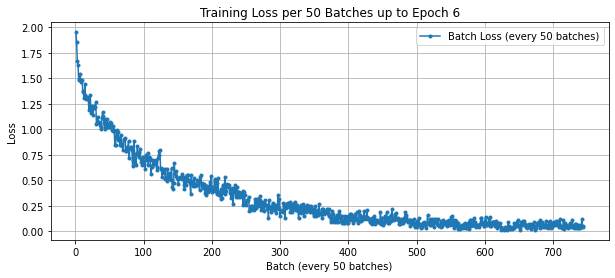

Epoch 7/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.06it/s, loss=0.0154]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 7/15 completed - Train Loss: 0.0473, Val Loss: 0.1251, Val Accuracy: 96.44%, Val Precision: 0.9605, Val Recall: 0.9673

Best model saved at epoch 7 with val loss: 0.1251


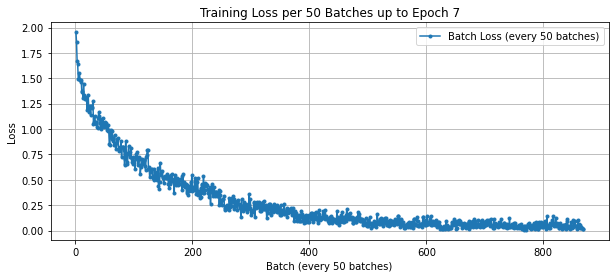

Epoch 8/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.05it/s, loss=0.7274]

Epoch 8/15 completed - Train Loss: 0.0382, Val Loss: 0.1471, Val Accuracy: 95.73%, Val Precision: 0.9492, Val Recall: 0.9606




C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


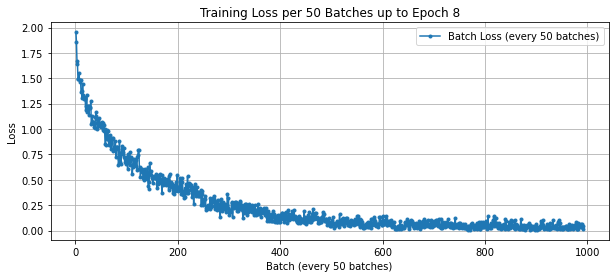

Epoch 9/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 17.01it/s, loss=0.5650]

Epoch 9/15 completed - Train Loss: 0.0354, Val Loss: 0.1345, Val Accuracy: 96.21%, Val Precision: 0.9430, Val Recall: 0.9714

Early stopping triggered after 9 epochs.



C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


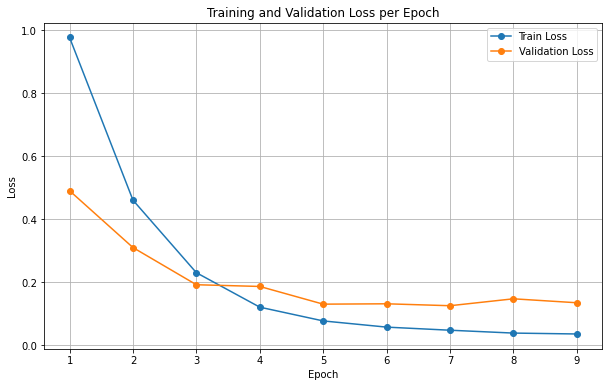

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 3 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_3_cosine_custom_head.pt'

data_dir = r"C:/Users/User/images/480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding custom layers with dropout:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, 512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(256, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

# N_freeze = 4

### N_freeze = 4, ReduceLROnPlateau scheduler, no additional layers

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


Epoch 1/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 28.02it/s, loss=1.1211]


Epoch 1/15 completed - Train Loss: 0.7082, Val Loss: 0.3466, Val Accuracy: 88.14%, Val Precision: 0.8559, Val Recall: 0.8713

Best model saved at epoch 1 with val loss: 0.3466


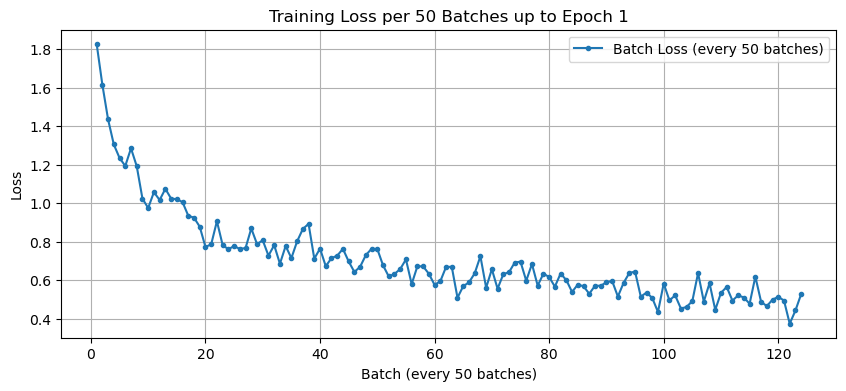

Epoch 2/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.80it/s, loss=0.4604]


Epoch 2/15 completed - Train Loss: 0.3188, Val Loss: 0.2353, Val Accuracy: 91.94%, Val Precision: 0.8813, Val Recall: 0.9278

Best model saved at epoch 2 with val loss: 0.2353


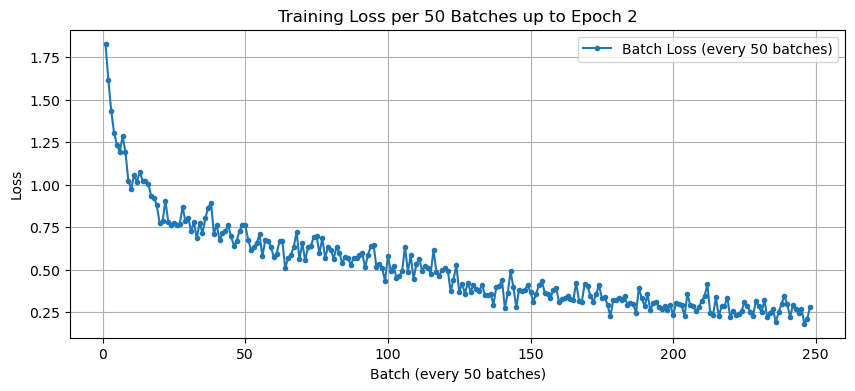

Epoch 3/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.82it/s, loss=0.2258]


Epoch 3/15 completed - Train Loss: 0.1536, Val Loss: 0.1696, Val Accuracy: 94.38%, Val Precision: 0.9009, Val Recall: 0.9570

Best model saved at epoch 3 with val loss: 0.1696


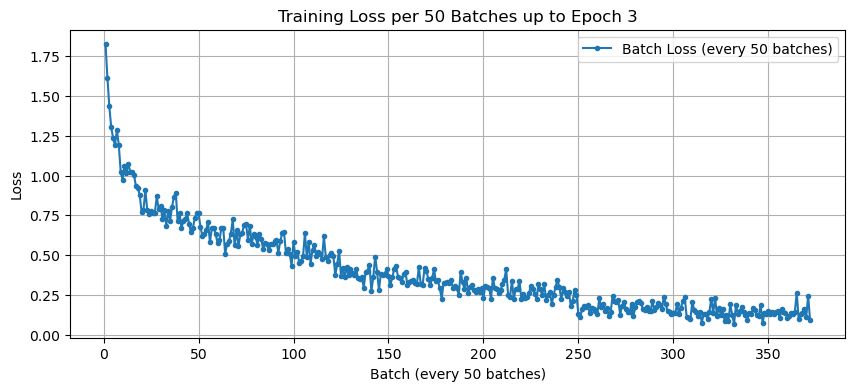

Epoch 4/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.76it/s, loss=0.2341]


Epoch 4/15 completed - Train Loss: 0.0842, Val Loss: 0.1237, Val Accuracy: 95.80%, Val Precision: 0.9440, Val Recall: 0.9690

Best model saved at epoch 4 with val loss: 0.1237


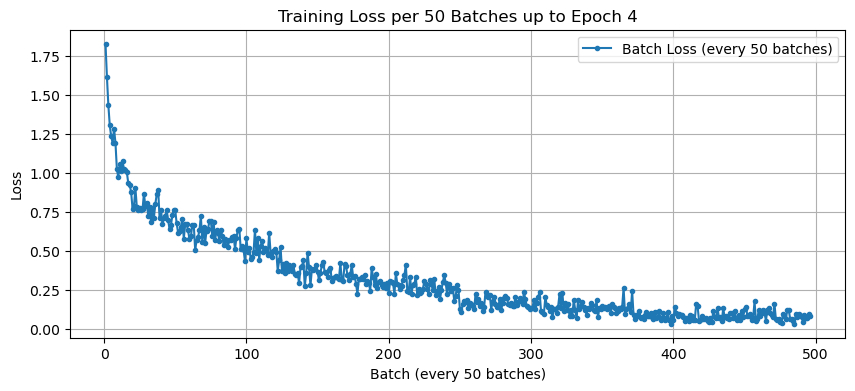

Epoch 5/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.74it/s, loss=1.2936]

Epoch 5/15 completed - Train Loss: 0.0530, Val Loss: 0.1816, Val Accuracy: 94.34%, Val Precision: 0.8909, Val Recall: 0.9587



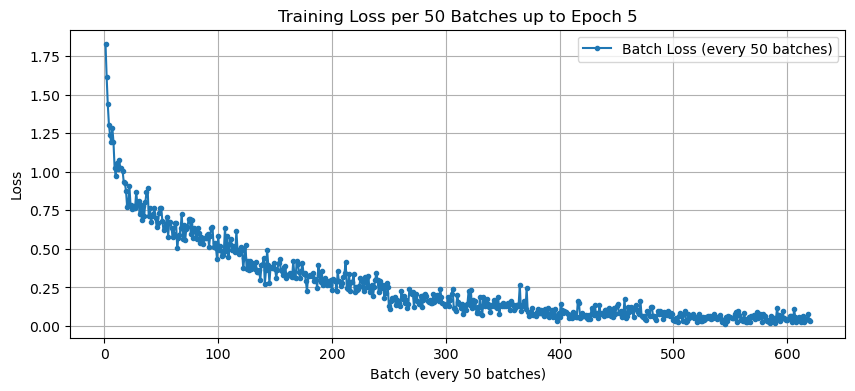

Epoch 6/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.81it/s, loss=0.4294]

Epoch 6/15 completed - Train Loss: 0.0407, Val Loss: 0.1483, Val Accuracy: 95.19%, Val Precision: 0.9185, Val Recall: 0.9592

Early stopping triggered after 6 epochs.


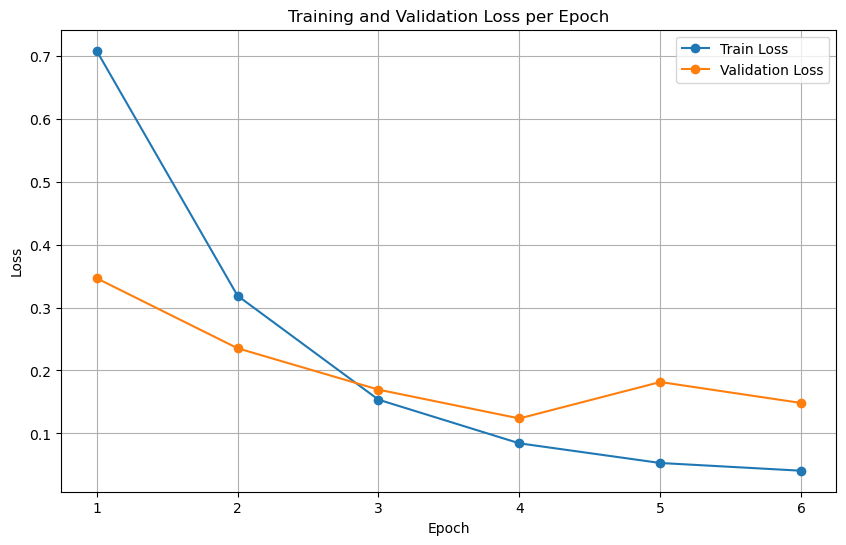

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 4 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_4_plwateau.pt'

data_dir = "480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding new head:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=1, factor=0.5)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

### N_freeze = 4, CosineAnnealingLR scheduler, no additional layers

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


Epoch 1/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.91it/s, loss=0.7043]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 1/15 completed - Train Loss: 0.7108, Val Loss: 0.3620, Val Accuracy: 87.05%, Val Precision: 0.8302, Val Recall: 0.8641

Best model saved at epoch 1 with val loss: 0.3620


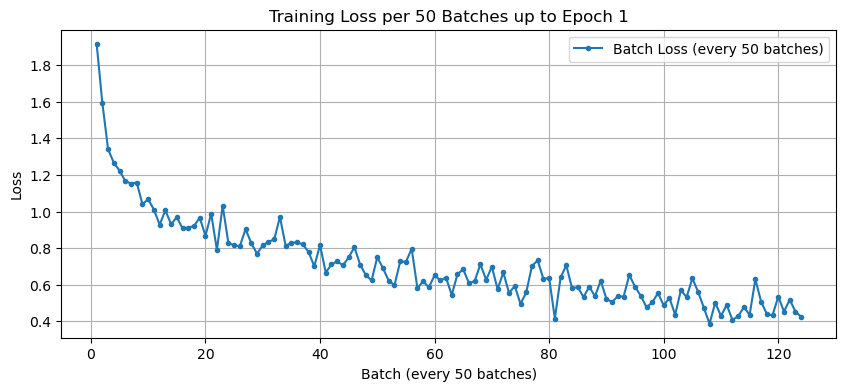

Epoch 2/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.91it/s, loss=0.7367]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 2/15 completed - Train Loss: 0.3196, Val Loss: 0.2330, Val Accuracy: 91.77%, Val Precision: 0.9039, Val Recall: 0.9252

Best model saved at epoch 2 with val loss: 0.2330


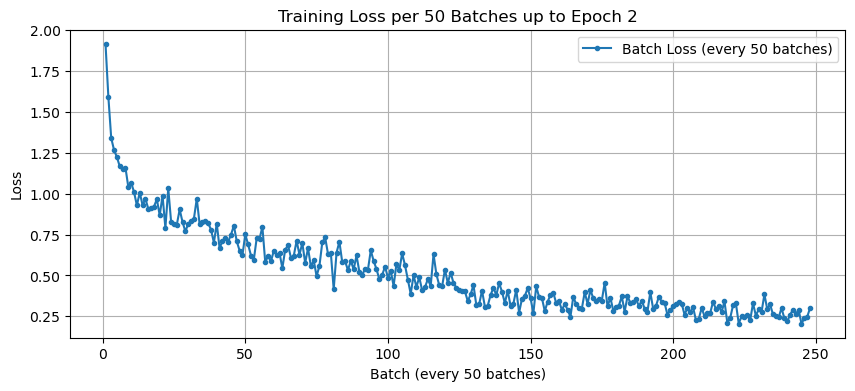

Epoch 3/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.90it/s, loss=0.9667]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 3/15 completed - Train Loss: 0.1582, Val Loss: 0.1536, Val Accuracy: 94.86%, Val Precision: 0.9324, Val Recall: 0.9530

Best model saved at epoch 3 with val loss: 0.1536


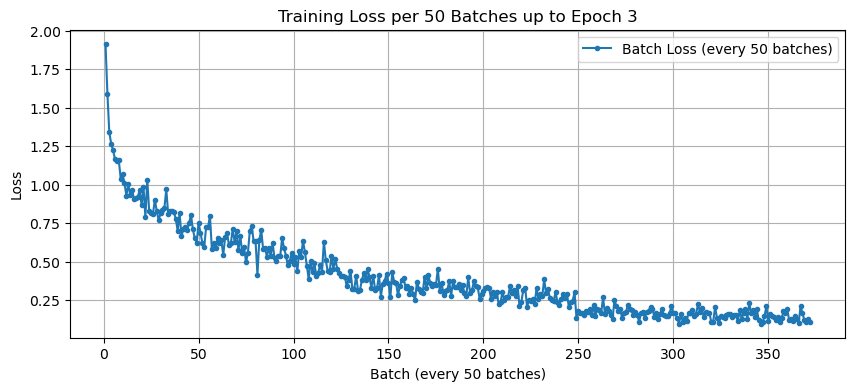

Epoch 4/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.93it/s, loss=0.6588]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 4/15 completed - Train Loss: 0.0851, Val Loss: 0.1416, Val Accuracy: 95.14%, Val Precision: 0.9363, Val Recall: 0.9575

Best model saved at epoch 4 with val loss: 0.1416


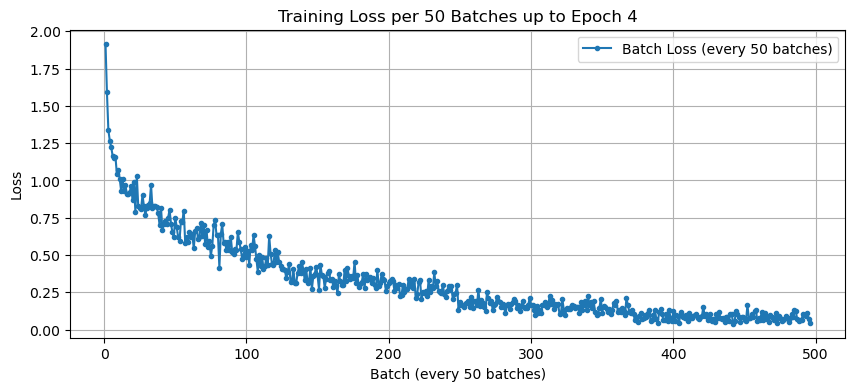

Epoch 5/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.83it/s, loss=0.6459]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 5/15 completed - Train Loss: 0.0535, Val Loss: 0.1302, Val Accuracy: 95.92%, Val Precision: 0.9518, Val Recall: 0.9655

Best model saved at epoch 5 with val loss: 0.1302


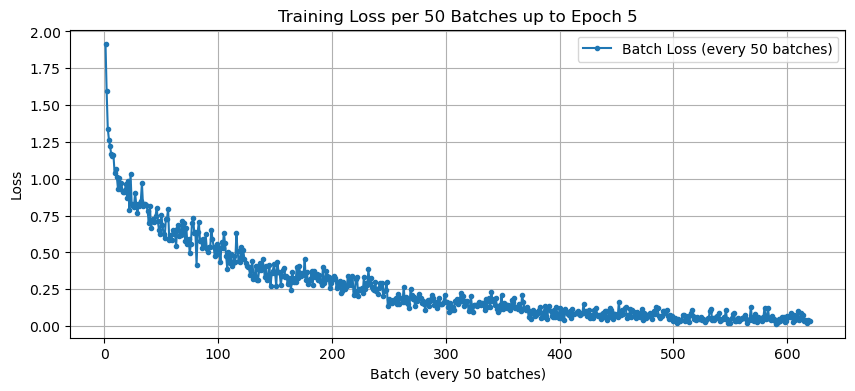

Epoch 6/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.76it/s, loss=0.6825]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 6/15 completed - Train Loss: 0.0409, Val Loss: 0.1184, Val Accuracy: 96.08%, Val Precision: 0.9469, Val Recall: 0.9639

Best model saved at epoch 6 with val loss: 0.1184


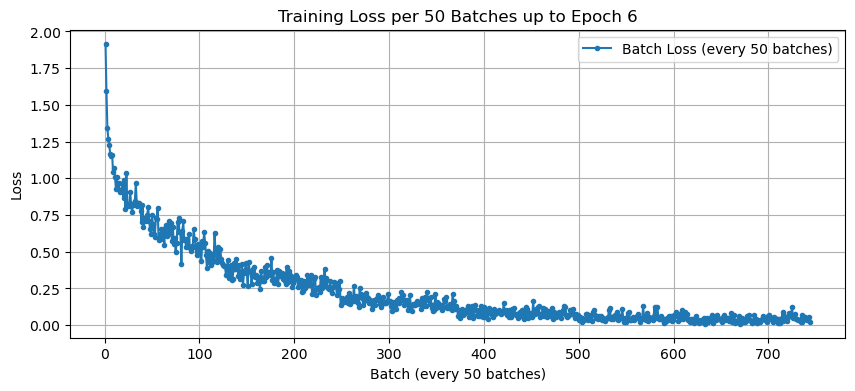

Epoch 7/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.84it/s, loss=0.1477]

Epoch 7/15 completed - Train Loss: 0.0306, Val Loss: 0.1378, Val Accuracy: 95.37%, Val Precision: 0.9326, Val Recall: 0.9639




C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


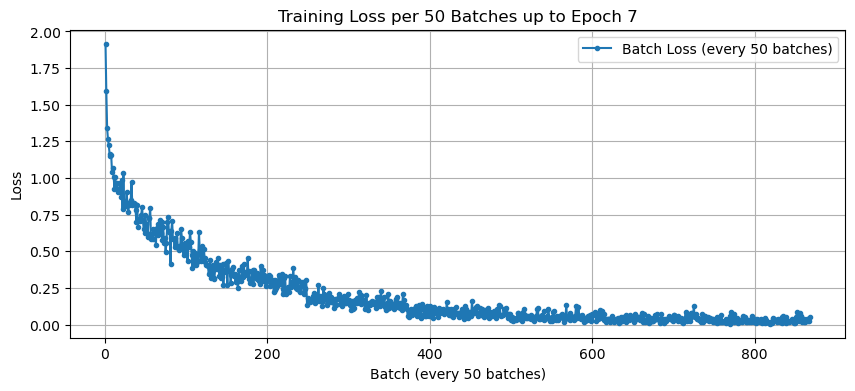

Epoch 8/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.81it/s, loss=0.3693]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 8/15 completed - Train Loss: 0.0287, Val Loss: 0.1127, Val Accuracy: 96.49%, Val Precision: 0.9627, Val Recall: 0.9657

Best model saved at epoch 8 with val loss: 0.1127


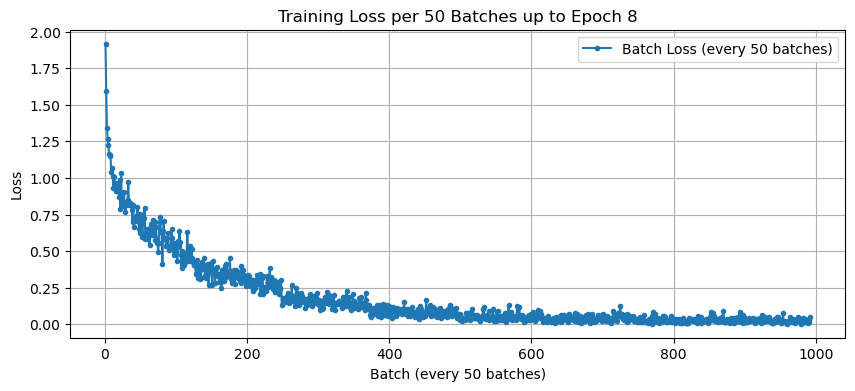

Epoch 9/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.88it/s, loss=0.7982]

Epoch 9/15 completed - Train Loss: 0.0249, Val Loss: 0.1168, Val Accuracy: 96.08%, Val Precision: 0.9619, Val Recall: 0.9588




C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


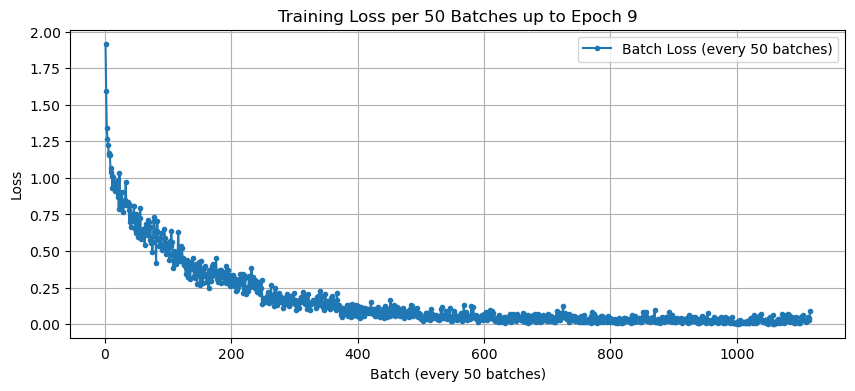

Epoch 10/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.92it/s, loss=0.3645]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 10/15 completed - Train Loss: 0.0214, Val Loss: 0.0968, Val Accuracy: 97.01%, Val Precision: 0.9642, Val Recall: 0.9746

Best model saved at epoch 10 with val loss: 0.0968


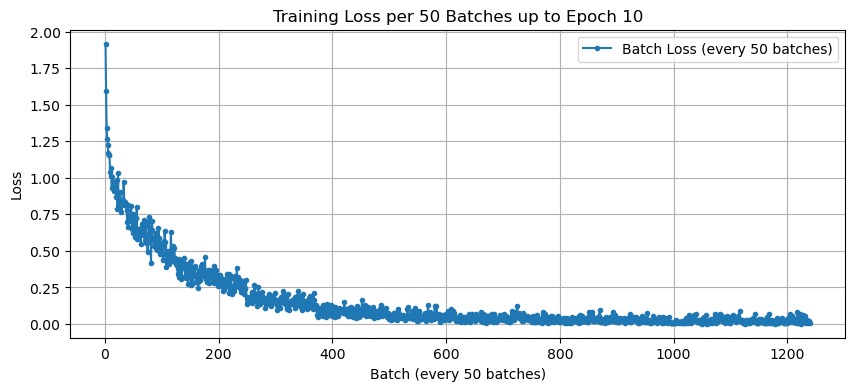

Epoch 11/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.79it/s, loss=0.5311]

Epoch 11/15 completed - Train Loss: 0.0177, Val Loss: 0.1101, Val Accuracy: 96.73%, Val Precision: 0.9505, Val Recall: 0.9723




C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


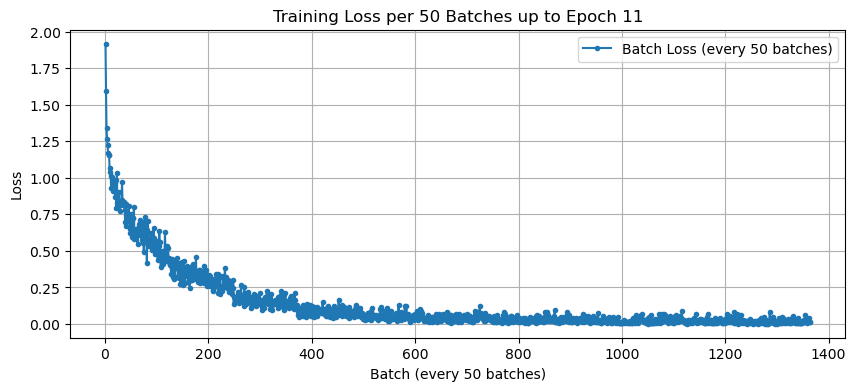

Epoch 12/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.81it/s, loss=0.6948]

Epoch 12/15 completed - Train Loss: 0.0172, Val Loss: 0.1051, Val Accuracy: 96.93%, Val Precision: 0.9633, Val Recall: 0.9756

Early stopping triggered after 12 epochs.



C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


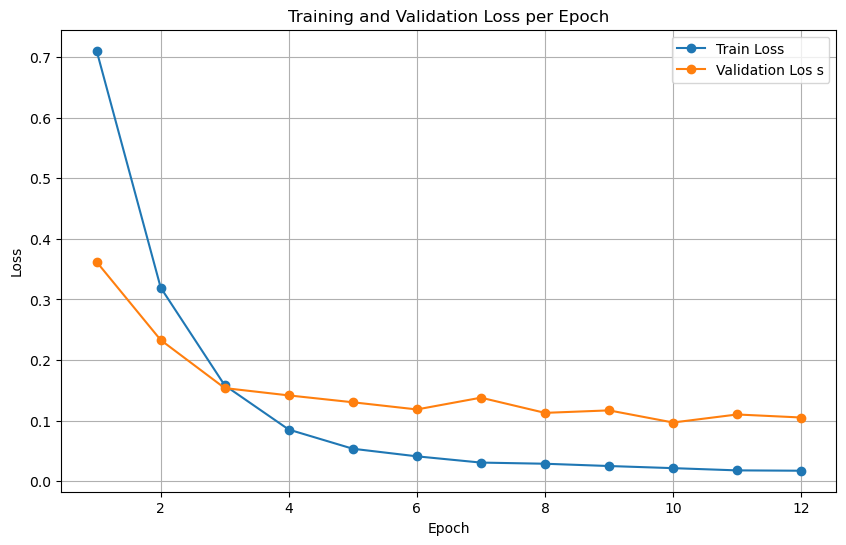

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 4 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_4_cosine.pt'

data_dir = "480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding new head:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Los s', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

### N_freeze = 4, ReduceLROnPlateau scheduler, custom head

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


Epoch 1/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.86it/s, loss=0.8249]


Epoch 1/15 completed - Train Loss: 0.9701, Val Loss: 0.4532, Val Accuracy: 85.54%, Val Precision: 0.6776, Val Recall: 0.7379

Best model saved at epoch 1 with val loss: 0.4532


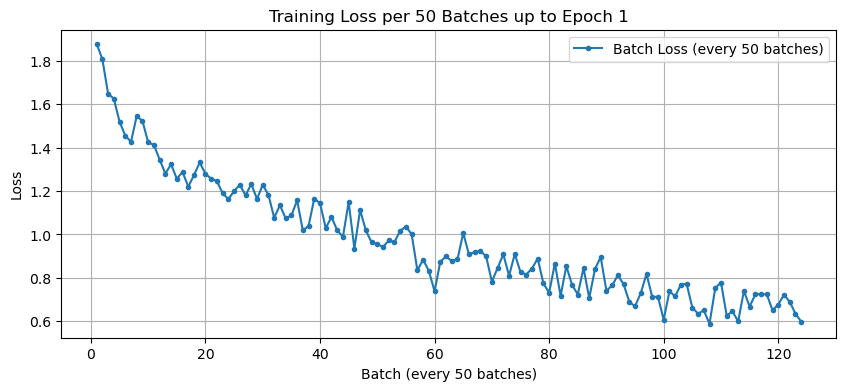

Epoch 2/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.87it/s, loss=0.3673]


Epoch 2/15 completed - Train Loss: 0.4508, Val Loss: 0.2750, Val Accuracy: 90.59%, Val Precision: 0.8314, Val Recall: 0.8450

Best model saved at epoch 2 with val loss: 0.2750


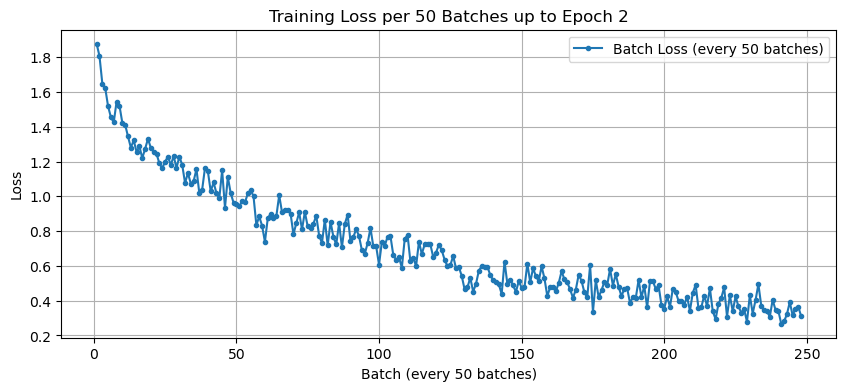

Epoch 3/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.95it/s, loss=0.0911]


Epoch 3/15 completed - Train Loss: 0.2277, Val Loss: 0.1900, Val Accuracy: 93.79%, Val Precision: 0.8936, Val Recall: 0.9465

Best model saved at epoch 3 with val loss: 0.1900


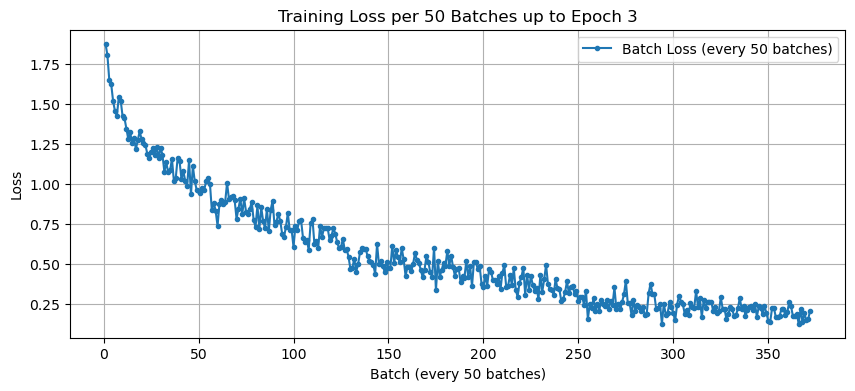

Epoch 4/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.87it/s, loss=0.1803]

Epoch 4/15 completed - Train Loss: 0.1198, Val Loss: 0.2315, Val Accuracy: 93.12%, Val Precision: 0.9060, Val Recall: 0.9424



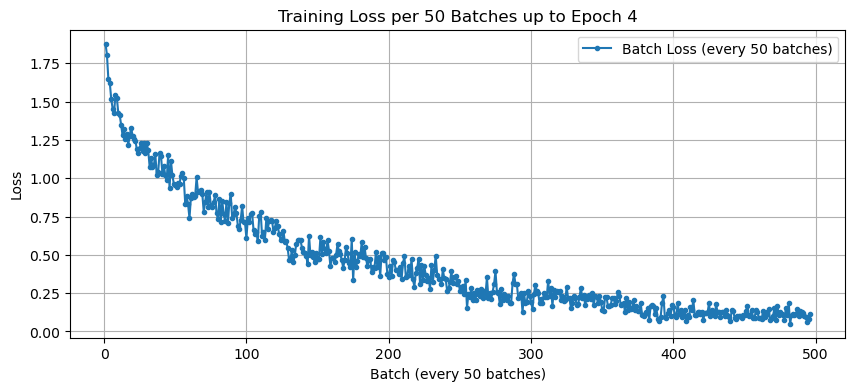

Epoch 5/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.84it/s, loss=0.2558]


Epoch 5/15 completed - Train Loss: 0.0797, Val Loss: 0.1768, Val Accuracy: 94.16%, Val Precision: 0.8905, Val Recall: 0.9595

Best model saved at epoch 5 with val loss: 0.1768


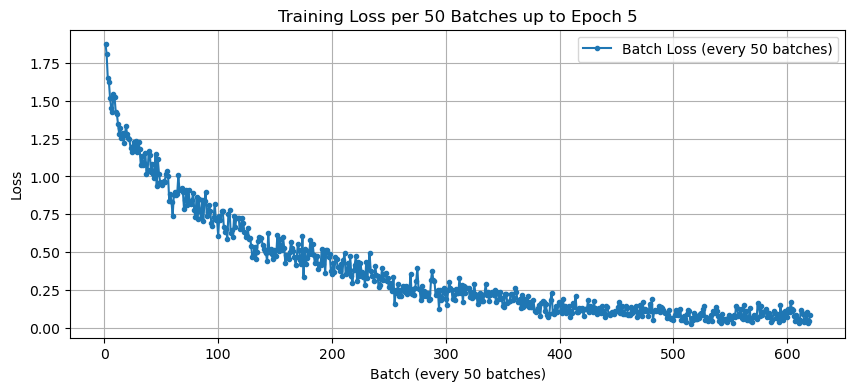

Epoch 6/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.88it/s, loss=0.4531]

Epoch 6/15 completed - Train Loss: 0.0592, Val Loss: 0.2097, Val Accuracy: 93.63%, Val Precision: 0.9123, Val Recall: 0.9612



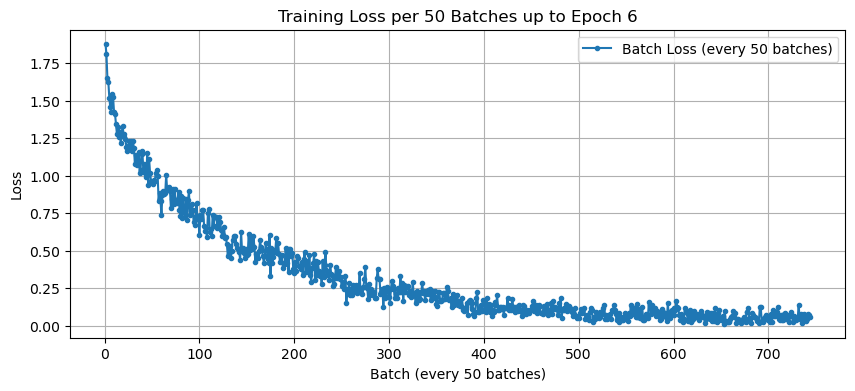

Epoch 7/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.90it/s, loss=0.5689]


Epoch 7/15 completed - Train Loss: 0.0490, Val Loss: 0.1755, Val Accuracy: 95.06%, Val Precision: 0.9156, Val Recall: 0.9624

Best model saved at epoch 7 with val loss: 0.1755


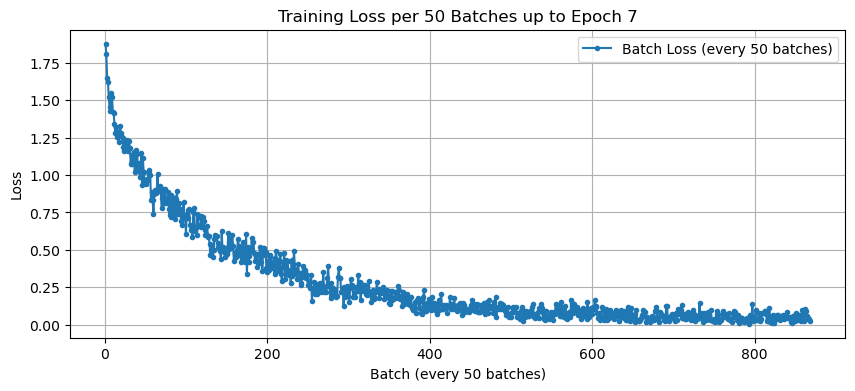

Epoch 8/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.86it/s, loss=0.0773]


Epoch 8/15 completed - Train Loss: 0.0414, Val Loss: 0.1444, Val Accuracy: 96.21%, Val Precision: 0.9508, Val Recall: 0.9705

Best model saved at epoch 8 with val loss: 0.1444


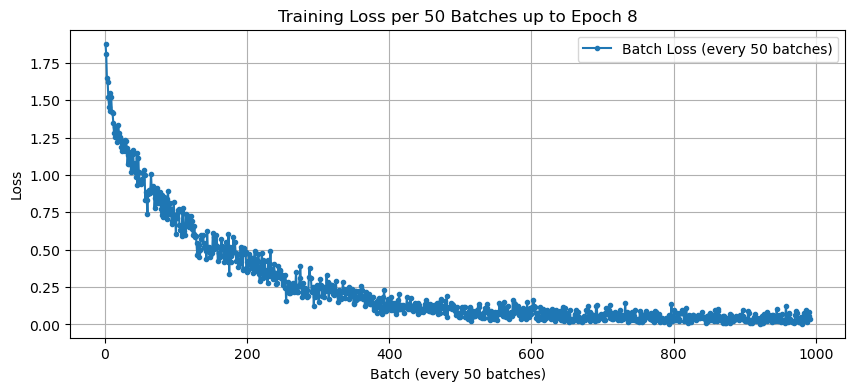

Epoch 9/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.97it/s, loss=0.0347]

Epoch 9/15 completed - Train Loss: 0.0373, Val Loss: 0.1539, Val Accuracy: 95.84%, Val Precision: 0.9373, Val Recall: 0.9676



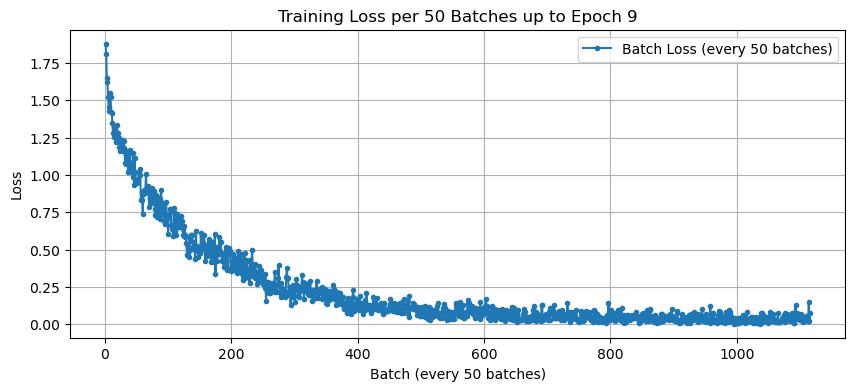

Epoch 10/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.89it/s, loss=0.2252]

Epoch 10/15 completed - Train Loss: 0.0325, Val Loss: 0.1643, Val Accuracy: 95.49%, Val Precision: 0.9141, Val Recall: 0.9643

Early stopping triggered after 10 epochs.


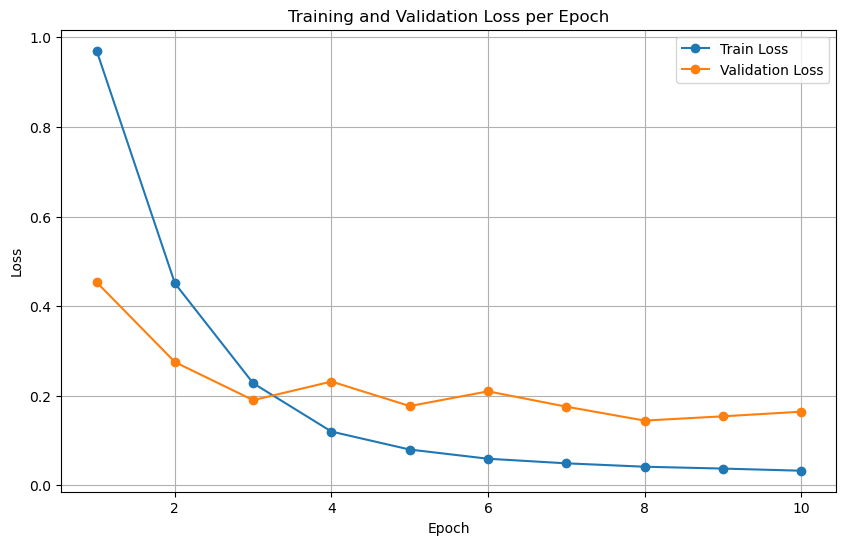

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 4 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_4_plateau_custom_head.pt'

data_dir = "480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding custom layers with dropout:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, 512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(256, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=1, factor=0.5)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

### N_freeze = 4, CosineAnnealingLR scheduler, custom head

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


Epoch 1/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.91it/s, loss=0.8756]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 1/15 completed - Train Loss: 0.9580, Val Loss: 0.5234, Val Accuracy: 82.93%, Val Precision: 0.6613, Val Recall: 0.6795

Best model saved at epoch 1 with val loss: 0.5234


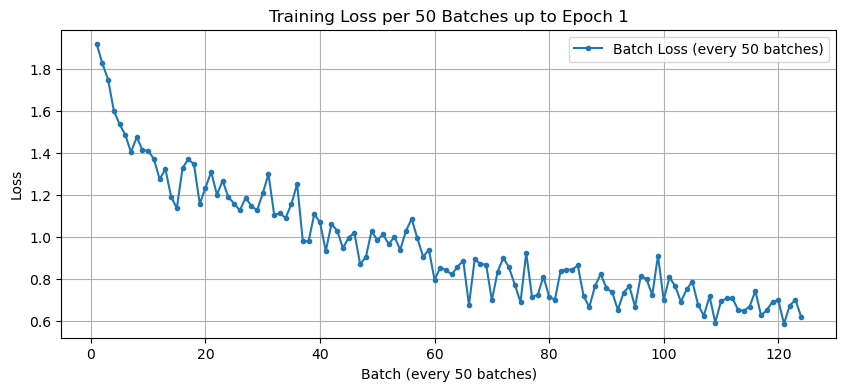

Epoch 2/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.90it/s, loss=0.5784]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 2/15 completed - Train Loss: 0.4593, Val Loss: 0.2925, Val Accuracy: 90.32%, Val Precision: 0.8762, Val Recall: 0.8696

Best model saved at epoch 2 with val loss: 0.2925


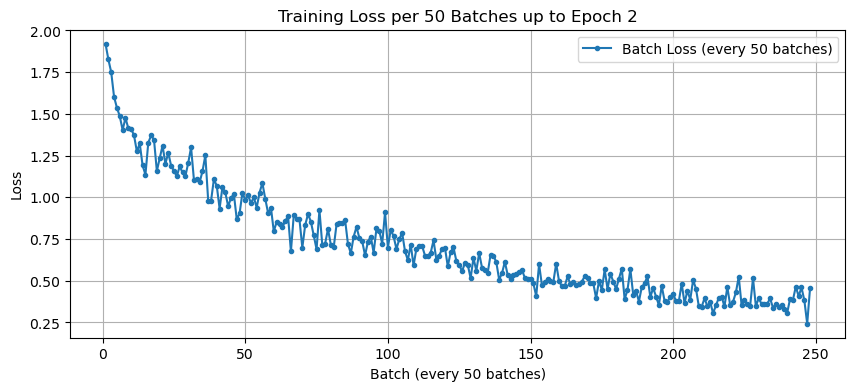

Epoch 3/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.94it/s, loss=0.2375]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 3/15 completed - Train Loss: 0.2358, Val Loss: 0.2217, Val Accuracy: 92.78%, Val Precision: 0.8859, Val Recall: 0.9301

Best model saved at epoch 3 with val loss: 0.2217


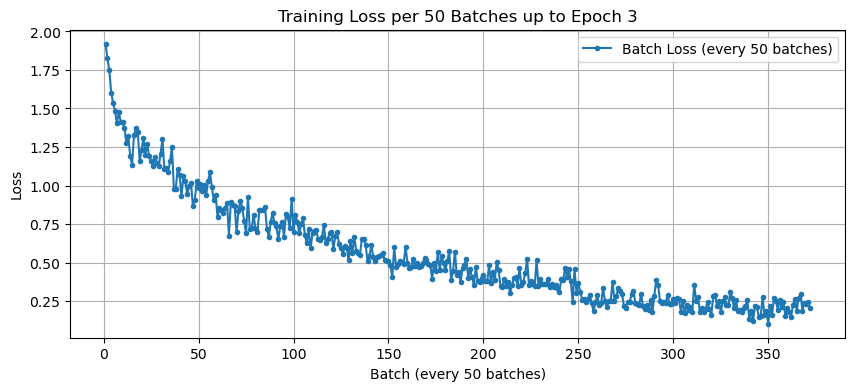

Epoch 4/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.86it/s, loss=0.8166]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 4/15 completed - Train Loss: 0.1220, Val Loss: 0.1794, Val Accuracy: 94.39%, Val Precision: 0.9114, Val Recall: 0.9493

Best model saved at epoch 4 with val loss: 0.1794


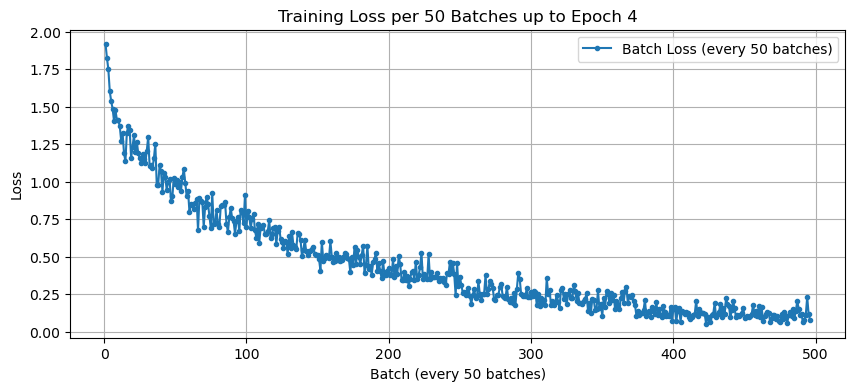

Epoch 5/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.88it/s, loss=0.7797]

Epoch 5/15 completed - Train Loss: 0.0843, Val Loss: 0.1806, Val Accuracy: 94.74%, Val Precision: 0.9047, Val Recall: 0.9540




C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


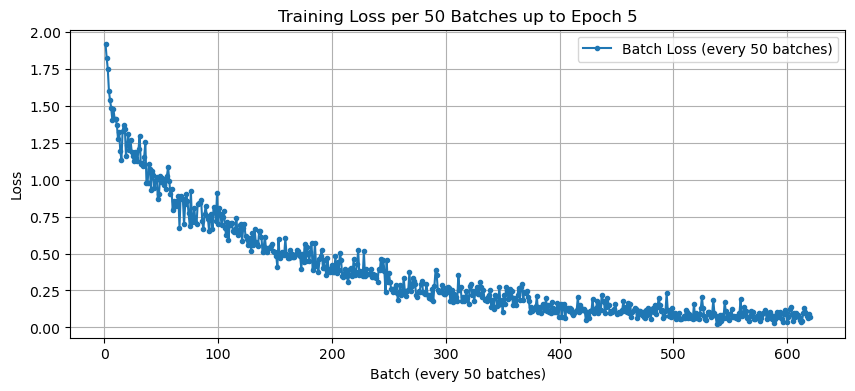

Epoch 6/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.92it/s, loss=1.3947]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 6/15 completed - Train Loss: 0.0609, Val Loss: 0.1717, Val Accuracy: 94.82%, Val Precision: 0.9165, Val Recall: 0.9553

Best model saved at epoch 6 with val loss: 0.1717


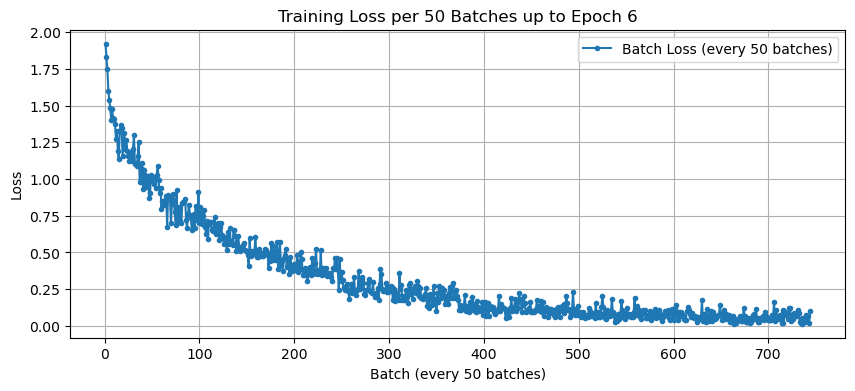

Epoch 7/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 28.00it/s, loss=0.0047]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 7/15 completed - Train Loss: 0.0450, Val Loss: 0.1638, Val Accuracy: 95.11%, Val Precision: 0.9173, Val Recall: 0.9628

Best model saved at epoch 7 with val loss: 0.1638


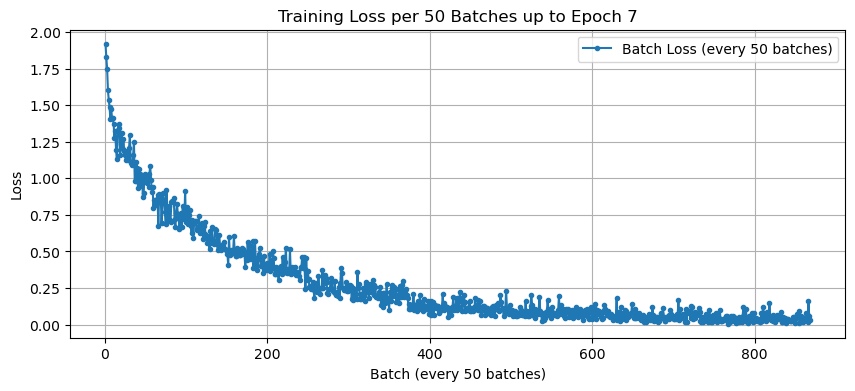

Epoch 8/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.94it/s, loss=0.1572]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 8/15 completed - Train Loss: 0.0389, Val Loss: 0.1538, Val Accuracy: 95.73%, Val Precision: 0.9339, Val Recall: 0.9598

Best model saved at epoch 8 with val loss: 0.1538


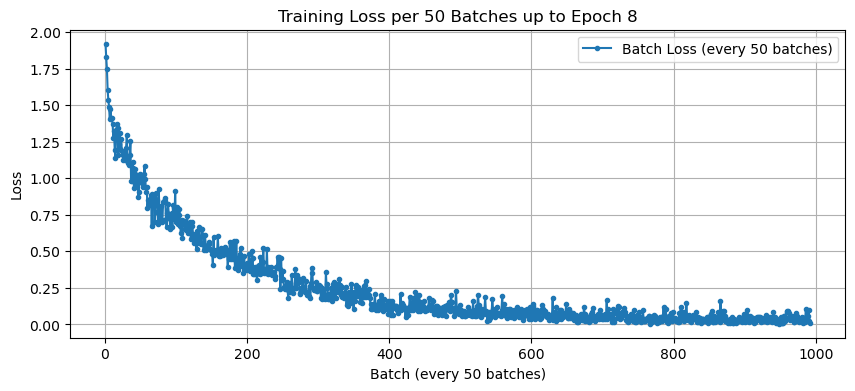

Epoch 9/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 28.03it/s, loss=0.1074]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 9/15 completed - Train Loss: 0.0368, Val Loss: 0.1114, Val Accuracy: 96.62%, Val Precision: 0.9532, Val Recall: 0.9698

Best model saved at epoch 9 with val loss: 0.1114


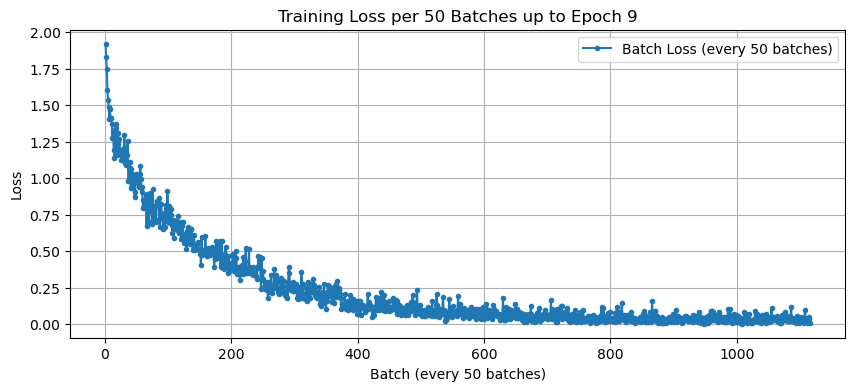

Epoch 10/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.92it/s, loss=0.0156]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 10/15 completed - Train Loss: 0.0328, Val Loss: 0.1035, Val Accuracy: 96.93%, Val Precision: 0.9573, Val Recall: 0.9682

Best model saved at epoch 10 with val loss: 0.1035


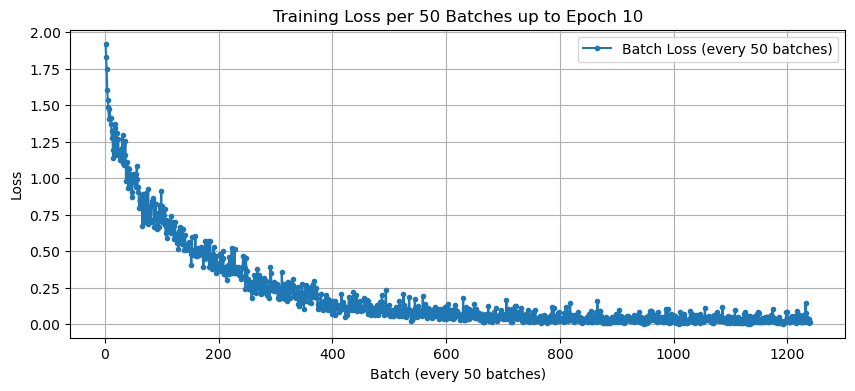

Epoch 11/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.82it/s, loss=0.0795]

Epoch 11/15 completed - Train Loss: 0.0296, Val Loss: 0.1805, Val Accuracy: 95.17%, Val Precision: 0.9432, Val Recall: 0.9555




C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


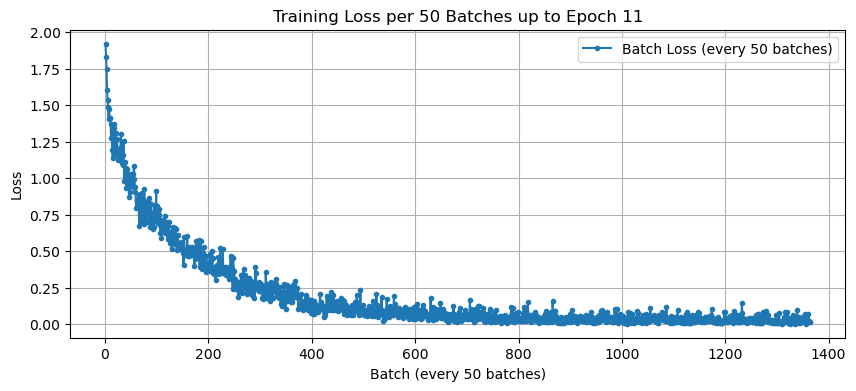

Epoch 12/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.89it/s, loss=0.5251]

Epoch 12/15 completed - Train Loss: 0.0251, Val Loss: 0.1540, Val Accuracy: 96.22%, Val Precision: 0.9447, Val Recall: 0.9717

Early stopping triggered after 12 epochs.



C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


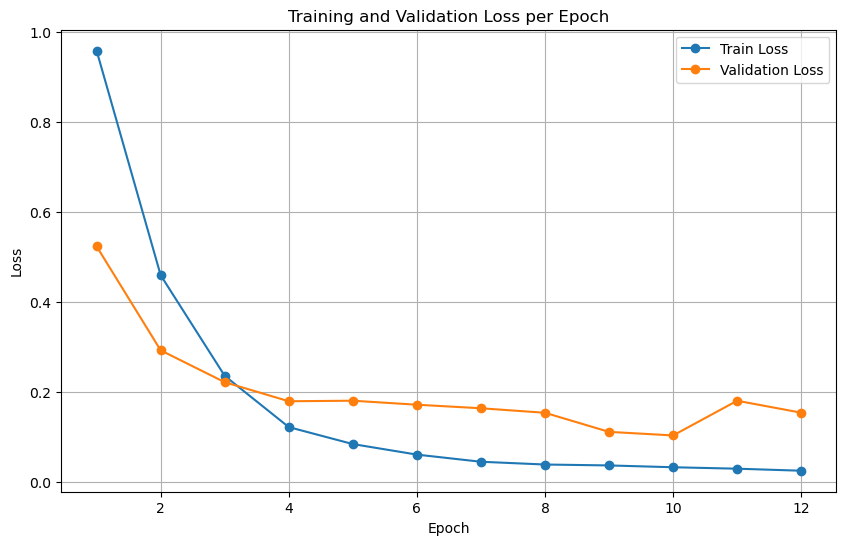

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 4 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_4_cosine_custom_head.pt'

data_dir = "480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding custom layers with dropout:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, 512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(256, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

# N_freeze = 5

### N_freeze = 5, ReduceLROnPlateau scheduler, no additional layers

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
Epoch 1/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 17.02it/s, loss=0.4011]


Epoch 1/15 completed - Train Loss: 0.7450, Val Loss: 0.3651, Val Accuracy: 87.45%, Val Precision: 0.8513, Val Recall: 0.8633

Best model saved at epoch 1 with val loss: 0.3651


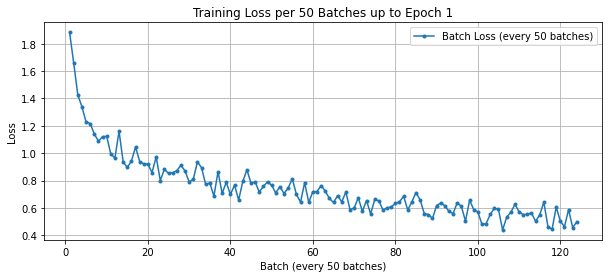

Epoch 2/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 17.01it/s, loss=0.1402]


Epoch 2/15 completed - Train Loss: 0.3661, Val Loss: 0.2589, Val Accuracy: 91.06%, Val Precision: 0.8758, Val Recall: 0.9060

Best model saved at epoch 2 with val loss: 0.2589


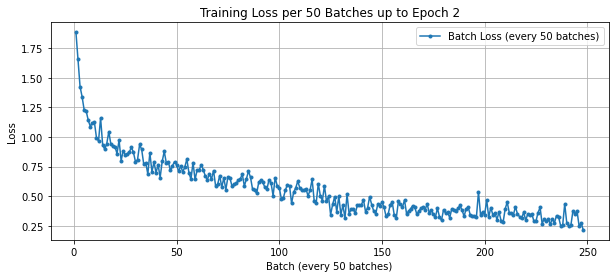

Epoch 3/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 17.02it/s, loss=0.1834]


Epoch 3/15 completed - Train Loss: 0.2012, Val Loss: 0.2398, Val Accuracy: 91.65%, Val Precision: 0.8577, Val Recall: 0.9414

Best model saved at epoch 3 with val loss: 0.2398


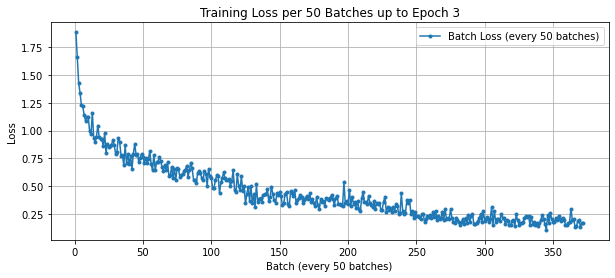

Epoch 4/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 17.01it/s, loss=0.0399]


Epoch 4/15 completed - Train Loss: 0.1117, Val Loss: 0.1706, Val Accuracy: 94.02%, Val Precision: 0.8958, Val Recall: 0.9506

Best model saved at epoch 4 with val loss: 0.1706


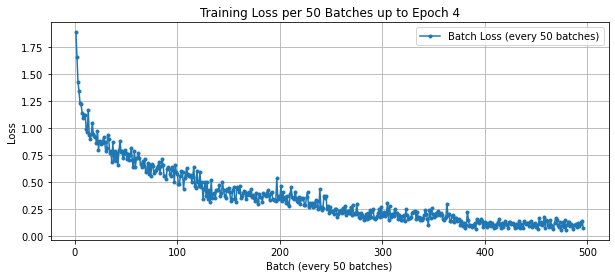

Epoch 5/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 17.01it/s, loss=0.4906]

Epoch 5/15 completed - Train Loss: 0.0754, Val Loss: 0.2162, Val Accuracy: 93.04%, Val Precision: 0.9082, Val Recall: 0.9379



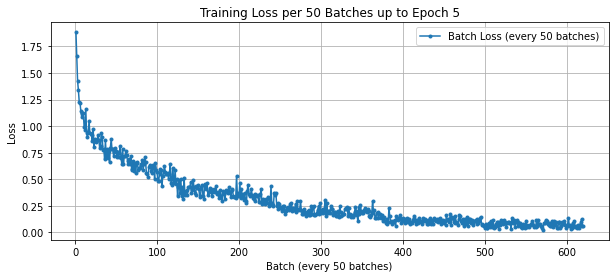

Epoch 6/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 17.01it/s, loss=0.0072]


Epoch 6/15 completed - Train Loss: 0.0531, Val Loss: 0.1628, Val Accuracy: 94.39%, Val Precision: 0.8949, Val Recall: 0.9512

Best model saved at epoch 6 with val loss: 0.1628


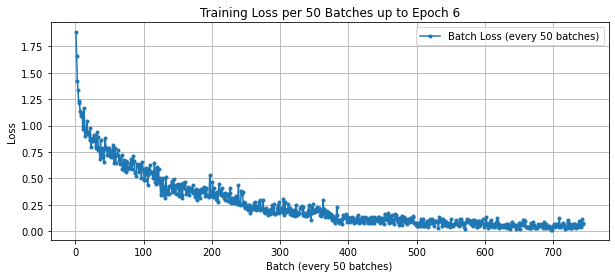

Epoch 7/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.98it/s, loss=0.0010]


Epoch 7/15 completed - Train Loss: 0.0418, Val Loss: 0.1514, Val Accuracy: 95.43%, Val Precision: 0.9254, Val Recall: 0.9633

Best model saved at epoch 7 with val loss: 0.1514


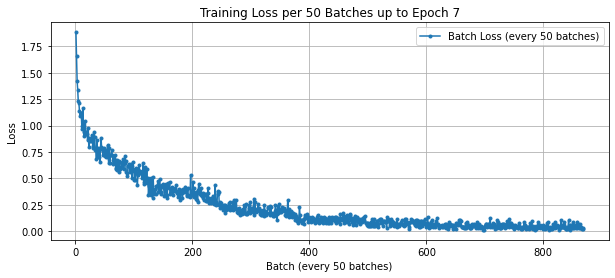

Epoch 8/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.97it/s, loss=0.0094]


Epoch 8/15 completed - Train Loss: 0.0363, Val Loss: 0.1444, Val Accuracy: 95.65%, Val Precision: 0.9400, Val Recall: 0.9654

Best model saved at epoch 8 with val loss: 0.1444


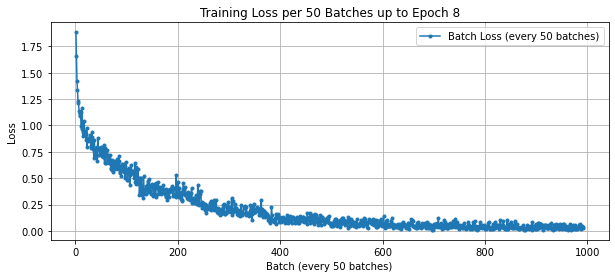

Epoch 9/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.99it/s, loss=0.0316]

Epoch 9/15 completed - Train Loss: 0.0300, Val Loss: 0.1625, Val Accuracy: 94.87%, Val Precision: 0.8970, Val Recall: 0.9604



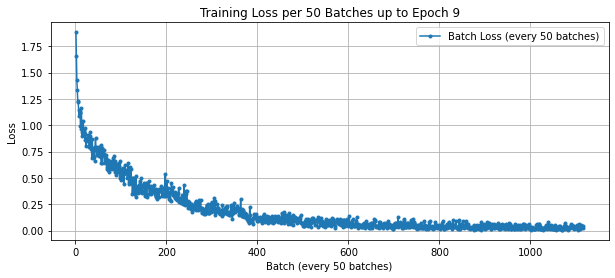

Epoch 10/15 [Val]: 100%|██████████████████████████████████████████████| 2077/2077 [02:02<00:00, 17.00it/s, loss=0.0077]

Epoch 10/15 completed - Train Loss: 0.0280, Val Loss: 0.1688, Val Accuracy: 94.85%, Val Precision: 0.9143, Val Recall: 0.9592

Early stopping triggered after 10 epochs.


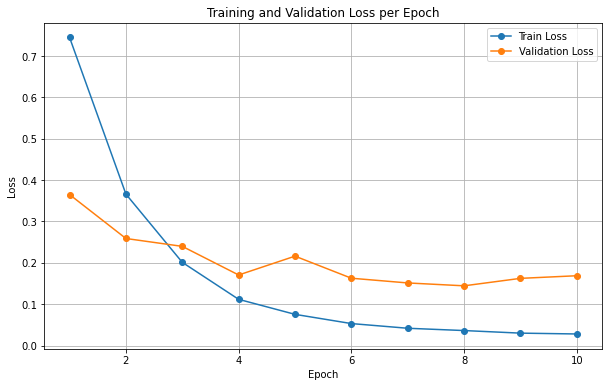

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 5 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_5_plateau.pt'

data_dir = r"C:/Users/User/images/480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding new head:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=1, factor=0.5, verbose=True)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

### N_freeze = 5, CosineAnnealingLR scheduler, no additional layers

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


Epoch 1/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 17.00it/s, loss=0.4647]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 1/15 completed - Train Loss: 0.7387, Val Loss: 0.4377, Val Accuracy: 85.18%, Val Precision: 0.7730, Val Recall: 0.8516

Best model saved at epoch 1 with val loss: 0.4377


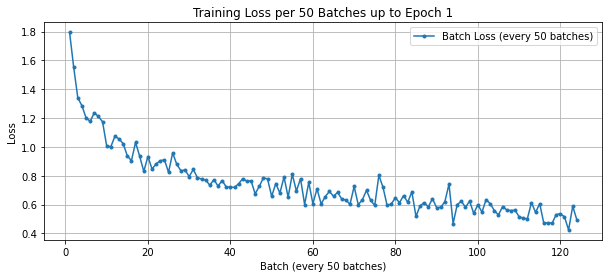

Epoch 2/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 17.00it/s, loss=0.3917]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 2/15 completed - Train Loss: 0.3647, Val Loss: 0.2478, Val Accuracy: 91.24%, Val Precision: 0.8777, Val Recall: 0.9234

Best model saved at epoch 2 with val loss: 0.2478


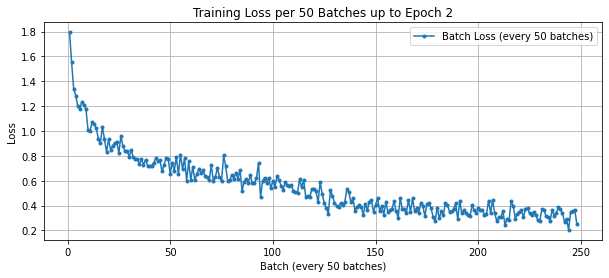

Epoch 3/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 17.00it/s, loss=0.6843]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 3/15 completed - Train Loss: 0.1975, Val Loss: 0.2285, Val Accuracy: 92.21%, Val Precision: 0.8920, Val Recall: 0.9377

Best model saved at epoch 3 with val loss: 0.2285


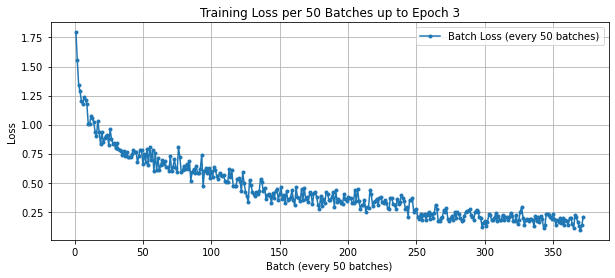

Epoch 4/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 17.01it/s, loss=0.2376]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 4/15 completed - Train Loss: 0.1107, Val Loss: 0.1767, Val Accuracy: 94.17%, Val Precision: 0.9287, Val Recall: 0.9500

Best model saved at epoch 4 with val loss: 0.1767


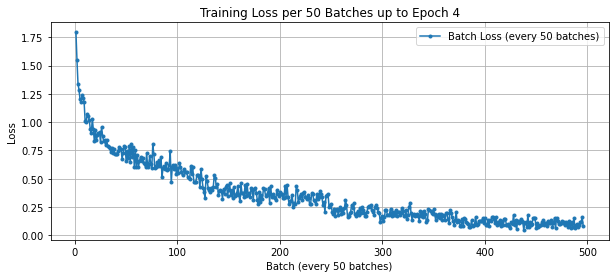

Epoch 5/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 17.01it/s, loss=1.0648]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 5/15 completed - Train Loss: 0.0728, Val Loss: 0.1484, Val Accuracy: 95.08%, Val Precision: 0.9321, Val Recall: 0.9606

Best model saved at epoch 5 with val loss: 0.1484


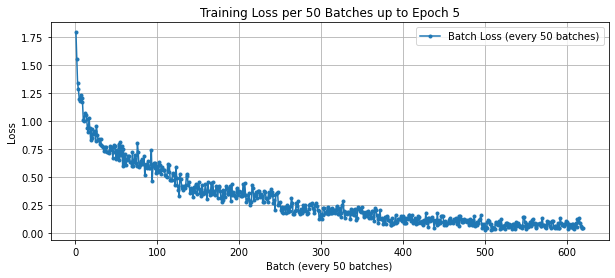

Epoch 6/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:01<00:00, 17.04it/s, loss=0.2927]

Epoch 6/15 completed - Train Loss: 0.0569, Val Loss: 0.1688, Val Accuracy: 94.42%, Val Precision: 0.9245, Val Recall: 0.9529




C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


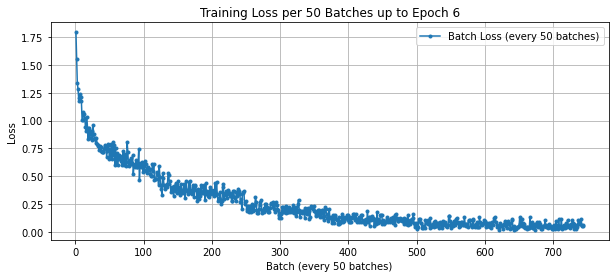

Epoch 7/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.99it/s, loss=0.0395]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 7/15 completed - Train Loss: 0.0425, Val Loss: 0.1423, Val Accuracy: 95.73%, Val Precision: 0.9377, Val Recall: 0.9669

Best model saved at epoch 7 with val loss: 0.1423


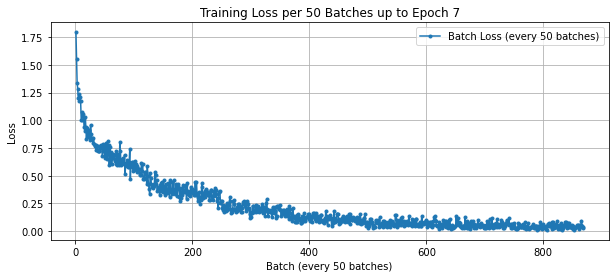

Epoch 8/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.99it/s, loss=0.5762]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 8/15 completed - Train Loss: 0.0343, Val Loss: 0.1372, Val Accuracy: 95.44%, Val Precision: 0.9323, Val Recall: 0.9620

Best model saved at epoch 8 with val loss: 0.1372


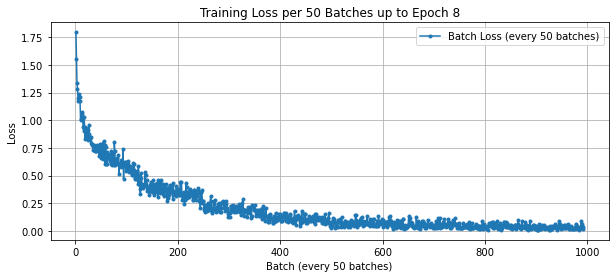

Epoch 9/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.98it/s, loss=1.6654]

Epoch 9/15 completed - Train Loss: 0.0280, Val Loss: 0.1708, Val Accuracy: 95.04%, Val Precision: 0.9449, Val Recall: 0.9571




C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


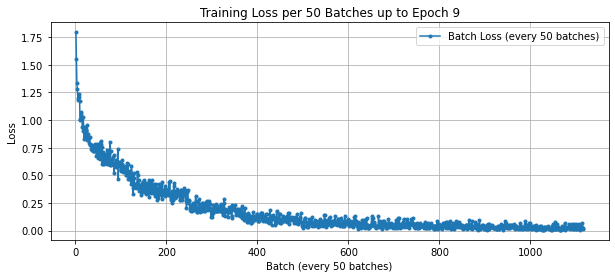

Epoch 10/15 [Val]: 100%|██████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.97it/s, loss=0.4212]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 10/15 completed - Train Loss: 0.0260, Val Loss: 0.1344, Val Accuracy: 95.93%, Val Precision: 0.9412, Val Recall: 0.9640

Best model saved at epoch 10 with val loss: 0.1344


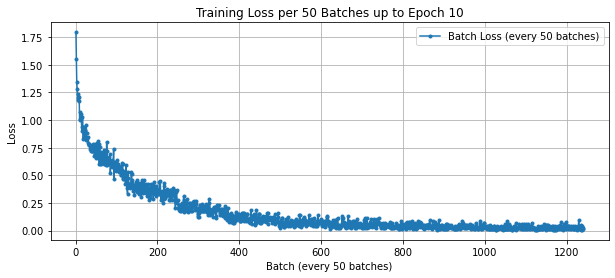

Epoch 11/15 [Val]: 100%|██████████████████████████████████████████████| 2077/2077 [02:02<00:00, 17.01it/s, loss=0.4208]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 11/15 completed - Train Loss: 0.0270, Val Loss: 0.1296, Val Accuracy: 96.08%, Val Precision: 0.9346, Val Recall: 0.9692

Best model saved at epoch 11 with val loss: 0.1296


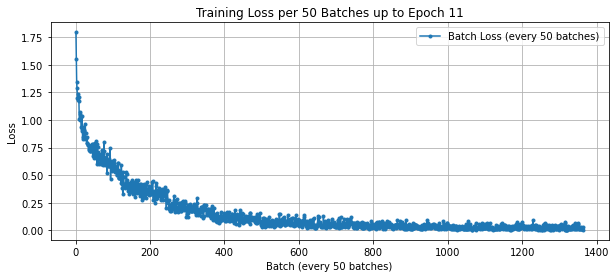

Epoch 12/15 [Val]: 100%|██████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.98it/s, loss=0.8986]

Epoch 12/15 completed - Train Loss: 0.0225, Val Loss: 0.1300, Val Accuracy: 96.26%, Val Precision: 0.9358, Val Recall: 0.9705




C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


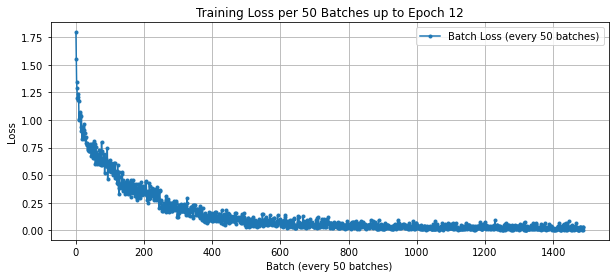

Epoch 13/15 [Val]: 100%|██████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.99it/s, loss=0.1928]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 13/15 completed - Train Loss: 0.0206, Val Loss: 0.1101, Val Accuracy: 96.81%, Val Precision: 0.9529, Val Recall: 0.9688

Best model saved at epoch 13 with val loss: 0.1101


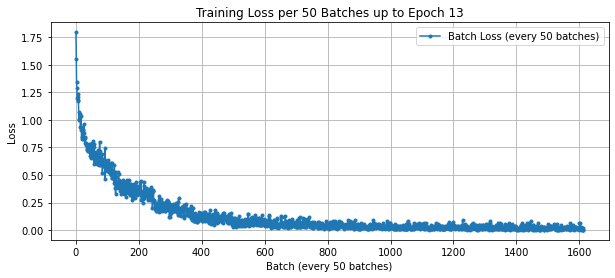

Epoch 14/15 [Val]: 100%|██████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.99it/s, loss=0.1691]

Epoch 14/15 completed - Train Loss: 0.0181, Val Loss: 0.1281, Val Accuracy: 96.67%, Val Precision: 0.9468, Val Recall: 0.9710




C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


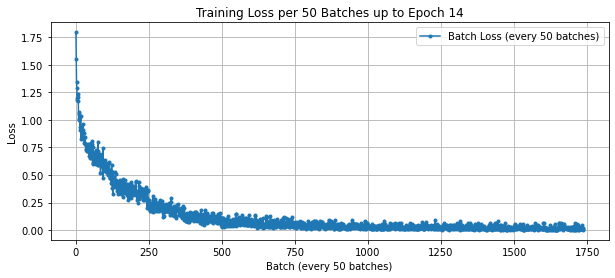

Epoch 15/15 [Val]: 100%|██████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.99it/s, loss=0.0174]

Epoch 15/15 completed - Train Loss: 0.0180, Val Loss: 0.1226, Val Accuracy: 96.71%, Val Precision: 0.9561, Val Recall: 0.9699

Early stopping triggered after 15 epochs.



C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


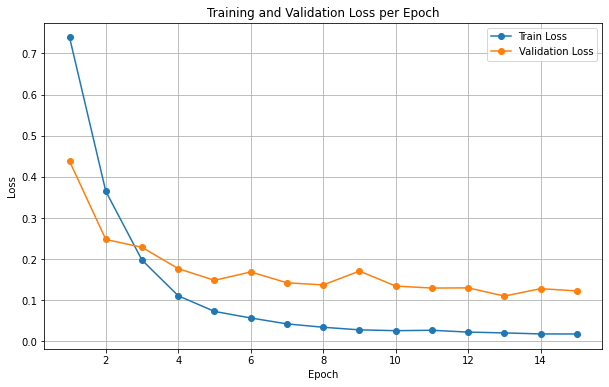

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 5 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_5_cosine.pt'

data_dir = r"C:/Users/User/images/480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding new head:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

### N_freeze = 5, ReduceLROnPlateau scheduler, custom head

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(
Epoch 1/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.98it/s, loss=1.2768]


Epoch 1/15 completed - Train Loss: 1.0150, Val Loss: 0.5572, Val Accuracy: 81.72%, Val Precision: 0.6804, Val Recall: 0.6755

Best model saved at epoch 1 with val loss: 0.5572


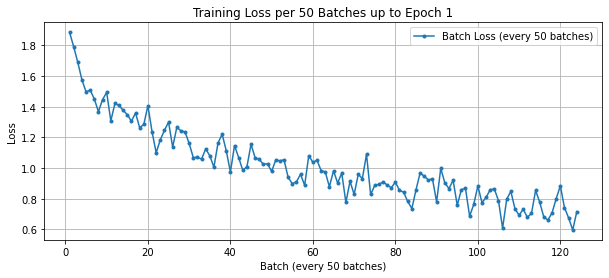

Epoch 2/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.97it/s, loss=0.4459]


Epoch 2/15 completed - Train Loss: 0.5382, Val Loss: 0.3493, Val Accuracy: 87.86%, Val Precision: 0.7146, Val Recall: 0.7730

Best model saved at epoch 2 with val loss: 0.3493


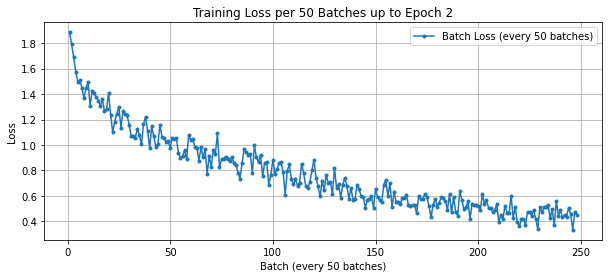

Epoch 3/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:03<00:00, 16.78it/s, loss=0.1304]


Epoch 3/15 completed - Train Loss: 0.3141, Val Loss: 0.2844, Val Accuracy: 90.68%, Val Precision: 0.8485, Val Recall: 0.9064

Best model saved at epoch 3 with val loss: 0.2844


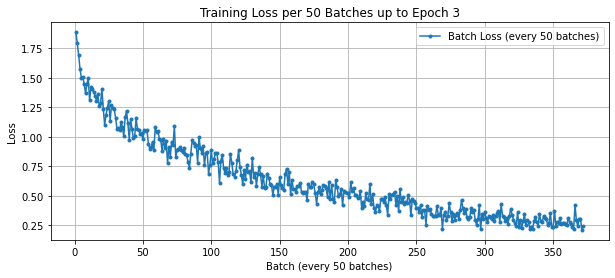

Epoch 4/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.97it/s, loss=0.2928]


Epoch 4/15 completed - Train Loss: 0.1773, Val Loss: 0.2190, Val Accuracy: 92.86%, Val Precision: 0.8784, Val Recall: 0.9311

Best model saved at epoch 4 with val loss: 0.2190


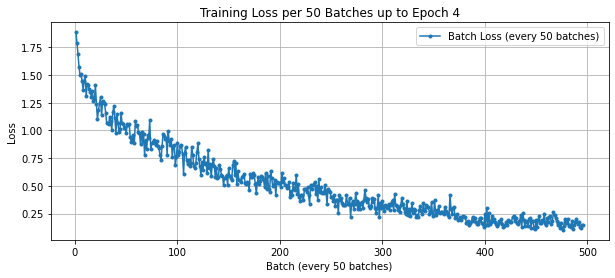

Epoch 5/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.97it/s, loss=0.1279]


Epoch 5/15 completed - Train Loss: 0.1131, Val Loss: 0.1669, Val Accuracy: 94.69%, Val Precision: 0.9206, Val Recall: 0.9471

Best model saved at epoch 5 with val loss: 0.1669


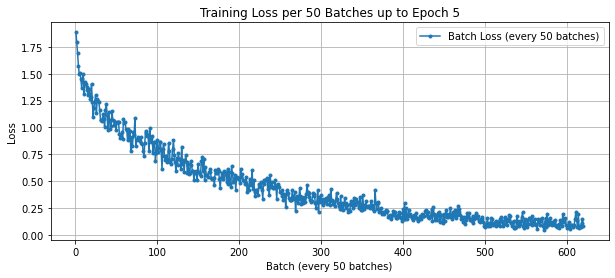

Epoch 6/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.99it/s, loss=0.0509]


Epoch 6/15 completed - Train Loss: 0.0843, Val Loss: 0.1605, Val Accuracy: 94.72%, Val Precision: 0.9335, Val Recall: 0.9518

Best model saved at epoch 6 with val loss: 0.1605


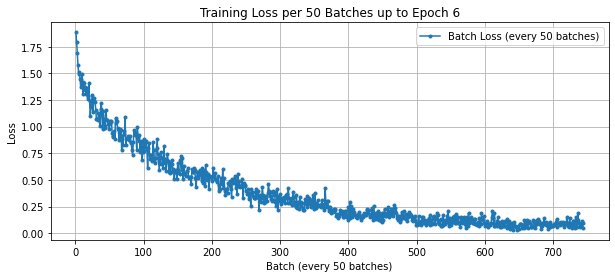

Epoch 7/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.97it/s, loss=0.0185]

Epoch 7/15 completed - Train Loss: 0.0689, Val Loss: 0.1812, Val Accuracy: 94.35%, Val Precision: 0.9303, Val Recall: 0.9518



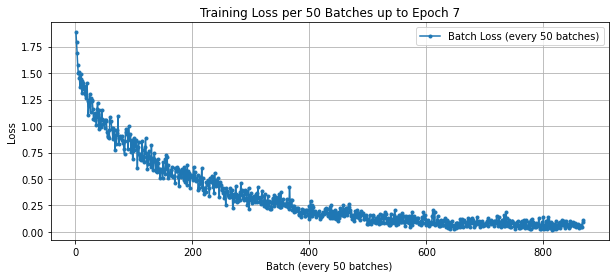

Epoch 8/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.98it/s, loss=0.0347]

Epoch 8/15 completed - Train Loss: 0.0517, Val Loss: 0.1799, Val Accuracy: 94.72%, Val Precision: 0.9229, Val Recall: 0.9506

Early stopping triggered after 8 epochs.


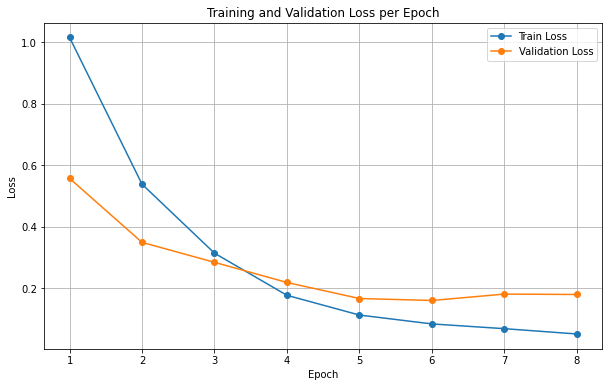

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 5 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_5_plateau_custom_head.pt'

data_dir = r"C:/Users/User/images/480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding custom layers with dropout:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, 512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(256, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=1, factor=0.5, verbose=True)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

### N_freeze = 5, CosineAnnealingLR scheduler, custom head

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


Epoch 1/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.96it/s, loss=0.8102]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 1/15 completed - Train Loss: 1.0023, Val Loss: 0.5429, Val Accuracy: 82.81%, Val Precision: 0.6819, Val Recall: 0.6924

Best model saved at epoch 1 with val loss: 0.5429


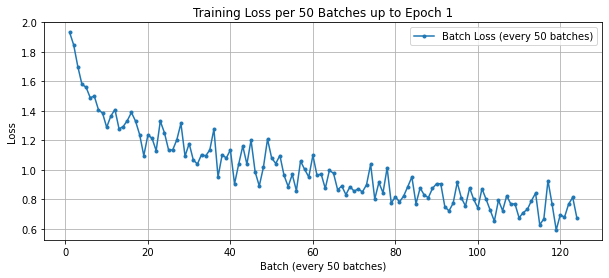

Epoch 2/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.97it/s, loss=0.7784]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 2/15 completed - Train Loss: 0.5223, Val Loss: 0.3867, Val Accuracy: 87.13%, Val Precision: 0.8372, Val Recall: 0.7951

Best model saved at epoch 2 with val loss: 0.3867


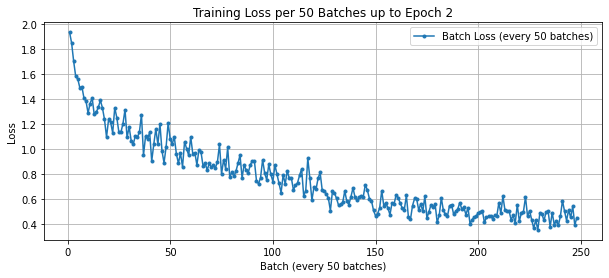

Epoch 3/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.95it/s, loss=0.2074]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 3/15 completed - Train Loss: 0.2967, Val Loss: 0.2611, Val Accuracy: 91.07%, Val Precision: 0.8908, Val Recall: 0.9107

Best model saved at epoch 3 with val loss: 0.2611


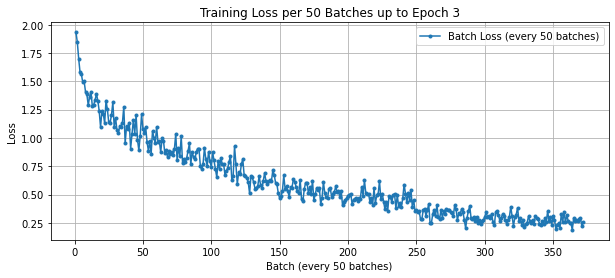

Epoch 4/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.94it/s, loss=0.1277]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 4/15 completed - Train Loss: 0.1739, Val Loss: 0.2199, Val Accuracy: 93.08%, Val Precision: 0.9042, Val Recall: 0.9363

Best model saved at epoch 4 with val loss: 0.2199


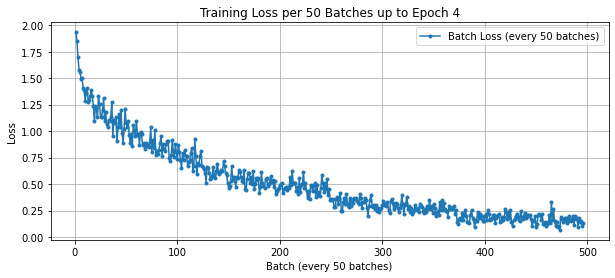

Epoch 5/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.96it/s, loss=0.2719]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 5/15 completed - Train Loss: 0.1168, Val Loss: 0.2106, Val Accuracy: 92.67%, Val Precision: 0.8820, Val Recall: 0.9433

Best model saved at epoch 5 with val loss: 0.2106


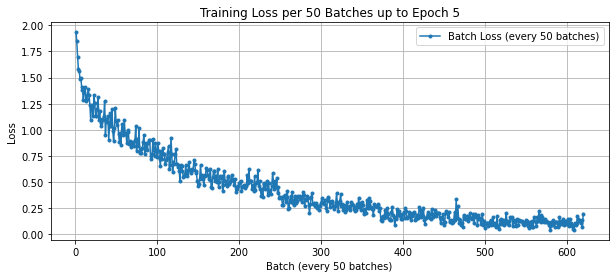

Epoch 6/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.97it/s, loss=0.4547]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 6/15 completed - Train Loss: 0.0833, Val Loss: 0.1726, Val Accuracy: 94.58%, Val Precision: 0.9122, Val Recall: 0.9523

Best model saved at epoch 6 with val loss: 0.1726


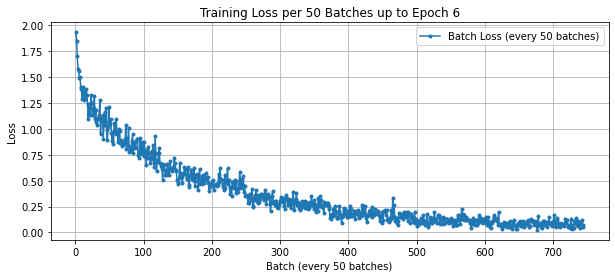

Epoch 7/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.97it/s, loss=0.2394]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 7/15 completed - Train Loss: 0.0621, Val Loss: 0.1633, Val Accuracy: 94.64%, Val Precision: 0.9175, Val Recall: 0.9561

Best model saved at epoch 7 with val loss: 0.1633


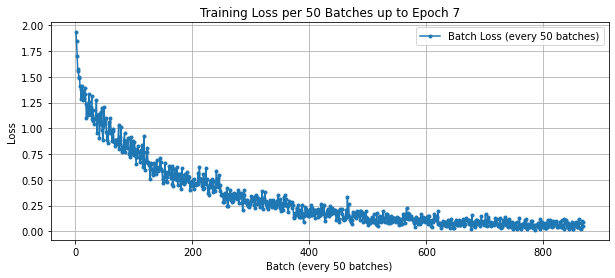

Epoch 8/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.97it/s, loss=0.0814]
C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 8/15 completed - Train Loss: 0.0558, Val Loss: 0.1512, Val Accuracy: 95.32%, Val Precision: 0.9263, Val Recall: 0.9609

Best model saved at epoch 8 with val loss: 0.1512


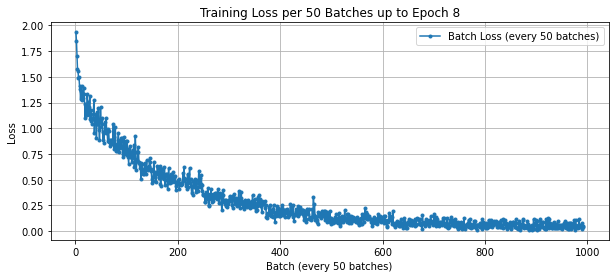

Epoch 9/15 [Val]: 100%|███████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.96it/s, loss=0.2379]

Epoch 9/15 completed - Train Loss: 0.0464, Val Loss: 0.1653, Val Accuracy: 95.11%, Val Precision: 0.9419, Val Recall: 0.9565




C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


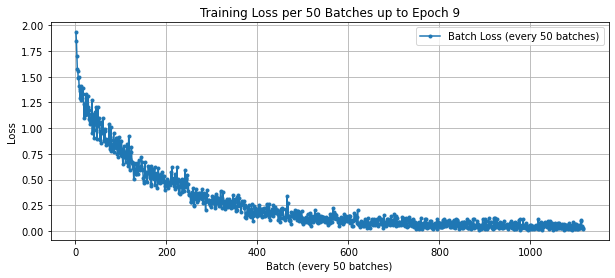

Epoch 10/15 [Val]: 100%|██████████████████████████████████████████████| 2077/2077 [02:02<00:00, 16.97it/s, loss=0.0260]

Epoch 10/15 completed - Train Loss: 0.0398, Val Loss: 0.1591, Val Accuracy: 95.17%, Val Precision: 0.9139, Val Recall: 0.9553

Early stopping triggered after 10 epochs.



C:\Users\User\anaconda3\lib\site-packages\torch\optim\lr_scheduler.py:243: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


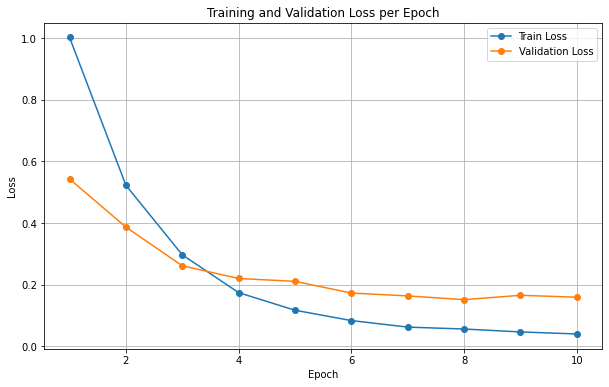

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 5 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_5_cosine_custom_head.pt'

data_dir = r"C:/Users/User/images/480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding custom layers with dropout:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, 512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(256, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

# N_freeze = 6

### N_freeze = 6, ReduceLROnPlateau scheduler, no additional layers

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


Epoch 1/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.85it/s, loss=0.8730]


Epoch 1/15 completed - Train Loss: 0.8341, Val Loss: 0.4659, Val Accuracy: 83.59%, Val Precision: 0.7962, Val Recall: 0.8009

Best model saved at epoch 1 with val loss: 0.4659


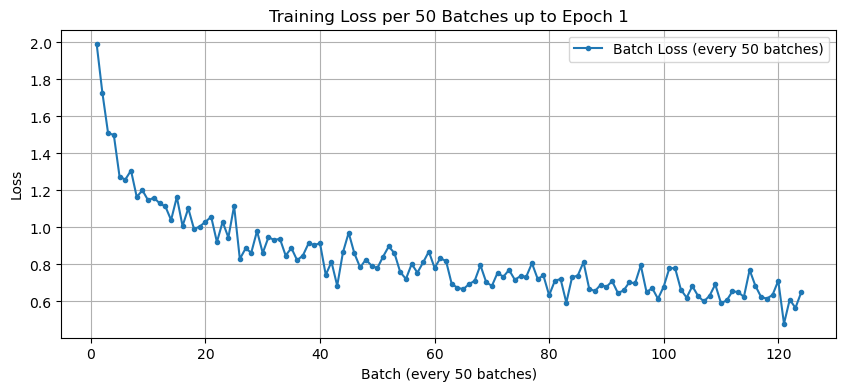

Epoch 2/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.83it/s, loss=0.2754]


Epoch 2/15 completed - Train Loss: 0.5079, Val Loss: 0.3445, Val Accuracy: 88.10%, Val Precision: 0.8374, Val Recall: 0.8849

Best model saved at epoch 2 with val loss: 0.3445


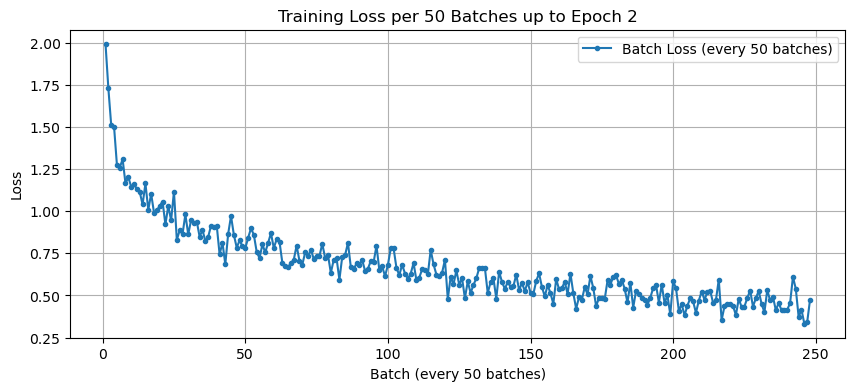

Epoch 3/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.93it/s, loss=0.1538]


Epoch 3/15 completed - Train Loss: 0.3451, Val Loss: 0.2936, Val Accuracy: 89.74%, Val Precision: 0.8345, Val Recall: 0.9102

Best model saved at epoch 3 with val loss: 0.2936


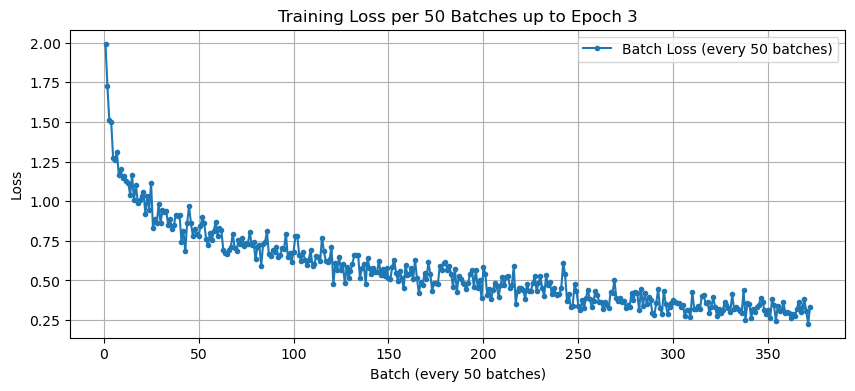

Epoch 4/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 28.01it/s, loss=0.0317]


Epoch 4/15 completed - Train Loss: 0.2399, Val Loss: 0.2461, Val Accuracy: 91.69%, Val Precision: 0.8773, Val Recall: 0.9324

Best model saved at epoch 4 with val loss: 0.2461


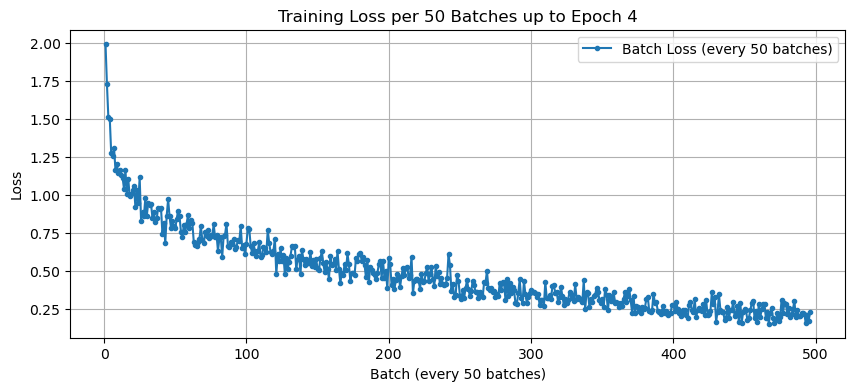

Epoch 5/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 28.05it/s, loss=0.0424]


Epoch 5/15 completed - Train Loss: 0.1704, Val Loss: 0.2402, Val Accuracy: 91.66%, Val Precision: 0.8670, Val Recall: 0.9368

Best model saved at epoch 5 with val loss: 0.2402


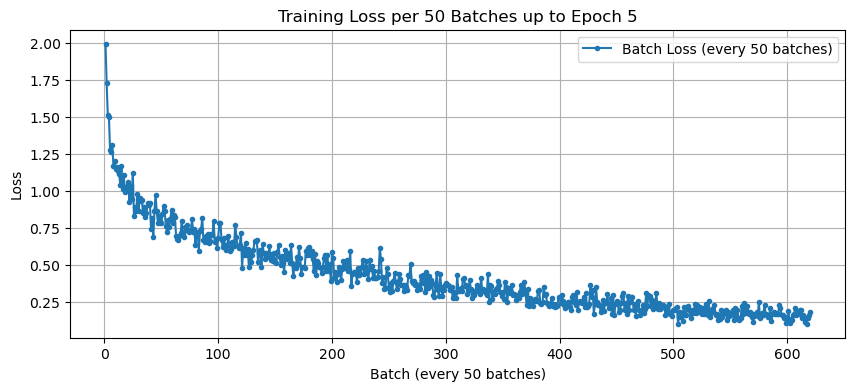

Epoch 6/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 28.02it/s, loss=0.0278]


Epoch 6/15 completed - Train Loss: 0.1265, Val Loss: 0.1757, Val Accuracy: 93.75%, Val Precision: 0.9120, Val Recall: 0.9474

Best model saved at epoch 6 with val loss: 0.1757


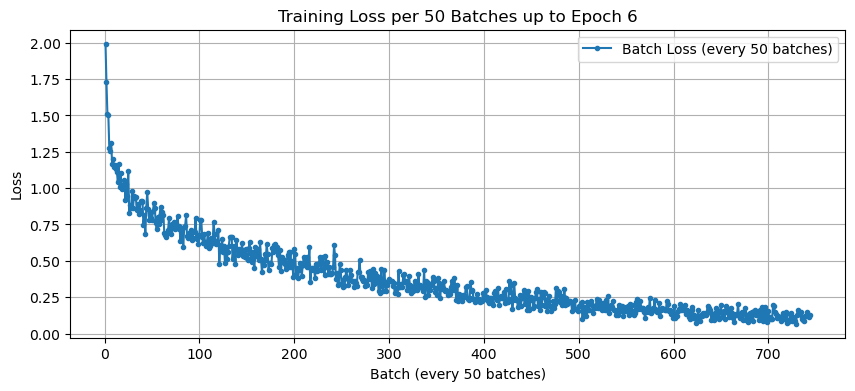

Epoch 7/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.98it/s, loss=0.0008]

Epoch 7/15 completed - Train Loss: 0.0940, Val Loss: 0.1999, Val Accuracy: 93.26%, Val Precision: 0.9070, Val Recall: 0.9505



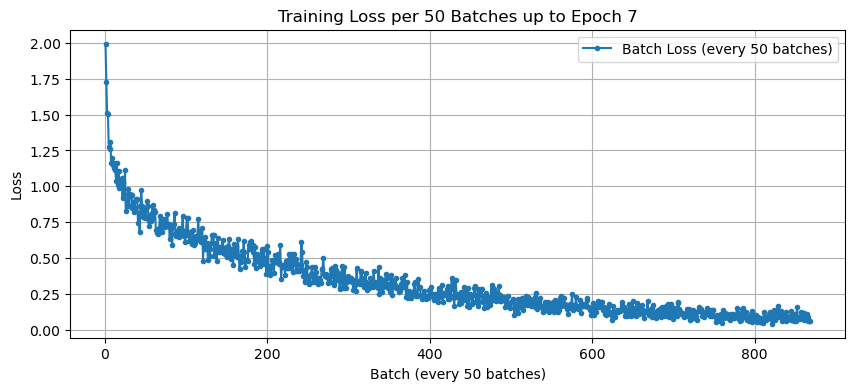

Epoch 8/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 28.02it/s, loss=0.0068]

Epoch 8/15 completed - Train Loss: 0.0735, Val Loss: 0.1790, Val Accuracy: 94.32%, Val Precision: 0.9048, Val Recall: 0.9575

Early stopping triggered after 8 epochs.


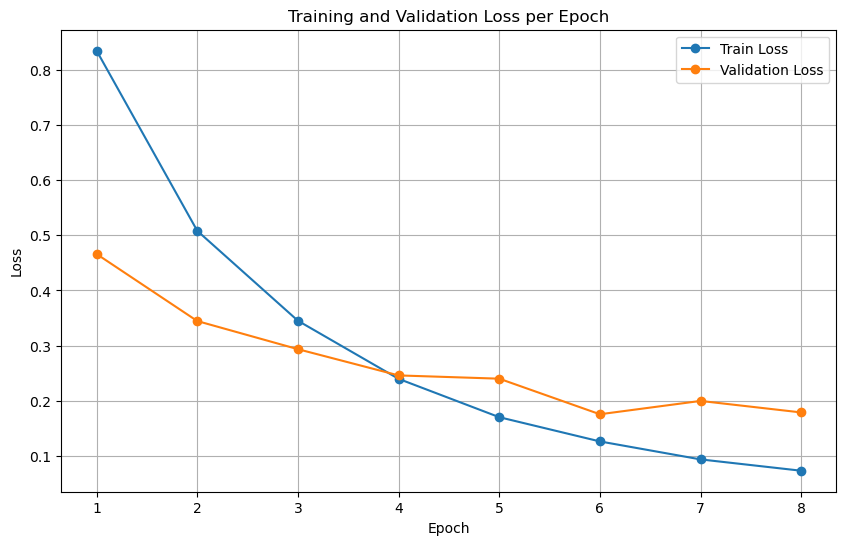

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 6 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_6_plwateau.pt'

data_dir = "480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding new head:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=1, factor=0.5)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

### N_freeze = 6, CosineAnnealingLR scheduler, no additional layers

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


Epoch 1/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.98it/s, loss=0.7063]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 1/15 completed - Train Loss: 0.8381, Val Loss: 0.4827, Val Accuracy: 84.35%, Val Precision: 0.7829, Val Recall: 0.8227

Best model saved at epoch 1 with val loss: 0.4827


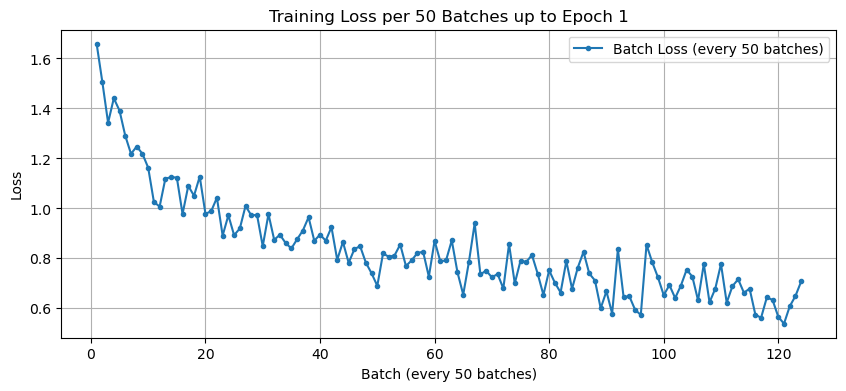

Epoch 2/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.95it/s, loss=0.8012]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 2/15 completed - Train Loss: 0.5101, Val Loss: 0.3745, Val Accuracy: 86.89%, Val Precision: 0.8162, Val Recall: 0.8801

Best model saved at epoch 2 with val loss: 0.3745


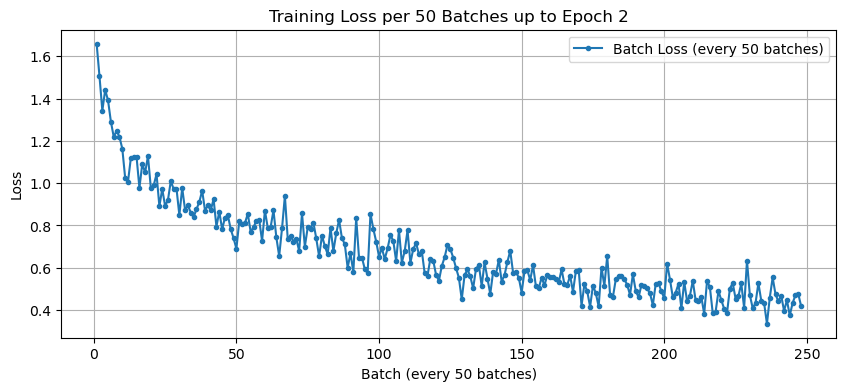

Epoch 3/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.99it/s, loss=0.7238]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 3/15 completed - Train Loss: 0.3468, Val Loss: 0.3302, Val Accuracy: 88.59%, Val Precision: 0.8222, Val Recall: 0.9097

Best model saved at epoch 3 with val loss: 0.3302


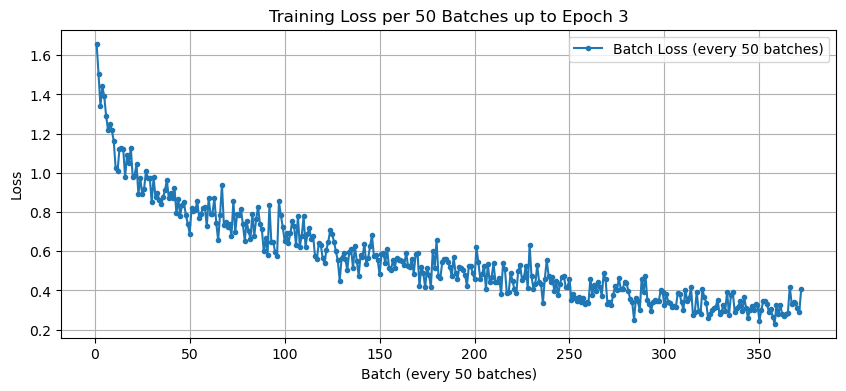

Epoch 4/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.99it/s, loss=0.4469]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 4/15 completed - Train Loss: 0.2340, Val Loss: 0.2547, Val Accuracy: 90.92%, Val Precision: 0.8545, Val Recall: 0.9284

Best model saved at epoch 4 with val loss: 0.2547


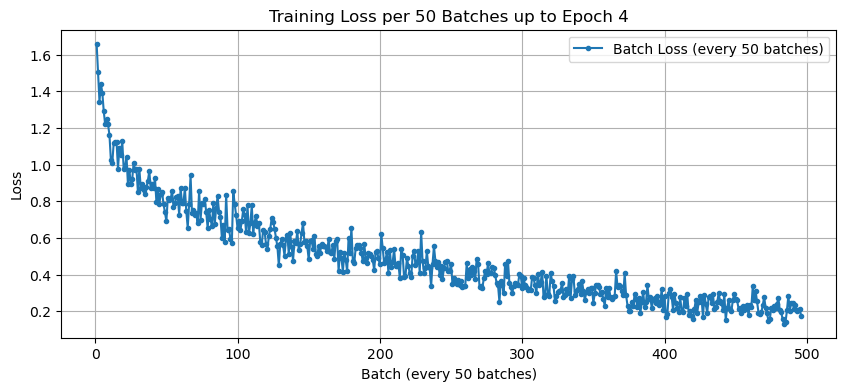

Epoch 5/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 28.03it/s, loss=0.0702]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 5/15 completed - Train Loss: 0.1680, Val Loss: 0.2476, Val Accuracy: 91.69%, Val Precision: 0.8589, Val Recall: 0.9427

Best model saved at epoch 5 with val loss: 0.2476


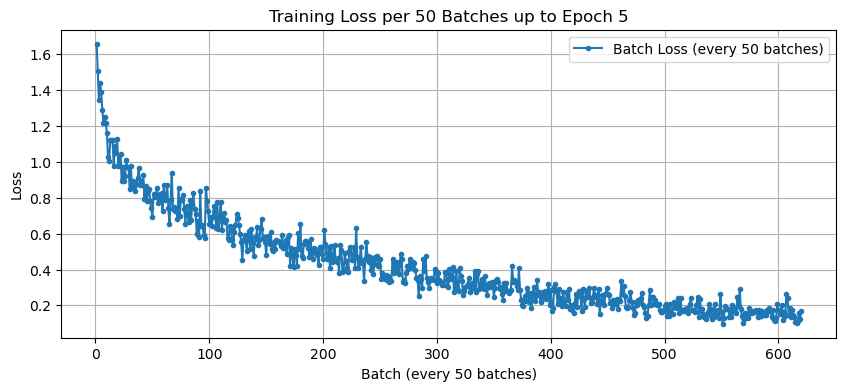

Epoch 6/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.87it/s, loss=1.0219]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 6/15 completed - Train Loss: 0.1233, Val Loss: 0.2259, Val Accuracy: 92.61%, Val Precision: 0.8752, Val Recall: 0.9460

Best model saved at epoch 6 with val loss: 0.2259


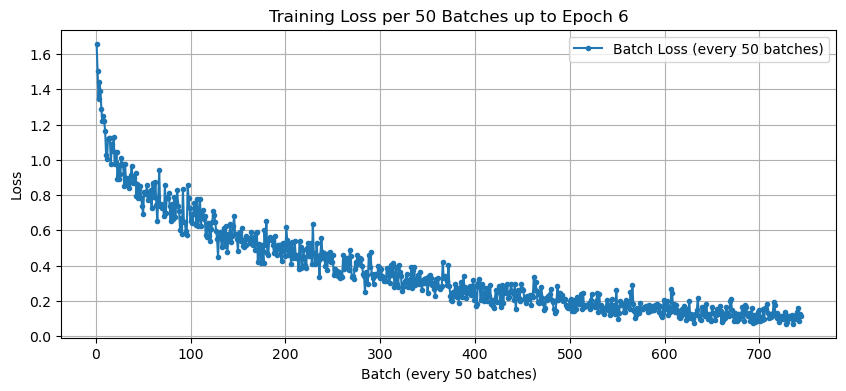

Epoch 7/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.98it/s, loss=0.8235]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 7/15 completed - Train Loss: 0.0947, Val Loss: 0.2229, Val Accuracy: 92.87%, Val Precision: 0.8930, Val Recall: 0.9479

Best model saved at epoch 7 with val loss: 0.2229


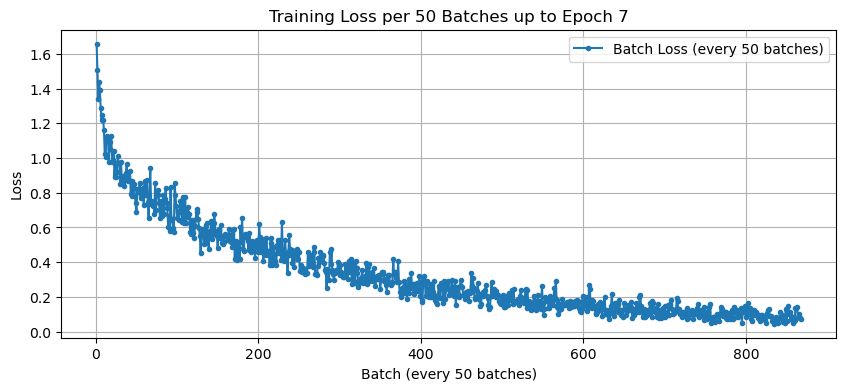

Epoch 8/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.89it/s, loss=0.9195]

Epoch 8/15 completed - Train Loss: 0.0754, Val Loss: 0.2344, Val Accuracy: 92.47%, Val Precision: 0.8690, Val Recall: 0.9386




C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


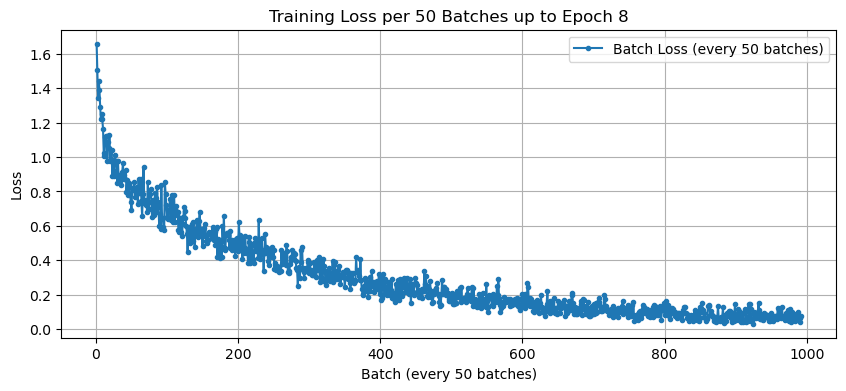

Epoch 9/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.92it/s, loss=0.2276]

Epoch 9/15 completed - Train Loss: 0.0625, Val Loss: 0.2448, Val Accuracy: 91.91%, Val Precision: 0.8552, Val Recall: 0.9467

Early stopping triggered after 9 epochs.



C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


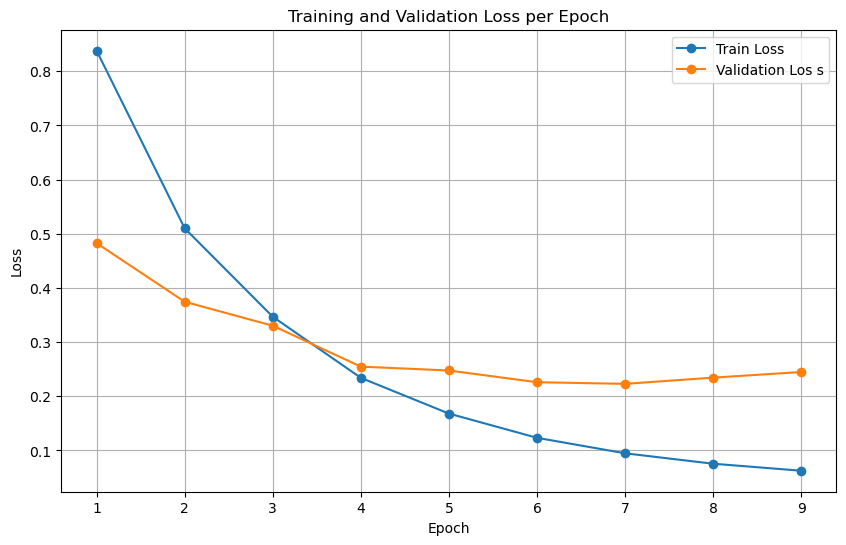

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 6 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_6_cosine.pt'

data_dir = "480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding new head:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Los s', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

### N_freeze = 6, ReduceLROnPlateau scheduler, custom head

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


Epoch 1/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.93it/s, loss=1.0146]


Epoch 1/15 completed - Train Loss: 1.0803, Val Loss: 0.6805, Val Accuracy: 78.32%, Val Precision: 0.6734, Val Recall: 0.5496

Best model saved at epoch 1 with val loss: 0.6805


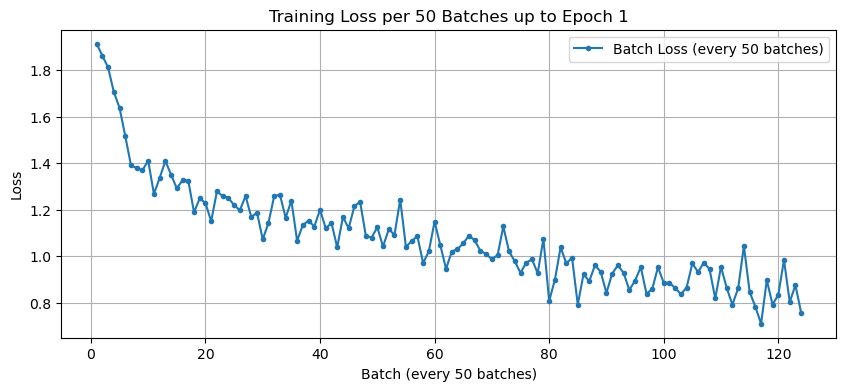

Epoch 2/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.95it/s, loss=0.6630]


Epoch 2/15 completed - Train Loss: 0.6802, Val Loss: 0.4827, Val Accuracy: 83.61%, Val Precision: 0.6495, Val Recall: 0.7427

Best model saved at epoch 2 with val loss: 0.4827


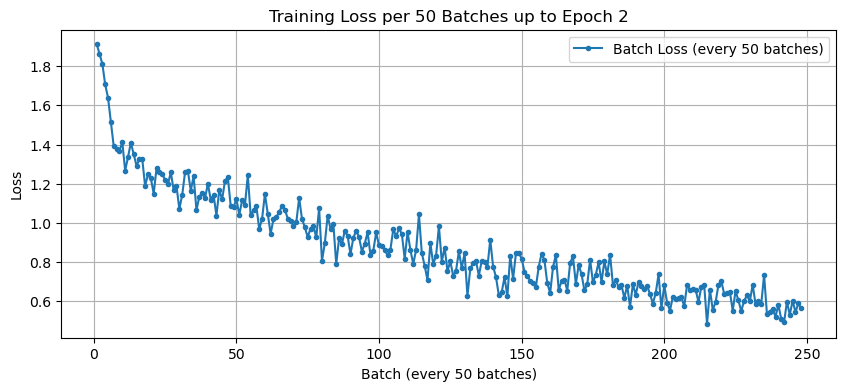

Epoch 3/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.99it/s, loss=0.1982]


Epoch 3/15 completed - Train Loss: 0.4729, Val Loss: 0.3925, Val Accuracy: 86.48%, Val Precision: 0.8241, Val Recall: 0.8016

Best model saved at epoch 3 with val loss: 0.3925


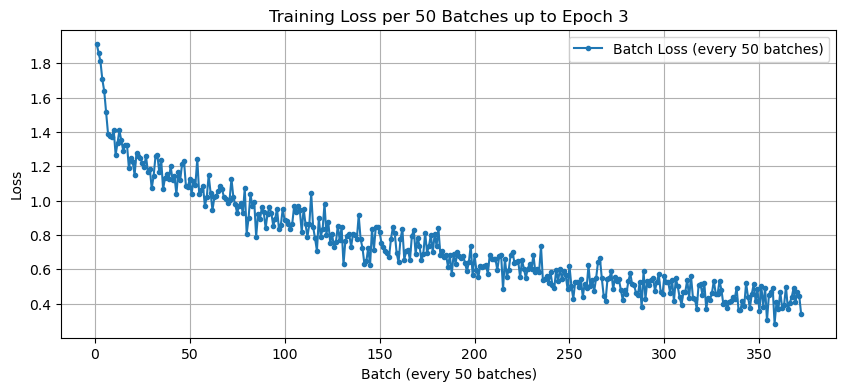

Epoch 4/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 28.03it/s, loss=0.2051]


Epoch 4/15 completed - Train Loss: 0.3399, Val Loss: 0.3217, Val Accuracy: 89.36%, Val Precision: 0.8512, Val Recall: 0.8689

Best model saved at epoch 4 with val loss: 0.3217


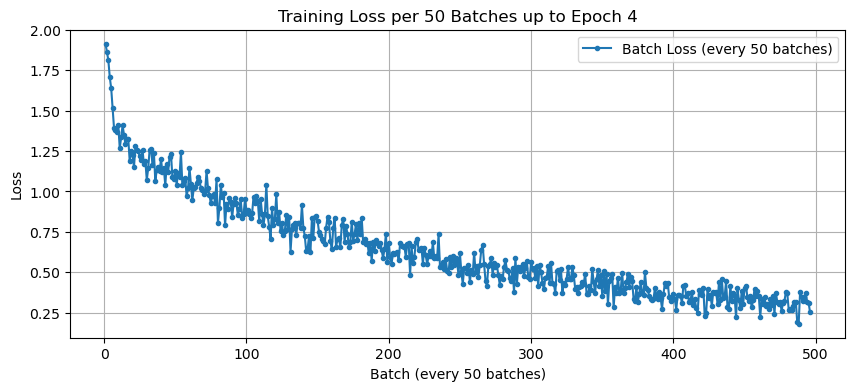

Epoch 5/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 28.05it/s, loss=0.0942]


Epoch 5/15 completed - Train Loss: 0.2413, Val Loss: 0.2822, Val Accuracy: 90.18%, Val Precision: 0.8677, Val Recall: 0.9089

Best model saved at epoch 5 with val loss: 0.2822


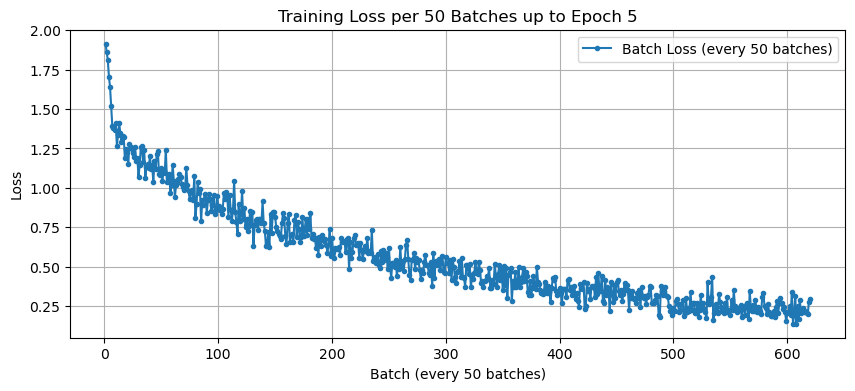

Epoch 6/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 28.03it/s, loss=0.1625]


Epoch 6/15 completed - Train Loss: 0.1773, Val Loss: 0.2482, Val Accuracy: 91.75%, Val Precision: 0.8666, Val Recall: 0.9274

Best model saved at epoch 6 with val loss: 0.2482


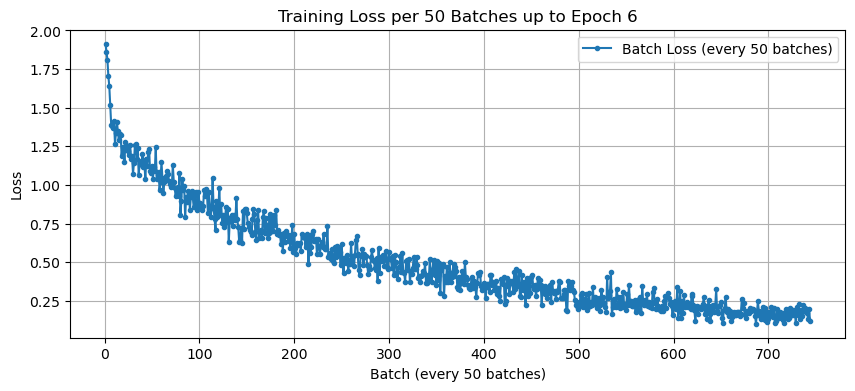

Epoch 7/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.95it/s, loss=0.3031]


Epoch 7/15 completed - Train Loss: 0.1385, Val Loss: 0.2310, Val Accuracy: 92.37%, Val Precision: 0.8631, Val Recall: 0.9437

Best model saved at epoch 7 with val loss: 0.2310


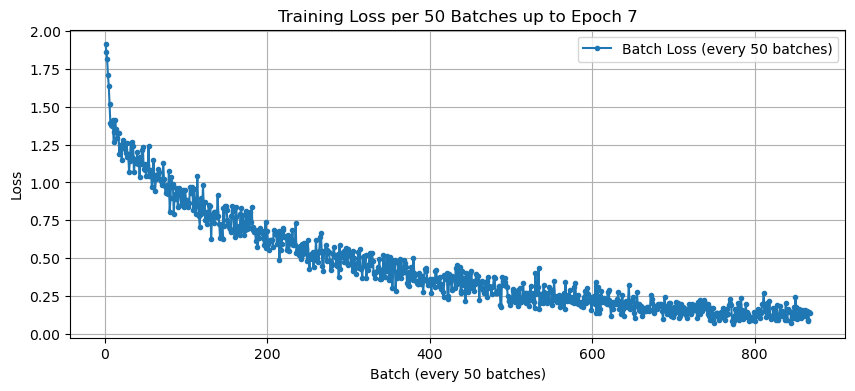

Epoch 8/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.91it/s, loss=0.0266]


Epoch 8/15 completed - Train Loss: 0.1104, Val Loss: 0.2196, Val Accuracy: 92.97%, Val Precision: 0.8968, Val Recall: 0.9369

Best model saved at epoch 8 with val loss: 0.2196


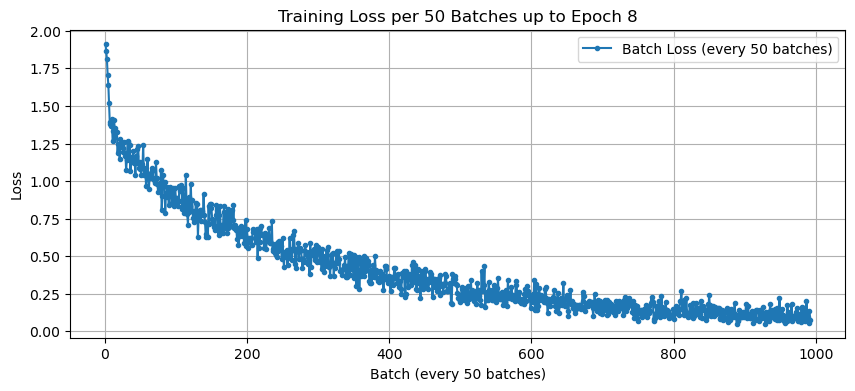

Epoch 9/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.85it/s, loss=0.1046]

Epoch 9/15 completed - Train Loss: 0.0940, Val Loss: 0.2451, Val Accuracy: 92.42%, Val Precision: 0.8918, Val Recall: 0.9453



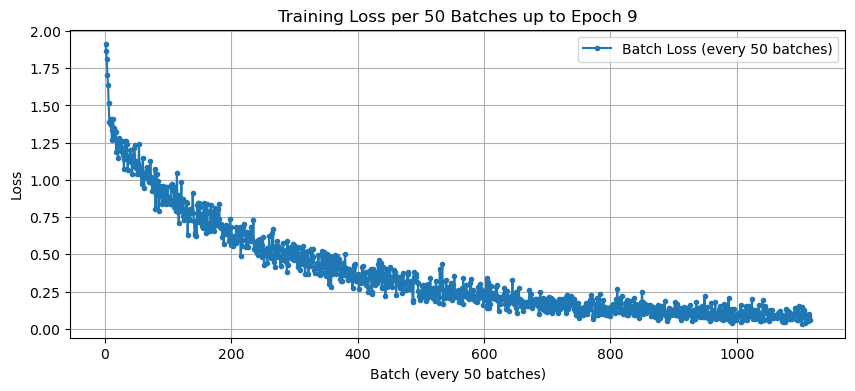

Epoch 10/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.83it/s, loss=0.0116]

Epoch 10/15 completed - Train Loss: 0.0767, Val Loss: 0.2488, Val Accuracy: 92.26%, Val Precision: 0.8723, Val Recall: 0.9502

Early stopping triggered after 10 epochs.


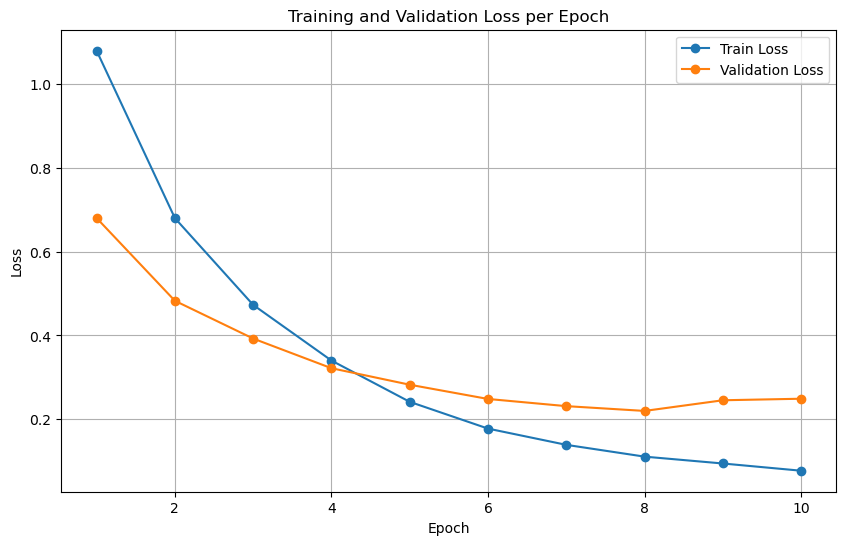

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 6 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_6_plateau_custom_head.pt'

data_dir = "480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding custom layers with dropout:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, 512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(256, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=1, factor=0.5)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()

### N_freeze = 6, CosineAnnealingLR scheduler, custom head

Found 7 classes: ['akiec_augmentations_full_res', 'bcc_augmentations_full_res', 'bkl_augmentations_full_res', 'df_augmentations_full_res', 'mel_augmentations_full_res', 'nv_augmentations_full_res', 'vasc_augmentations_full_res']


Epoch 1/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.93it/s, loss=0.9381]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 1/15 completed - Train Loss: 1.0892, Val Loss: 0.6715, Val Accuracy: 78.44%, Val Precision: 0.6759, Val Recall: 0.5859

Best model saved at epoch 1 with val loss: 0.6715


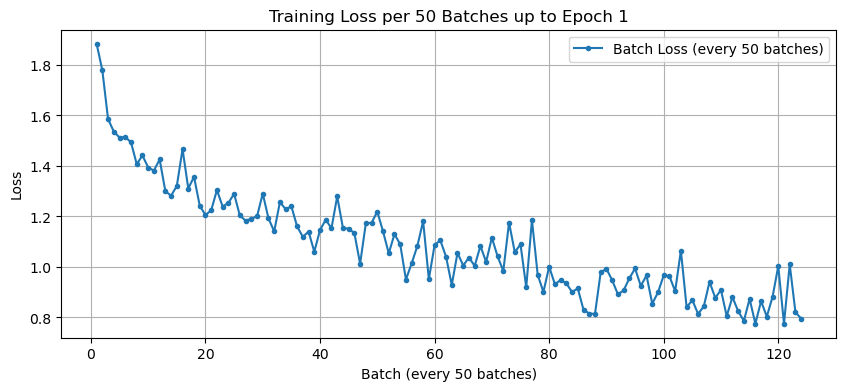

Epoch 2/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.73it/s, loss=0.9212]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 2/15 completed - Train Loss: 0.6651, Val Loss: 0.5022, Val Accuracy: 83.71%, Val Precision: 0.6585, Val Recall: 0.7405

Best model saved at epoch 2 with val loss: 0.5022


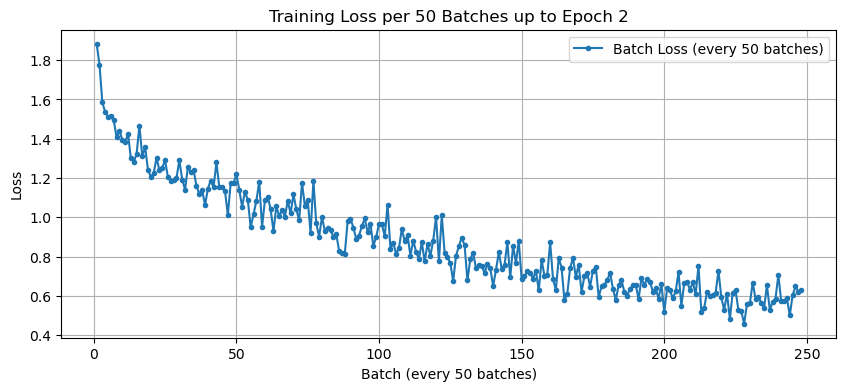

Epoch 3/15 [Val]: 100%|██████████| 2077/2077 [01:15<00:00, 27.66it/s, loss=0.4858]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 3/15 completed - Train Loss: 0.4556, Val Loss: 0.3443, Val Accuracy: 88.06%, Val Precision: 0.8595, Val Recall: 0.8163

Best model saved at epoch 3 with val loss: 0.3443


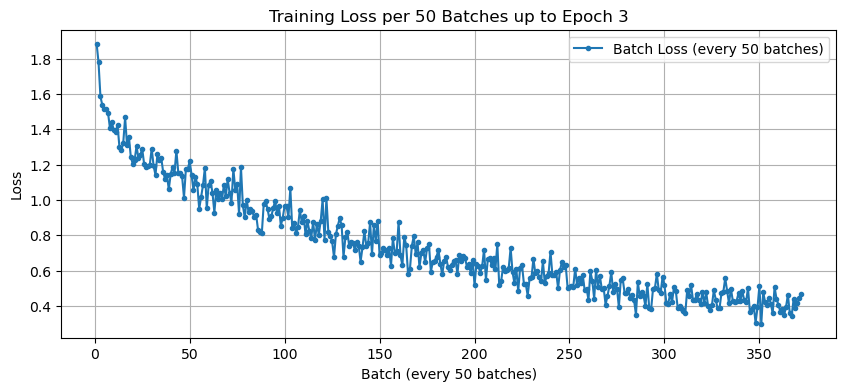

Epoch 4/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.73it/s, loss=0.4959]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 4/15 completed - Train Loss: 0.3356, Val Loss: 0.2924, Val Accuracy: 89.78%, Val Precision: 0.8798, Val Recall: 0.8774

Best model saved at epoch 4 with val loss: 0.2924


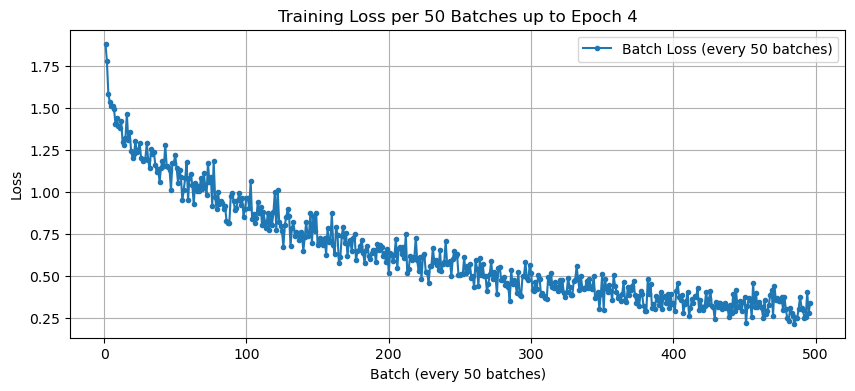

Epoch 5/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.85it/s, loss=0.4204]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 5/15 completed - Train Loss: 0.2348, Val Loss: 0.2793, Val Accuracy: 90.36%, Val Precision: 0.8672, Val Recall: 0.9216

Best model saved at epoch 5 with val loss: 0.2793


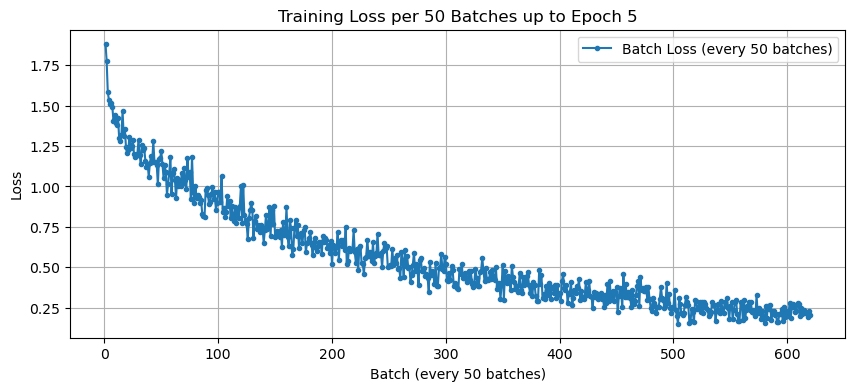

Epoch 6/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.80it/s, loss=0.0736]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 6/15 completed - Train Loss: 0.1841, Val Loss: 0.2632, Val Accuracy: 91.24%, Val Precision: 0.8708, Val Recall: 0.9313

Best model saved at epoch 6 with val loss: 0.2632


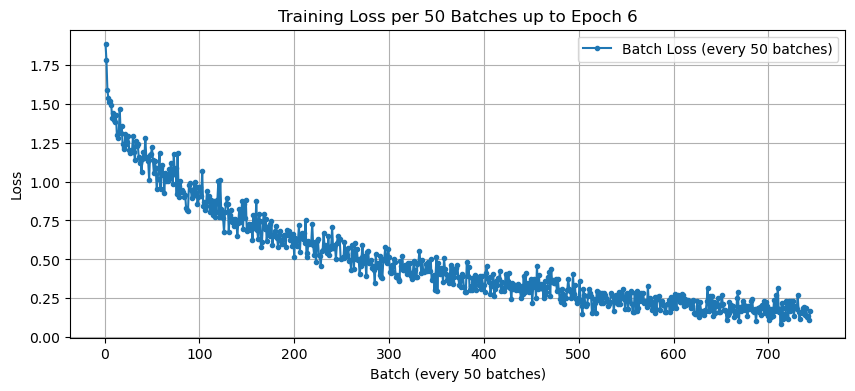

Epoch 7/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.83it/s, loss=0.0787]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 7/15 completed - Train Loss: 0.1448, Val Loss: 0.2118, Val Accuracy: 92.98%, Val Precision: 0.9114, Val Recall: 0.9394

Best model saved at epoch 7 with val loss: 0.2118


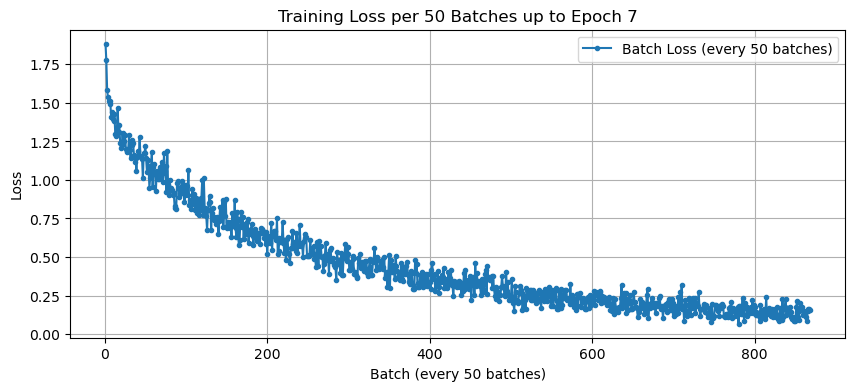

Epoch 8/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.86it/s, loss=0.1593]

Epoch 8/15 completed - Train Loss: 0.1088, Val Loss: 0.2632, Val Accuracy: 91.32%, Val Precision: 0.8817, Val Recall: 0.9399




C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


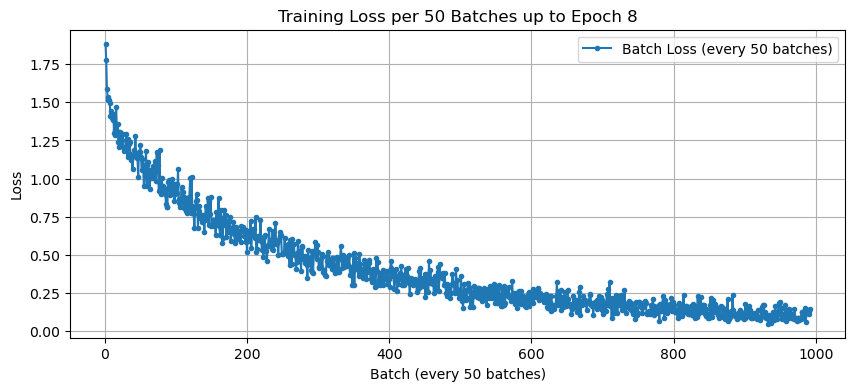

Epoch 9/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.92it/s, loss=0.1672]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 9/15 completed - Train Loss: 0.0935, Val Loss: 0.1859, Val Accuracy: 93.84%, Val Precision: 0.9133, Val Recall: 0.9531

Best model saved at epoch 9 with val loss: 0.1859


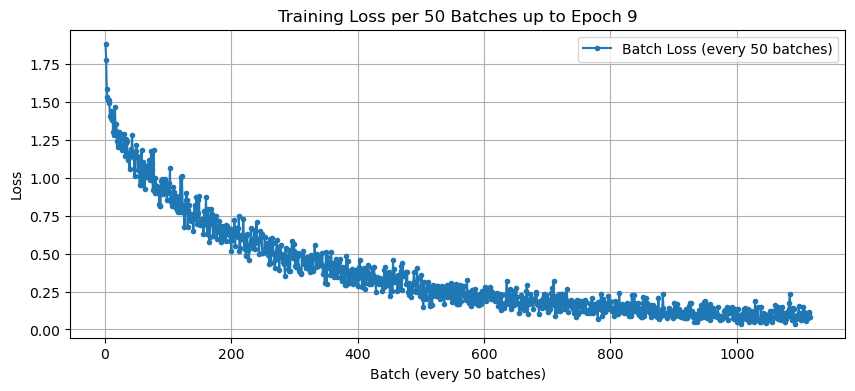

Epoch 10/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.86it/s, loss=0.1844]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 10/15 completed - Train Loss: 0.0820, Val Loss: 0.1805, Val Accuracy: 93.92%, Val Precision: 0.9240, Val Recall: 0.9596

Best model saved at epoch 10 with val loss: 0.1805


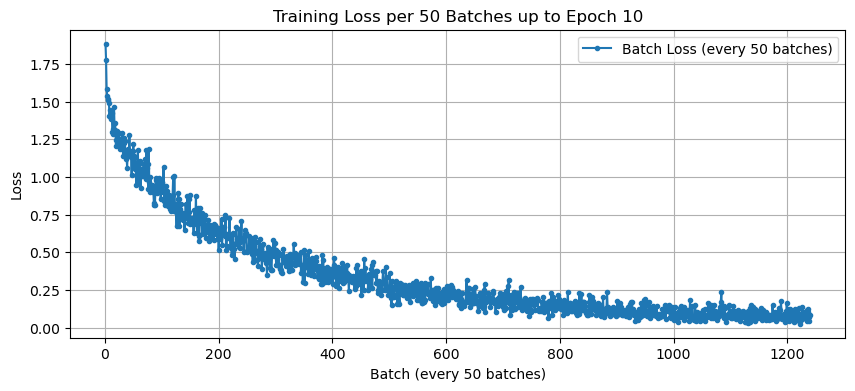

Epoch 11/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.87it/s, loss=0.2019]
C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


Epoch 11/15 completed - Train Loss: 0.0675, Val Loss: 0.1785, Val Accuracy: 94.63%, Val Precision: 0.9312, Val Recall: 0.9560

Best model saved at epoch 11 with val loss: 0.1785


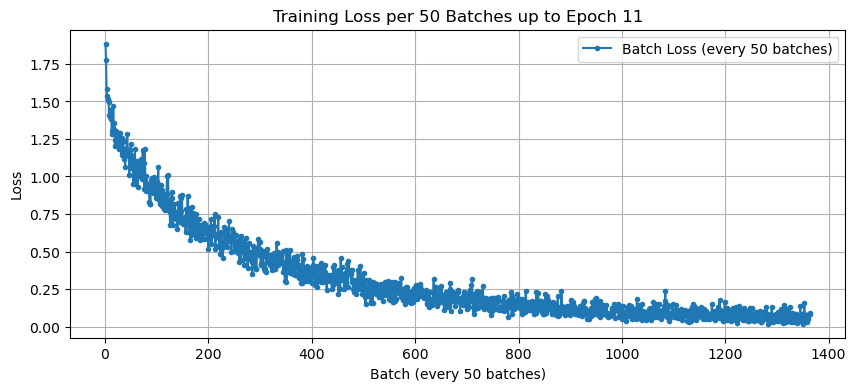

Epoch 12/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.83it/s, loss=1.0302]

Epoch 12/15 completed - Train Loss: 0.0642, Val Loss: 0.1965, Val Accuracy: 93.63%, Val Precision: 0.8923, Val Recall: 0.9506




C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


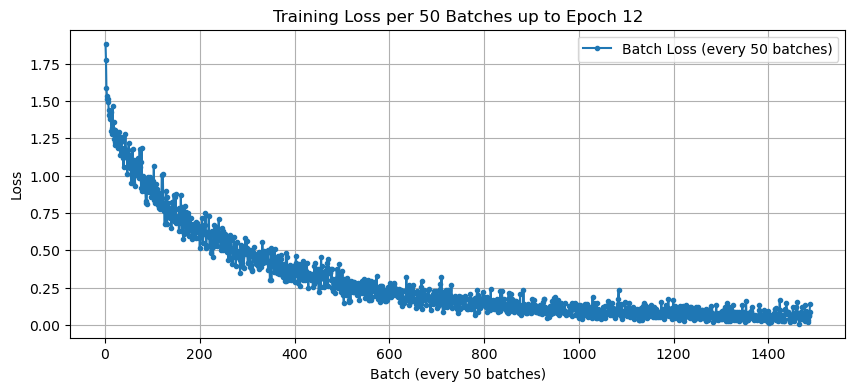

Epoch 13/15 [Val]: 100%|██████████| 2077/2077 [01:14<00:00, 27.81it/s, loss=0.0997]

Epoch 13/15 completed - Train Loss: 0.0541, Val Loss: 0.1852, Val Accuracy: 93.90%, Val Precision: 0.9113, Val Recall: 0.9585

Early stopping triggered after 13 epochs.



C:\Users\Admin\anaconda3\Lib\site-packages\torch\optim\lr_scheduler.py:198: UserWarning: The epoch parameter in `scheduler.step()` was not necessary and is being deprecated where possible. Please use `scheduler.step()` to step the scheduler. During the deprecation, if epoch is different from None, the closed form is used instead of the new chainable form, where available. Please open an issue if you are unable to replicate your use case: https://github.com/pytorch/pytorch/issues/new/choose.
  warnings.warn(EPOCH_DEPRECATION_WARNING, UserWarning)


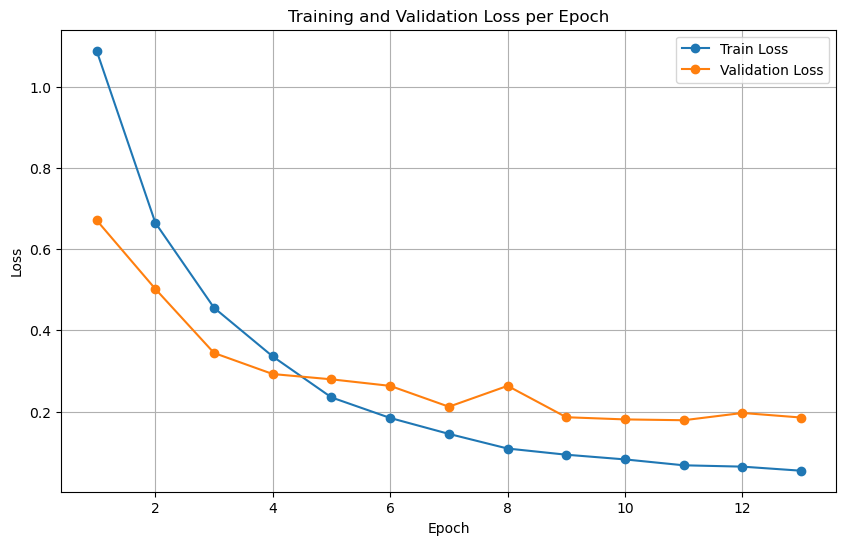

In [ ]:
# Hyperparams:
lr = 1e-5
train_ratio = 0.75
batch_size = 4
epochs = 15
early_stop_patience = 2
N_freeze = 6 # max value 6 because totally 7 blocks
best_model_path = 'best_model_n_6_cosine_custom_head.pt'

data_dir = "480_white/"

# Define transforms: convert to tensor and normalize as per ImageNet stats
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

dataset = datasets.ImageFolder(root=data_dir, transform=transform)
num_classes = len(dataset.classes)
print(f"Found {num_classes} classes: {dataset.classes}")

train_size = int(train_ratio * len(dataset))
val_size = len(dataset) - train_size

generator = torch.Generator().manual_seed(42)
train_dataset, val_dataset = random_split(dataset, [train_size, val_size], generator=generator)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_loader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

model = timm.create_model('tf_efficientnetv2_l.in21k_ft_in1k', pretrained=True)

# Adding custom layers with dropout:
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Linear(in_features, 512),
    nn.ReLU(),
    nn.Dropout(0.5),
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.Dropout(0.3),
    nn.Linear(256, num_classes)
)

if N_freeze > 0:
    for param in model.conv_stem.parameters():
        param.requires_grad = False
    for param in model.bn1.parameters():
        param.requires_grad = False
    for idx, block in enumerate(model.blocks.children()):
        if idx < N_freeze:
            for param in block.parameters():
                param.requires_grad = False
        else:
            break

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model.parameters(), lr=lr)

# Trying different schedulers:

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)

train_losses, val_losses = [], []
batch_losses = []

best_val_loss = float('inf')
no_improve_epochs = 0

for epoch in range(1, epochs + 1):
    model.train()
    running_loss = 0.0
    batch_loss = 0.0
    epoch_batch_losses = []
    train_bar = tqdm(enumerate(train_loader, 1), total=len(train_loader), desc=f"Epoch {epoch}/{epochs} [Train]")

    for batch_idx, (images, labels) in train_bar:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item() * images.size(0)
        batch_loss += loss.item()

        if batch_idx % 50 == 0:
            avg_batch_loss = batch_loss / 50
            epoch_batch_losses.append(avg_batch_loss)
            batch_loss = 0.0

        train_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_train_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    batch_losses.extend(epoch_batch_losses)

    model.eval()
    val_loss = 0.0
    correct = 0
    total = 0
    all_labels, all_preds = [], []

    val_bar = tqdm(val_loader, desc=f"Epoch {epoch}/{epochs} [Val]")
    with torch.no_grad():
        for images, labels in val_bar:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()

            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(predicted.cpu().numpy())

            val_bar.set_postfix(loss=f"{loss.item():.4f}")

    epoch_val_loss = val_loss / len(val_loader.dataset)
    val_accuracy = 100 * correct / total
    val_losses.append(epoch_val_loss)

    val_precision = precision_score(all_labels, all_preds, average='macro', zero_division=0)
    val_recall = recall_score(all_labels, all_preds, average='macro', zero_division=0)

    print(f"Epoch {epoch}/{epochs} completed - "
          f"Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, "
          f"Val Accuracy: {val_accuracy:.2f}%, Val Precision: {val_precision:.4f}, Val Recall: {val_recall:.4f}\n")

    scheduler.step(epoch_val_loss)

    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        no_improve_epochs = 0
        torch.save(model.state_dict(), best_model_path)
        print(f"Best model saved at epoch {epoch} with val loss: {best_val_loss:.4f}")
    else:
        no_improve_epochs += 1
        if no_improve_epochs >= early_stop_patience:
            print(f"Early stopping triggered after {epoch} epochs.")
            break

    plt.figure(figsize=(10, 4))
    plt.plot(range(1, len(batch_losses) + 1), batch_losses, label='Batch Loss (every 50 batches)', marker='.')
    plt.xlabel('Batch (every 50 batches)')
    plt.ylabel('Loss')
    plt.title(f'Training Loss per 50 Batches up to Epoch {epoch}')
    plt.legend()
    plt.grid(True)
    plt.show()

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss', marker='o')
plt.plot(range(1, len(val_losses) + 1), val_losses, label='Validation Loss', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss per Epoch')
plt.legend()
plt.grid(True)
plt.show()